In [ ]:
import webbrowser

webbrowser.open('https://dr7.lamost.org/catalogue')    # Download LAMOST LRS General Catalog and LAMOST MRS General Catalog CSV files

webbrowser.open('https://www.lamost.org/dr8/v2.0/catalogue') 

In [1]:
import pandas as pd
import numpy as np
import scipy as sp

import matplotlib.pyplot as plt

from astroquery.gaia import Gaia
from astroquery.simbad import Simbad

import astropy.coordinates as coord
import astropy.units as u

import pyvo as vo

from matplotlib import gridspec

from specutils import Spectrum1D
from pyvo.dal.ssa  import search, SSAService

import requests
from io import BytesIO

import matplotlib.ticker as plticker

from astropy.stats import sigma_clip

import starcolorindexSpT

from pyasassn.client import SkyPatrolClient
client = SkyPatrolClient()

import warnings
warnings.filterwarnings('ignore')

import webbrowser

from colorama import Fore, Back, Style

<frozen importlib._bootstrap>:219: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


Welcome to ASAS-SN Skypatrol!

Current Deployment Version: 0.6.9 (28 April 2023)
Please upgrade your client if not up to date.



In [2]:
from importlib.metadata import version

import lightkurve as lk
print(version('lightkurve'))

from lightkurve import search_targetpixelfile
from lightkurve import search_lightcurve

2.4.0


In [3]:
import matplotlib
import astroquery
#import pyasassn

print("pandas" + str(pd.__version__))
print("numpy"  + str(np.__version__))
print("scipy"  + str(sp.__version__))

print("matplotlib" + str(matplotlib.__version__))

print("astroquery" + str(astroquery.__version__))

print("lightkurve" + str(lk.__version__))

print("\n")
!python --version

print("\n")
!jupyter --version

pandas1.1.5
numpy1.24.2
scipy1.9.3
matplotlib3.2.2
astroquery0.4.7.dev8479
lightkurve2.4.0


Python 3.8.5


Selected Jupyter core packages...
IPython          : 8.12.0
ipykernel        : 6.19.2
ipywidgets       : 8.0.4
jupyter_client   : 8.1.0
jupyter_core     : 5.3.0
jupyter_server   : 2.5.0
jupyterlab       : not installed
nbclient         : 0.5.13
nbconvert        : 7.3.1
nbformat         : 5.7.0
notebook         : 6.5.3
qtconsole        : 5.4.2
traitlets        : 5.7.1


In [4]:

webbrowser.open('https://www.aavso.org/vsx/index.php?view=about.vartypes')   # VARIABLE TYPES WITHIN MAIN GROUPS

True

In [ ]:
#import webbrowser

webbrowser.open('https://arxiv.org/pdf/2207.01946.pdf')  # Cross-match of Gaia sources with variable objects from the literature

webbrowser.open('https://gea.esac.esa.int/archive/documentation/GDR3/Gaia_archive/chap_datamodel/') # Data model 

webbrowser.open('https://gea.esac.esa.int/archive/documentation/GDR3/Gaia_archive/chap_datamodel/sec_dm_variability_tables/') # Variability tables


In [ ]:
#import webbrowser

webbrowser.open('https://en.wikipedia.org/wiki/List_of_astronomy_acronyms#C')

In [ ]:
#import webbrowser

webbrowser.open('https://www.zooniverse.org/projects/tharinduj/citizen-asas-sn/about/research')

webbrowser.open('https://drive.google.com/drive/folders/1gxcIokRsw1eyPmbPZ0-C8blfRGItSOAu')

webbrowser.open('https://asas-sn.osu.edu/variables')

webbrowser.open('https://www.zooniverse.org/projects/tharinduj/citizen-asas-sn/about/research')

webbrowser.open('https://arxiv.org/pdf/2207.01946.pdf')

webbrowser.open('https://github.com/asas-sn/skypatrol')

webbrowser.open('https://asas-sn.github.io/skypatrol/index.html')

webbrowser.open('http://www.lamost.org/dr8/v2.0/catalogue')

In [ ]:
from IPython.display import display, HTML
display(HTML(data="""
<style>
    div#notebook-container    { width: 95%; }
    div#menubar-container     { width: 65%; }
    div#maintoolbar-container { width: 99%; }
</style>
"""))

In [5]:
Ipython_default = plt.rcParams.copy()

#plt.style.use('dark_background')

# reset rcParams
#plt.rcParams.update(Ipython_default)

In [6]:
#set the figure size to be wide in the horizontal direction
#to accommodate the image cutouts alongside the spectra 
#fsize=[20,13]
fsize=[50,18]
#mpl.rcParams['axes.linewidth'] = 0.7
FSIZE=18
LWIDTH=0.5
LABELSIZE=5

In [7]:
make_canvas_flag = "Y"

hydrogen_lines_flag = "N"

In [8]:
def make_labels(xlabel = '', ylabel = '', fontsize = 12):
    #plt.xlabel(xlabel,  fontsize = fontsize)
    plt.xlabel("Wavelength [Angstroms]",  fontsize = fontsize)
    plt.ylabel(ylabel, fontsize = fontsize)
    plt.xticks(fontsize = fontsize)
    plt.yticks(fontsize = fontsize)
    plt.grid()

In [9]:
def make_RVS_canvas(xlabel = '', ylabel = '', fontsize = 12):
    #plt.xlabel(xlabel,  fontsize = fontsize)
    plt.xlabel("Wavelength [Angstroms]",  fontsize = fontsize)
    plt.ylabel(ylabel, fontsize = fontsize)
    plt.xticks(fontsize = fontsize)
    plt.yticks(fontsize = fontsize)
    plt.grid()

    yMin = float(xp['flux'].min())
    #yRangeMin = yMin + 0.2
    yRangeMin = 1.8 

    yRangeMax = float(xp['flux'].max())
    yRange = yRangeMax

    plt.annotate('Ca II 8498', xy=[8498, yRangeMin ],  rotation=-90, color='red')
    plt.annotate('Ca II 8542', xy=[8542, yRangeMin ], rotation=-90, color='red')
    plt.annotate('Pa14 8600', xy=[8600, yRangeMin - 0.3 ], rotation=-90, color='red')
    plt.annotate('Ca II 8662.1', xy=[8662, yRangeMin ],  rotation=-90, color='red')

In [10]:
# Plotter ==============================================
def make_canvas(xlabel = '', ylabel = '', fontsize = 12):
    #plt.xlabel(xlabel,  fontsize = fontsize)
    plt.xlabel("Wavelength [Angstroms]",  fontsize = fontsize)
    plt.ylabel(ylabel, fontsize = fontsize)
    plt.xticks(fontsize = fontsize)
    plt.yticks(fontsize = fontsize)
    plt.grid()

    plt.xticks([3839, 3889, 3970, 4101, 4340, 4472, 4861, 5175, 5270, 5411, 5755, 5895, 6302,
               6365, 6562, 6562, 6890, 7135, 7500, 7775, 8000, 8498, 8542, 8662, 9000, 9200])
    
    xLabels = (3839, 3889, 3970, 4101, 4340, 4472, 4861, 5175, 5270, 5411, 5755, 5895, 6302,
               6365, 6562, 6562, 6890, 7135, 7500, 7775, 8000, 8498, 8542, 8662, 9000, 9200)

    plt.xticks(xLabels, rotation=90)

    yMin = float(xp['flux'].min())
    #yRangeMin = yMin + 0.2
    yRangeMin = 0.8 

    yRangeMax = float(xp['flux'].max())
    yRange = yRangeMax

    plt.annotate('CN 3839', xy=[3839,   yRangeMin + 0.6],  rotation=-90)
    plt.annotate('H-zeta 3889', xy=[3889, yRangeMin +  .20],  rotation=-90, color='red')
    plt.annotate('H-epsilon 3970', xy=[3970, yRangeMin +  0.6],  rotation=-90, color='red')
    plt.annotate('H-delta 4101', xy=[4101, yRangeMin +  .20],  rotation=-90, color='red')
    plt.annotate('H-gamma 4340', xy=[4340, yRangeMin + .20],  rotation=-90, color='red')
    plt.annotate('He I 4471.7', xy=[4472, yRangeMin + .20],  rotation=-90, color='orange')
    plt.annotate('H-beta 4861', xy=[4861, yRangeMin + .20],  rotation=-90, color='red')
    plt.annotate('Mg I 5175', xy=[5175, yRangeMin + .20],  rotation=-90)
    plt.annotate('Fe I 5270', xy=[5270, yRangeMin +  .20],  rotation=-90)
    plt.annotate('He II 5411', xy=[5411, yRangeMin +  .20],  rotation=-90, color='orange')
    plt.annotate('N II 5755', xy=[5755, yRangeMin +  .20],  rotation=-90)
    plt.annotate('D1 Na I 5895', xy=[5895, yRangeMin +  .20],  rotation=-90, color='blue')
    plt.annotate('OI 6302', xy=[6302, yRangeMin +  .20],  rotation=-90, color='green')
    plt.annotate('OI 6365.5', xy=[6365, yRangeMin +  .20],  rotation=-90, color='green')
    plt.annotate('H-alpha 6562', xy=[6562, yRangeMin +  .20],  rotation=-90, color='red')
    plt.annotate('CN 6890', xy=[6890, yRangeMin +  .20],  rotation=-90)
    plt.annotate('Ar III 7135', xy=[7135, yRangeMin +  .20],  rotation=-90)
    plt.annotate('O I 7775', xy=[7775, yRangeMin +  .20], rotation=-90, color='green')
    plt.annotate('Ca II 8498', xy=[8498, yRangeMin +  .35],  rotation=-90, color='red')
    plt.annotate('Ca II 8542', xy=[8542, yRangeMin +  .30], rotation=-90, color='red')
    plt.annotate('Ca II 8662.1', xy=[8662, yRangeMin +  .30],  rotation=-90, color='red')


def Hydrogen_lines(xlabel = '', ylabel = '', fontsize = 12):
    #plt.xlabel(xlabel,  fontsize = fontsize)
    plt.xlabel("Wavelength [Angstroms]",  fontsize = fontsize)
    plt.ylabel(ylabel, fontsize = fontsize)
    plt.xticks(fontsize = fontsize)
    plt.yticks(fontsize = fontsize)
    plt.grid()

    plt.xticks([3835, 3889, 3970, 4101, 4340, 4861, 6000, 6562, 7000, 8000, 9000, 10000])
    
    xLabels = (3835, 3889, 3970, 4101, 4340, 4861, 6000, 6562, 7000, 8000, 9000, 10000)

    plt.xticks(xLabels, rotation=90)

    yMin = float(xp['flux'].min())
    #yRangeMin = yMin + 0.2
    yRangeMin = 0.8 

    yRangeMax = float(xp['flux'].max())
    yRange = yRangeMax

    plt.annotate('H12 3750', xy=[3750, yRangeMin +  .50],  rotation=-90, color='red')
    plt.annotate('H11 3771', xy=[3771, yRangeMin -  .35],  rotation=-90, color='red')
    plt.annotate('H10 3798', xy=[3798, yRangeMin +  .20],  rotation=-90, color='red')
    plt.annotate('H9 3835', xy=[3835, yRangeMin -  .10],  rotation=-90, color='red')

    plt.annotate('H8-zeta 3889', xy=[3889, yRangeMin +  .20],  rotation=-90, color='red')
    plt.annotate('H-epsilon 3970', xy=[3970, yRangeMin +  0.6],  rotation=-90, color='red')
    plt.annotate('H-delta 4101', xy=[4101, yRangeMin +  .20],  rotation=-90, color='red')
    plt.annotate('H-gamma 4340', xy=[4340, yRangeMin + .20],  rotation=-90, color='red')
    plt.annotate('H-beta 4861', xy=[4861, yRangeMin + .20],  rotation=-90, color='red')
    plt.annotate('H-alpha 6562', xy=[6562, yRangeMin +  .20],  rotation=-90, color='red')

In [11]:
def make_RVS_canvas1(xlabel = '', ylabel = '', fontsize = 12):     ### 8460 - 8580
    plt.xlabel("Wavelength [Angstroms]",  fontsize = fontsize)
    plt.ylabel(ylabel, fontsize = fontsize)
    plt.xticks(fontsize = fontsize)
    plt.yticks(fontsize = fontsize)
    plt.grid()

    yMin = float(xp['flux'].min())
    yRangeMin = 1.8 

    yRangeMax = float(xp['flux'].max())
    yRange = yRangeMax

    plt.annotate('Fe I 8470', xy=[8470, yRangeMin ],  rotation=-90, color='green')
    plt.annotate('Mg I 8476', xy=[8476, yRangeMin - 0.3],  rotation=-90, color='blue')
    plt.annotate('Fe I 8483', xy=[8483, yRangeMin - 0.3],  rotation=-90, color='green')
    plt.annotate('Ca II 8498', xy=[8498, yRangeMin ],  rotation=-90, color='red')
    plt.annotate('Ca II 8502', xy=[8502, yRangeMin],  rotation=-90, color='red')
    plt.annotate('Ce II 8514', xy=[8514, yRangeMin - 0.3],  rotation=-90, color='green')
    plt.annotate('Fe I 8516', xy=[8516, yRangeMin - 0.3],  rotation=-90, color='green')
    plt.annotate('Ti I 8520.6', xy=[8520.6, yRangeMin - 0.3],  rotation=-90, color='blue')
    plt.annotate('Zr II 8527', xy=[8527, yRangeMin - 0.3],  rotation=-90, color='green')
    plt.annotate('Fe I 8529', xy=[8529, yRangeMin - 0.3],  rotation=-90, color='green')
    plt.annotate('Si I 8538', xy=[8538, yRangeMin - 0.3],  rotation=-90, color='red')
    plt.annotate('Ca II 8542', xy=[8542, yRangeMin],  rotation=-90, color='red')
    plt.annotate('Ca II 8546', xy=[8546, yRangeMin - 0.3],  rotation=-90, color='red')
    plt.annotate('Cr I 8551', xy=[8551, yRangeMin  - 0.3],  rotation=-90, color='green')
    plt.annotate('Si I 8559', xy=[8559, yRangeMin  - 0.3],  rotation=-90, color='red')
    plt.annotate('Ti I 8572', xy=[8572, yRangeMin - 0.3],  rotation=-90, color='blue')
    plt.annotate('Fe I 8574', xy=[8574, yRangeMin - 0.3],  rotation=-90, color='green')

In [12]:
def make_RVS_canvas2(xlabel = '', ylabel = '', fontsize = 12):    ### 8580 - 8700
    plt.xlabel("Wavelength [Angstroms]",  fontsize = fontsize)
    plt.ylabel(ylabel, fontsize = fontsize)
    plt.xticks(fontsize = fontsize)
    plt.yticks(fontsize = fontsize)
    plt.grid()

    yMin = float(xp['flux'].min())
    yRangeMin = 1.8 

    yRangeMax = float(xp['flux'].max())
    yRange = yRangeMax

    plt.annotate('Fe I 8584', xy=[8584, yRangeMin - 0.3],  rotation=-90, color='green')
    plt.annotate('Fe II 8588', xy=[8588, yRangeMin - 0.3],  rotation=-90, color='green')
    plt.annotate('Nd II 8594', xy=[8594, yRangeMin - 0.3],  rotation=-90, color='blue')
    plt.annotate('Fe I 8624', xy=[8624, yRangeMin - 0.3],  rotation=-90, color='green')
    plt.annotate('N I 8631',  xy=[8631, yRangeMin  - 0.3 ],  rotation=-90, color='red')
    plt.annotate('Ca I 8636',  xy=[8636, yRangeMin  - 0.3 ],  rotation=-90, color='red')
    plt.annotate('Ni I 8639',  xy=[8639, yRangeMin  - 0.3 ],  rotation=-90, color='red')
    plt.annotate('Cr I 8645', xy=[8645, yRangeMin  - 0.3],  rotation=-90, color='green')
    plt.annotate('Ca II 8662', xy=[8662, yRangeMin],  rotation=-90, color='red')
    plt.annotate('Ca II 8666', xy=[8666, yRangeMin],  rotation=-90, color='red')
    plt.annotate('S I 8672',  xy=[8672, yRangeMin  - 0.3],  rotation=-90, color='red')
    plt.annotate('Fe I 8677', xy=[8677, yRangeMin],  rotation=-90, color='green')
    plt.annotate('N I 8685',  xy=[8685, yRangeMin  - 0.3],  rotation=-90, color='red')
    plt.annotate('Si I 8688', xy=[8688, yRangeMin  - 0.3],  rotation=-90, color='red')
    plt.annotate('Fe I 8691', xy=[8691, yRangeMin - 0.3],  rotation=-90, color='green')
    plt.annotate('Ti I 8694', xy=[8694, yRangeMin - 0.3],  rotation=-90, color='green')
    plt.annotate('S I 8697',  xy=[8697, yRangeMin  - 0.3 ],  rotation=-90, color='red')

In [13]:
def PlotTarget4(target, i, targetstring, freqmin, freqmax):
    import matplotlib.pyplot as plt
    plt.style.use('dark_background');
    import matplotlib.pyplot as plt

    import astropy.units as u

    from lightkurve import search_targetpixelfile
    

    plt.rcParams.update({'figure.max_open_warning': 0})
    


    lc = lk.search_lightcurve(target)[i].download();

    #lc = lc0.remove_nans().normalize().remove_outliers()
    #lc = lc0.flatten()
    #lc = lc0.remove_outliers()
    #lc = lc0.remove_outliers(sigma=3)


    if plot_pixelfile == 'Y':
        plt.style.use('dark_background');
        pixelfile = search_targetpixelfile(target)[i].download()
        pixelfile.plot(frame=1);
        pixel_lc = pixelfile.to_lightcurve(aperture_mask='all')
        pixel_lc.plot()
        sText = "\nPixelfile Lightcurve Plot"
        plt.title(str(target) + " (" + str(i) + ")"  + sText);


    if plot_lightcurve  == "Y":
        plt.style.use('dark_background');
        #plt.figure(figsize=(13, 10))
        lc.plot()
        #lc.plot(label='Lightcurve Plot2')
        sText = "\nLightcurve Plot"
        plt.title(str(target) + " (" + str(i) + ")"  + sText);

        if plot_PDC_AP_Flux == 'Y':
            plt.style.use('dark_background');
            ax = lc.plot(column='pdcsap_flux', label='PDCSAP Flux', normalize=True)
            lc.plot(column='sap_flux', label='SAP Flux', normalize=True, ax=ax);
            plt.title(str(target) + " (" + str(i) + ")"  + "\nCompare the PDCSAP and the SAP flux");

        #ax = lc.plot()
        #ax.set_title("PDCSAP light curve of " + str(target));
    
    #period = np.linspace(1, 20, 10000)
    period = np.linspace(freqmin, freqmax, 10000)
    bls = lc.to_periodogram(method='bls', period=period, frequency_factor=500);
    #bls = lc.normalize().to_periodogram(method='bls', period=period, frequency_factor=500);
    
    period_array = bls.period
    period_rounded = np.round(period_array, 1)
    power_array = bls.power

    # Save the highest peak as the planet candidate
    #index = np.argmax(power_array.power)
    #bls_period = period_array.period[index]


    df_dict = {
        'Period': period_rounded,
        'Power': power_array
        }
    df = pd.DataFrame(df_dict)
    df = df.sort_values(by=['Power'], ascending=False)
    df = df.drop_duplicates(subset=['Period'], keep='first')
    #print(df[0:10])


    planet_period = bls.period_at_max_power
    planet_t0 = bls.transit_time_at_max_power
    planet_dur = bls.duration_at_max_power

    if plot_period      == "Y":
        plt.style.use('dark_background');
        #plt.figure(figsize=(13, 10))
        #print("Period Array: " + str(period_array))
        bls.plot()
        #plt.title(str(target) + " (" + str(i) + ")" + str(targetstring) + "\n                    LightKurve Period:  " + str(planet_period));
        plt.title(str(target) + " (" + str(i) + ")" + str(targetstring) + "\n                    LightKurve Period:   + {0:.4f} ".format(planet_period)+ "\nlc = lk.search_lightcurve(target)[i].download()");
        #plt.axvline(bls_period, color="C1", lw=5, alpha=0.8)
        # + "\nPeriod array: " + str(period_array)  + "\nPower array: " + str(power_array)
        #print(df['Period'][0:10])


    if plot_phase_fold  == "Y":
        plt.style.use('dark_background');
        #plt.figure(figsize=(13, 10))
        ax = lc.fold(period=planet_period, epoch_time=planet_t0).scatter()
        ax.set_xlim(-5, 5)
        sText = "\nPhase-fold the light curve to confirm period and transit time (epoch) \ncorrespond to a transit signal."
        plt.title(str(target) + " (" + str(i) + ")"  + sText);
        plt.show();
        

    if plot_half_phase_fold == "Y":
        plt.style.use('dark_background');
        ax = lc.fold(period=0.5*planet_period, epoch_time=planet_t0).scatter()
        ax.set_xlim(-5, 5)
        sText1 = "\nThe above eclipses may not line up or look like the correct period of an eclipsing binary."  
        sText2 = "\nThis is common for eclipsing binaries with deep secondary eclipses, we may have found a harmonic of the period." 
        sText3 = "\nLet's plot it again with half the period."
        plt.title(str(target) + " (" + str(i) + ")"  + sText1 + sText2 + sText3)
        plt.show();

    if plot_2phase_fold == "Y":
        plt.style.use('dark_background');
        #plt.figure(figsize=(13, 10))
        ax = lc.fold(period=2*planet_period, epoch_time=planet_t0).scatter()
        ax.set_xlim(-5, 5)
        sText1 = "\nThe above eclipses may not line up or look like the correct period of an eclipsing binary."  
        sText2 = "\nThis is common for eclipsing binaries with deep secondary eclipses, we may have found a harmonic of the period." 
        sText3 = "\nLet's plot it again with twice the period."
        plt.title(str(target) + " (" + str(i) + ")"  + sText1 + sText2 + sText3)
        plt.show();

    if plot_3phase_fold == "Y":
        plt.style.use('dark_background');
        #plt.figure(figsize=(13, 10))
        ax = lc.fold(period=3*planet_period, epoch_time=planet_t0).scatter()
        ax.set_xlim(-5, 5)
        sText1 = "\nThe above eclipses may not line up or look like the correct period of an eclipsing binary."  
        sText2 = "\nThis is common for eclipsing binaries with deep secondary eclipses, we may have found a harmonic of the period." 
        sText3 = "\nLet's plot it again with three times the period."
        plt.title(str(target) + " (" + str(i) + ")"  + sText1 + sText2 + sText3)
        plt.show();

    if plot_4phase_fold == "Y":
        plt.style.use('dark_background');
        #plt.figure(figsize=(13, 10))
        ax = lc.fold(period=4*planet_period, epoch_time=planet_t0).scatter()
        ax.set_xlim(-5, 5)
        sText1 = "\nThe above eclipses may not line up or look like the correct period of an eclipsing binary."  
        sText2 = "\nThis is common for eclipsing binaries with deep secondary eclipses, we may have found a harmonic of the period." 
        sText3 = "\nLet's plot it again with quadruple the period."
        plt.title(str(target) + " (" + str(i) + ")"  + sText1 + sText2 + sText3)
        plt.show();
        """pg = lc.to_periodogram(minimum_period=0.9*u.day, maximum_period=1.2*u.day, oversample_factor=10)
        pg.period_at_max_power
        lc.fold(period=4*pg.period_at_max_power, wrap_phase=0.2).scatter();
        sText1 = "\nThe above eclipses may not line up or look like the correct period of an eclipsing binary."  
        sText2 = "\nThis is common for eclipsing binaries with deep secondary eclipses, we may have found a harmonic of the period." 
        sText3 = "\nLet's plot it again with quadruple the period."
        plt.title(str(target) + " (" + str(i) + ")"  + sText1 + sText2 + sText3)
        plt.show();"""

    
    if plot_periodogram == "Y":
        plt.style.use('dark_background');
        pg = lc.to_periodogram(oversample_factor=1)
        pg.plot()
        sText = "\nPlot the periodogram in the same way that we plot the original light curve."
        plt.title(str(target) + " (" + str(i) + ")" + str(targetstring)   + sText)
        plt.show()

        pg.plot(view='period', scale='log')
        sText = "\nLet's plot it in period space, so that we can see what period the oscillation is occurring at."
        plt.title(str(target) + " (" + str(i) + ")" + str(targetstring) + sText)
        plt.show()

        lc.fold(period=pg.period_at_max_power).scatter()
        sText = "\nLet's use the period_at_max_power to fold the light curve"
        plt.title(str(target) + " (" + str(i) + ")" + str(targetstring) + sText)
        plt.show()

        lc.fold(period=4*pg.period_at_max_power, wrap_phase=0.2).scatter()
        sText = "\nIf the eclipses do not line up, try plotting it again with quadruple the period."
        plt.title(str(target) + " (" + str(i) + ")" + str(targetstring) + sText)
        plt.show()

        pg = lc.to_periodogram(minimum_period=0.9*u.day, maximum_period=1.2*u.day, oversample_factor=10)
        pg.period_at_max_power  
        sText ="\nLet's try to get a more precise period by increasing the number of points in our periodogram \nusing the `oversample_factor` parameter and by constraining the range of the period value:"
        #sText ="\nLet's try to get a more precise period by increasing the number of points in our periodogram \nusing the `oversample_factor` parameter."
        lc.fold(period=pg.period_at_max_power, wrap_phase=0.2).scatter()
        #lc.fold(period=pg.period_at_max_power).scatter()
        plt.title(str(target) + " (" + str(i) + ")" + str(targetstring)  + sText)
        plt.show()

    plt.figure(figsize=(13.5, 1))
    plt.axhline(y=0.5, color='r', linestyle='-')
    plt.axis('off')
    plt.close()

In [14]:
def PlotTarget4B(target, i, targetstring, freqmin, freqmax, target1):
    import matplotlib.pyplot as plt
    plt.style.use('dark_background');

    import matplotlib.pyplot as plt

    import astropy.units as u
    

    plt.rcParams.update({'figure.max_open_warning': 0})
    

    #print(Fore.RED + "PlotTarget4B: i = " + str(i))
    print(Fore.RED + "PlotTarget4B: target = " + str(target))
    print(Style.RESET_ALL)

    lc0 = lk.search_lightcurve(target)[i].download();
    
    #print("PlotTarget4B: lc0 = " + str(lc0))
    
    #print(Fore.RED + "PlotTarget4B: lc0 length = " + str(len(lc0)))
    print(Style.RESET_ALL)

    lc = lc0.remove_nans().normalize().remove_outliers()

    
    #lc = lc0.flatten()
    #lc = lc0.remove_outliers()
    #lc = lc0.remove_outliers(sigma=3)


    if plot_lightcurve  == "Y":
        plt.style.use('dark_background');
        #plt.figure(figsize=(13, 10))
        lc.plot()
        #lc.plot(label='Lightcurve Plot2')
        sText = "\nLightcurve Plot"
        plt.title(str(target1) + " (" + str(i) + ")"  + sText);
       
    
    #period = np.linspace(1, 20, 10000)
    period = np.linspace(freqmin, freqmax, 10000)
    bls = lc.to_periodogram(method='bls', period=period, frequency_factor=500);
    #bls = lc.normalize().to_periodogram(method='bls', period=period, frequency_factor=500);
    
    period_array = bls.period
    period_rounded = np.round(period_array, 1)
    power_array = bls.power

    # Save the highest peak as the planet candidate
    #index = np.argmax(power_array.power)
    #bls_period = period_array.period[index]


    df_dict = {
        'Period': period_rounded,
        'Power': power_array
        }
    df = pd.DataFrame(df_dict)
    df = df.sort_values(by=['Power'], ascending=False)
    df = df.drop_duplicates(subset=['Period'], keep='first')
    #print(df[0:10])


    planet_period = bls.period_at_max_power
    planet_t0 = bls.transit_time_at_max_power
    planet_dur = bls.duration_at_max_power

    if plot_period      == "Y":
        plt.style.use('dark_background');
        #plt.figure(figsize=(13, 10))
        #print("Period Array: " + str(period_array))
        bls.plot()
        #plt.title(str(target) + " (" + str(i) + ")" + str(targetstring) + "\n                    LightKurve Period:  " + str(planet_period));
        plt.title(str(target1) + " (" + str(i) + ")" + str(targetstring) + "\n                    LightKurve Period:   + {0:.4f} ".format(planet_period) + "\nlc0.remove_nans().normalize().remove_outliers()");
        #plt.axvline(bls_period, color="C1", lw=5, alpha=0.8)
        # + "\nPeriod array: " + str(period_array)  + "\nPower array: " + str(power_array)
        #print(df['Period'][0:10])


    if plot_phase_fold  == "Y":
        plt.style.use('dark_background');
        #plt.figure(figsize=(13, 10))
        ax = lc.fold(period=planet_period, epoch_time=planet_t0).scatter()
        ax.set_xlim(-5, 5)
        sText = "\nPhase-fold the light curve to confirm period and transit time (epoch) \ncorrespond to a transit signal."
        plt.title(str(target1) + " (" + str(i) + ")"  + sText);
        plt.show();

    if plot_4phase_fold == "Y":
        plt.style.use('dark_background');
        #plt.figure(figsize=(13, 10))
        pg = lc.to_periodogram(minimum_period=0.9*u.day, maximum_period=1.2*u.day, oversample_factor=10)
        pg.period_at_max_power
        lc.fold(period=4*pg.period_at_max_power, wrap_phase=0.2).scatter();
        sText1 = "\nThe above eclipses may not line up or look like the correct period of an eclipsing binary."  
        sText2 = "\nThis is common for eclipsing binaries with deep secondary eclipses, we may have found a harmonic of the period." 
        sText3 = "\nLet's plot it again with quadruple the period."
        plt.title(str(target1) + " (" + str(i) + ")"  + sText1 + sText2 + sText3)
        plt.show();

    
    if plot_periodogram == "Y":
        plt.style.use('dark_background');
        pg = lc.to_periodogram(oversample_factor=1)
        pg.plot()
        sText = "\nPlot the periodogram in the same way that we plot the original light curve."
        plt.title(str(target1) + " (" + str(i) + ")" + str(targetstring)   + sText)
        plt.show()

        pg.plot(view='period', scale='log')
        sText = "\nLet's plot it in period space, so that we can see what period the oscillation is occurring at."
        plt.title(str(target1) + " (" + str(i) + ")" + str(targetstring) + sText)
        plt.show()

        lc.fold(period=pg.period_at_max_power).scatter()
        sText = "\nLet's use the period_at_max_power to fold the light curve"
        plt.title(str(target1) + " (" + str(i) + ")" + str(targetstring) + sText)
        plt.show()

        lc.fold(period=4*pg.period_at_max_power, wrap_phase=0.2).scatter()
        sText = "\nIf the eclipses do not line up, try plotting it again with quadruple the period."
        plt.title(str(target1) + " (" + str(i) + ")" + str(targetstring) + sText)
        plt.show()

        pg = lc.to_periodogram(minimum_period=0.9*u.day, maximum_period=1.2*u.day, oversample_factor=10)
        pg.period_at_max_power  
        sText ="\nLet's try to get a more precise period by increasing the number of points in our periodogram \nusing the `oversample_factor` parameter and by constraining the range of the period value:"
        #sText ="\nLet's try to get a more precise period by increasing the number of points in our periodogram \nusing the `oversample_factor` parameter."
        lc.fold(period=pg.period_at_max_power, wrap_phase=0.2).scatter()
        #lc.fold(period=pg.period_at_max_power).scatter()
        plt.title(str(target1) + " (" + str(i) + ")" + str(targetstring)  + sText)
        plt.show()

    plt.figure(figsize=(13.5, 1))
    plt.axhline(y=0.5, color='r', linestyle='-')
    plt.axis('off')
    plt.close()

In [15]:
def PlotTarget5(target, i, targetstring, freqmin, freqmax):

    import matplotlib.pyplot as plt
    plt.style.use('dark_background');

    # https://gallery.exoplanet.codes/tutorials/tess/

    import matplotlib.pyplot as plt

    import astropy.units as u

    import numpy as np
    import lightkurve as lk
    
    from astropy.io import fits
    
    plt.rcParams.update({'figure.max_open_warning': 0})
    

    lc_file = lk.search_lightcurve(target)[i].download();

    lc = lc_file.remove_nans().normalize().remove_outliers()

    #lc = lc_file

    time = lc.time.value
    flux = lc.flux
    m = lc.quality == 0
    with fits.open(lc_file.filename) as hdu:
        hdr = hdu[1].header

    texp = hdr["FRAMETIM"] * hdr["NUM_FRM"]
    texp /= 60.0 * 60.0 * 24.0

    ref_time = 0.5 * (np.min(time) + np.max(time))
    x = np.ascontiguousarray(time[m] - ref_time, dtype=np.float64)
    y = np.ascontiguousarray(1e3 * (flux[m] - 1.0), dtype=np.float64)

    """plt.plot(x, y, ".k")
    plt.xlabel("time [days]")
    plt.ylabel("relative flux [ppt]")
    _ = plt.xlim(x.min(), x.max())

    plt.close()"""


    # Transit search

    # Now, let’s use the box least squares periodogram from AstroPy 
    # (Note: you’ll need AstroPy v3.1 or more recent to use this feature) to estimate the period, phase, and depth of the transit.

    from astropy.timeseries import BoxLeastSquares

    #period_grid = np.exp(np.linspace(np.log(1), np.log(15), 50000))
    period_grid = np.linspace(freqmin, freqmax, 50000)

    bls = BoxLeastSquares(x, y)
    bls_power = bls.power(period_grid, 0.1, oversample=20)

    # Save the highest peak as the planet candidate
    index = np.argmax(bls_power.power)
    bls_period = bls_power.period[index]
    bls_t0 = bls_power.transit_time[index]
    bls_depth = bls_power.depth[index]
    transit_mask = bls.transit_mask(x, bls_period, 0.2, bls_t0)



    fig, axes = plt.subplots(2, 1, figsize=(13, 10))



    # Plot the periodogram
    ax = axes[0]
    #ax.axvline(np.log10(bls_period), color="C1", lw=5, alpha=0.8)
    ax.axvline(bls_period, color="C1", lw=5, alpha=0.8)
    #ax.plot(np.log10(bls_power.period), bls_power.power, "k")
    ax.plot(bls_power.period, bls_power.power, "k")
    ax.annotate(
        "period = {0:.4f} d".format(bls_period),
        (0, 1),
        xycoords="axes fraction",
        xytext=(5, -5),
        textcoords="offset points",
        va="top",
        ha="left",
        fontsize=12,
    )
    ax.set_ylabel("bls power")
    ax.set_yticks([])
    #ax.set_xlim(np.log10(period_grid.min()), np.log10(period_grid.max()))
    ax.set_xlim(period_grid.min(), period_grid.max())
    #ax.set_xlabel("log10(period)")
    ax.set_xlabel("Period")
    sText = "\nPlot the periodogram"
    ax.set_title(str(target) + " (" + str(i) + ")"  + sText);
    #plt.axis('off')
    #plt.show()

    # Plot the folded transit
    ax = axes[1]
    x_fold = (x - bls_t0 + 0.5 * bls_period) % bls_period - 0.5 * bls_period
    m = np.abs(x_fold) < 0.4
    ax.plot(x_fold[m], y[m], ".k")
    ax.annotate(
        "Plot the folded transit",
        (0, 1),
        xycoords="axes fraction",
        xytext=(5, -5),
        textcoords="offset points",
        va="top",
        ha="left",
        fontsize=12,
    )
    sText = "\nPlot the folded transit \n Transit Time : " + str(bls_t0)
    #ax.set_title(str(target) + " (" + str(i) + ")"  + sText);
    #plt.axis('off')

    # Overplot the phase binned light curve
    bins = np.linspace(-0.41, 0.41, 32)
    denom, _ = np.histogram(x_fold, bins)
    num, _ = np.histogram(x_fold, bins, weights=y)
    denom[num == 0] = 1.0
    ax.plot(0.5 * (bins[1:] + bins[:-1]), num / denom, color="C1")

    ax.set_xlim(-0.3, 0.3)
    ax.set_ylabel("de-trended flux [ppt]")
    _ = ax.set_xlabel("time since transit")


    plt.figure(figsize=(13.5, 1))
    plt.axhline(y=0.5, color='r', linestyle='-')
    plt.axis('off')
    plt.show()

In [16]:
def Plot_By_PseudoColor(target1, target2, target3, target4, target5, target6, target7, target8, target9, target10,
                s1, s2, s3, s4, s5, s6, s7, s8, s9, s10):
 
    sptype_len_list = [target1, target2, target3, target4, target5, target6, target7, target8, target9, target10]
    sptype_list = [str(s1), str(s2), str(s3), str(s4), str(s5), str(s6), str(s7), str(s8), str(s9), str(s10)]

    with plt.style.context('dark_background'):
    
        fig, axs = plt.subplots(1,10, figsize=(50,6))
        for df2, label, ax in zip(sptype_len_list, sptype_list, axs.reshape(-1)):
            scatter_2D(df2['bp_rp'], df2['AbsoluteMagnitude'], ax=ax, 
                    c=df2['bp_rp'], cmap='RdYlBu',)

            ax.set(xlim=(df2['bp_rp'].min(),df2['bp_rp'].max()), ylim=(15,-10))
            
            ax.set_title(' {}: {} Stars'.format(label, len(df2)), fontsize = 20)
            ax.set_xlabel('Color index $(bp_rp)$', fontsize = 18)
            ax.set_ylabel('M', fontsize = 18)
        #plt.show()

In [17]:
def Plot_By_PseudoColor5(target1, target2, target3, target4, target5, 
                s1, s2, s3, s4, s5, ):
 
    sptype_len_list = [target1, target2, target3, target4, target5]
    sptype_list = [str(s1), str(s2), str(s3), str(s4), str(s5)]

    with plt.style.context('dark_background'):
    
        fig, axs = plt.subplots(1,5, figsize=(50,6))
        for df2, label, ax in zip(sptype_len_list, sptype_list, axs.reshape(-1)):
            scatter_2D(df2['bp_rp'], df2['AbsoluteMagnitude'], ax=ax, 
                    c=df2['bp_rp'], cmap='RdYlBu',)

            ax.set(xlim=(df2['bp_rp'].min(),df2['bp_rp'].max()), ylim=(15,-10))
            
            ax.set_title(' {}: {} Stars'.format(label, len(df2)), fontsize = 20)
            ax.set_xlabel('Color index $(bp_rp)$', fontsize = 18)
            ax.set_ylabel('M', fontsize = 18)
        #plt.show()

In [18]:
def scatter_2D(x, y, fig=None, ax=None, c='k', s=0.1, *args, **kwargs):
    
    if (fig or ax) is None:
        fig, ax = plt.subplots()
    
    plot = ax.scatter(x, y, c=c, s=s, *args, **kwargs)
    
    #axes styling
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.tick_params(left=True, bottom=True,
                   labelleft=True, labelbottom=True)
    #plt.show()

In [19]:
def show_spectrum_s(name,axes,title): 
    #query the SSA service
    url = "https://datacentral.org.au/vo/ssa/query"
    service = SSAService(url)
    custom = {}
    custom['TARGETNAME'] = name
    custom['COLLECTION'] = 'galah_dr3'
    results = service.search(**custom)
    df = results.votable.get_first_table().to_table(use_names_over_ids=True).to_pandas()
    #df.to_csv("df_" + str(name) + ".csv")
    filters = ['B','V','R','I']
    colours = ["#085dea","#1e8c09","#cf0000","#640418"]

    #go through each filter and plot its spectrum (if available)
    for idx in range(0,4):
        filt = filters[idx]
        ax = axes[idx]
        ax.tick_params(axis='x', labelrotation=90, labelsize=LABELSIZE)
        ax.clear()
        #show the title in the first position only
        if(idx == 0):
            ax.set_title(title)
            #plt.xticks(rotation=90)
        #select only the spectrum of the filter of interest
        subset = df[(df['band_name'] == filt)].reset_index()
        #give preference to using the continuum normalised spectra 
        if(subset[subset['dataproduct_subtype'].isin(['normalised'])].shape[0] > 0):
            subset = subset[(subset['dataproduct_subtype'] == "normalised")].reset_index()
        #only proceed if we have the filter of interest available in the results 
        if(subset.shape[0] > 0):
            #add RESPONSEFORMAT=fits here to ensure we get fits format back
            url= subset.loc[0,'access_url'] + "&RESPONSEFORMAT=fits"
            #load the spectrum
            spec = Spectrum1D.read(BytesIO(requests.get(url).content),format='wcs1d-fits')
            #print(spec)
            #df_spec = pd.DataFrame(spec)
            #df_spec.to_csv("df_spec_" + str(idx))
            exptime = subset.loc[0,'t_exptime']
            ax.tick_params(axis='both', which='major')
            ax.tick_params(axis='both', which='minor')
            #plt.xticks(rotation=90)

            loc = plticker.MultipleLocator(base=2.0)
            ax.xaxis.grid(True)
            #ax.xaxis.set_tick_params(labeltop=True)
            
            ax.xaxis.set_major_locator(loc)
            #plot label at last position (caveat: no check if spectra are missing)
            if(idx == 3): 
                ax.set_xlabel("Wavelength ($\mathrm{\AA}$)",labelpad=10)
            #plot the spectrum 
            ax.plot(spec.wavelength,spec.flux,linewidth=LWIDTH,color=colours[idx])
            #print(spec.wavelength)
            #print(spec.flux)
            #adjust the y-scale to best fit the spectrum with some sigma clipping
            nspec = len(spec.spectral_axis)
            clipped = sigma_clip(spec[int(0+0.01*nspec):int(nspec-0.01*nspec)].flux,masked=False,sigma=15)
            ymin = min(clipped).value
            ymax = max(clipped).value 
            xmin = spec.wavelength[0].value
            xmax = spec.wavelength[nspec-1].value
            #add a 1% buffer either side of the x-range
            dx=0.01*(xmax-xmin)
            ax.set_xlim(xmin-dx,xmax+dx)
            #add a 1% buffer either side of the y-range
            dy=0.03*(ymax-ymin)
            ax.set_ylim(ymin-dy,ymax+dy)

        fsize = 4
        rsize = -90

        blue_offset =     0.5  # 0.85
        green_offset =    0.90  # 0.90
        red_offset =      0.80  # 0.92
        infrared_offset = 0.85  # 0.85


        if(idx == 0):
            # Blue 4712 - 4903
            ax.annotate(xy=[4713.15, ymax - ((ymax - ymin)/2)], s='He_I 4713', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4715, ymax - ((ymax - ymin)/2)], s='Ni_I 4715', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4716, ymax - ((ymax - ymin)/2)], s='La 4716', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4720, ymax - ((ymax - ymin)/2)], s='Ti 4720', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4722, ymax - ((ymax - ymin)/2)], s='Zn 4722', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4737, ymax - ((ymax - ymin)/2)], s='C2 4737', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4740.12, ymax - ((ymax - ymin)/2)], s='Ar_IV 4740', color='aqua', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4738, ymax - ((ymax - ymin)/2)], s='C2 4738', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4750, ymax - ((ymax - ymin)/2)], s='SiC2 4750', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4754, ymax - ((ymax - ymin)/2)], s='Mn_I 4754', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4760, ymax - ((ymax - ymin)/2)], s='TiO 4760', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4761, ymax - ((ymax - ymin)/2)], s='TiO 4761', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4762, ymax - ((ymax - ymin)/2)], s='TiO 4762', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4763, ymax - ((ymax - ymin)/2)], s='TiO 4763', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4766, ymax - ((ymax - ymin)/2)], s='Mn_I 4766', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4767.3, ymax - ((ymax - ymin)/2)], s='Ti_II 4767', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4768, ymax - ((ymax - ymin)/2)], s='Fe_I 4768', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4780, ymax - ((ymax - ymin)/2)], s='MgH 4780', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4784, ymax - ((ymax - ymin)/2)], s='Mn_I 4784', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4792, ymax - ((ymax - ymin)/2)], s='ZrO 4792', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4793, ymax - ((ymax - ymin)/2)], s='ZrO 4793', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4800, ymax - ((ymax - ymin)/2)], s='Hb 4800', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4804, ymax - ((ymax - ymin)/2)], s='TiO 4804', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4807, ymax - ((ymax - ymin)/2)], s='Ti_II 4807', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4811, ymax - ((ymax - ymin)/2)], s='Fe_II 4811', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4820, ymax - ((ymax - ymin)/2)], s='Ti 4820', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4824.13, ymax - ((ymax - ymin)/2)], s='Cr_II 4824', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4827, ymax - ((ymax - ymin)/2)], s='ZrO 4827', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4828, ymax - ((ymax - ymin)/2)], s='Zr 4828', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4832, ymax - ((ymax - ymin)/2)], s='SiC2 4832', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4837, ymax - ((ymax - ymin)/2)], s='Sm 4837', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4840, ymax - ((ymax - ymin)/2)], s='Fe_I 4840', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4847, ymax - ((ymax - ymin)/2)], s='TiO 4847', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4848, ymax - ((ymax - ymin)/2)], s='Cr_II 4848', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4849, ymax - ((ymax - ymin)/2)], s='Ti 4849', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4851, ymax - ((ymax - ymin)/2)], s='SiC2 4851', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4854, ymax - ((ymax - ymin)/2)], s='Sm 4854', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4855, ymax - ((ymax - ymin)/2)], s='Ni_I 4855', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4861.33, ymax - ((ymax - ymin)/2)], s='He_I 4861', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4862.68, ymax - ((ymax - ymin)/2)], s='H-beta 4862', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4866, ymax - ((ymax - ymin)/2)], s='Ti 4866', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4867, ymax - ((ymax - ymin)/2)], s='SiC2 4867', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4869, ymax - ((ymax - ymin)/2)], s='Ti 4869', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4874, ymax - ((ymax - ymin)/2)], s='Ti 4874', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4884, ymax - ((ymax - ymin)/2)], s='Y 4884', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4887, ymax - ((ymax - ymin)/2)], s='Fe_II 4887', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4890, ymax - ((ymax - ymin)/2)], s='Fe_II 4890', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4893.37, ymax - ((ymax - ymin)/2)], s='Fe_VII 4893', color='aqua', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4900, ymax - ((ymax - ymin)/2)], s='Co 4900', color='green', rotation=rsize, fontsize=fsize)

            ax.annotate(xy=[4730, ymin + 0.1], s='Carbon 4737/36/[4719 - 4755]', color='red', fontsize=fsize)

        if(idx == 1):
            # Green 5649 - 5873
            ax.annotate(xy=[5647, ymax - ((ymax - ymin)/2)], s='Co 5647', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5663, ymax - ((ymax - ymin)/2)], s='Y 5663', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5668, ymax - ((ymax - ymin)/2)], s='TiO 5668', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5677.00, ymax - ((ymax - ymin)/2)], s='Fe_VI 5677', color='aqua', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5681, ymax - ((ymax - ymin)/2)], s='Zr 5681', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5689, ymax - ((ymax - ymin)/2)], s='Ti 5689', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5695.92, ymax - ((ymax - ymin)/2)], s='C_III 5695', color='aqua', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5696, ymax - ((ymax - ymin)/2)], s='C_III 5696', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5699, ymax - ((ymax - ymin)/2)], s='Ru 5699', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5700, ymax - ((ymax - ymin)/2)], s='Cu 5700', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5711, ymax - ((ymax - ymin)/2)], s='Mg 5711', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5712, ymax - ((ymax - ymin)/2)], s='Fe 5712', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5715, ymax - ((ymax - ymin)/2)], s='Fe 5715', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5716, ymax - ((ymax - ymin)/2)], s='Ti 5716', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5718, ymax - ((ymax - ymin)/2)], s='ZrO 5718', color='red', rotation=rsize, fontsize=fsize)
            #ax.annotate(xy=[5720, ymax - ((ymax - ymin)/2)], s='Ti 5720', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5720.70, ymax - ((ymax - ymin)/2)], s='Fe_VII 5720', color='aqua', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5724, ymax - ((ymax - ymin)/2)], s='ZrO 5724', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5727, ymax - ((ymax - ymin)/2)], s='V_I 5727', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5729, ymax - ((ymax - ymin)/2)], s='Y 5729', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5739, ymax - ((ymax - ymin)/2)], s='Si_III 5739', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5741, ymax - ((ymax - ymin)/2)], s='Nd 5741', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5748, ymax - ((ymax - ymin)/2)], s='ZrO 5748', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5749, ymax - ((ymax - ymin)/2)], s='CN 5749', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5751, ymax - ((ymax - ymin)/2)], s='Mo 5751', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5753, ymax - ((ymax - ymin)/2)], s='Fe_I 5753', color='red', rotation=rsize, fontsize=fsize)
            #ax.annotate(xy=[5754, ymax - ((ymax - ymin)/2)], s='ZrO 5754', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5754.59, ymax - ((ymax - ymin)/2)], s='N_II 5754', color='aqua', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5755, ymax - ((ymax - ymin)/2)], s='N_II 5755', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5760, ymax - ((ymax - ymin)/2)], s='TiO 5760', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5770, ymax - ((ymax - ymin)/2)], s='Hg 5770', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5782, ymax - ((ymax - ymin)/2)], s='Cu 5782', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5790, ymax - ((ymax - ymin)/2)], s='Hg 5790', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5791, ymax - ((ymax - ymin)/2)], s='Cr 5791', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5800, ymax - ((ymax - ymin)/2)], s='Na 5800', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5800, ymax - ((ymax - ymin)/2)], s='Na 5800', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5801.33, ymax - ((ymax - ymin)/2)], s='C_IV 5801', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5802, ymax - ((ymax - ymin)/2)], s='C_IV 5802', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5803, ymax - ((ymax - ymin)/2)], s='C_IV 5803', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5804, ymax - ((ymax - ymin)/2)], s='C_IV 5804', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5805, ymax - ((ymax - ymin)/2)], s='C_IV 5805', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5806, ymax - ((ymax - ymin)/2)], s='C_IV 5806', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5807, ymax - ((ymax - ymin)/2)], s='C_IV 5807', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5808, ymax - ((ymax - ymin)/2)], s='C_IV 5808', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5809, ymax - ((ymax - ymin)/2)], s='C_IV 5809', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5810, ymax - ((ymax - ymin)/2)], s='C_IV 5810', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5811.98, ymax - ((ymax - ymin)/2)], s='C_IV 5811', color='red', rotation=rsize, fontsize=fsize)
            #ax.annotate(xy=[5812, ymax - ((ymax - ymin)/2)], s='C_IV 5812', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5814, ymax - ((ymax - ymin)/2)], s='TiO 5814', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5819, ymax - ((ymax - ymin)/2)], s='Eu 5819', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5839, ymax - ((ymax - ymin)/2)], s='ZrO 5839', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5842, ymax - ((ymax - ymin)/2)], s='Nd 5842', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5847, ymax - ((ymax - ymin)/2)], s='TiO 5847', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5849, ymax - ((ymax - ymin)/2)], s='ZrO 5849', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5853, ymax - ((ymax - ymin)/2)], s='Ba_II 5853', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5857, ymax - ((ymax - ymin)/2)], s='Ca_I 5857', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5858, ymax - ((ymax - ymin)/2)], s='Mo 5858', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5860, ymax - ((ymax - ymin)/2)], s='ZrO 5860', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5861, ymax - ((ymax - ymin)/2)], s='Telluric 5861', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5862, ymax - ((ymax - ymin)/2)], s='Telluric 5862', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5863, ymax - ((ymax - ymin)/2)], s='Telluric 5863', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5864, ymax - ((ymax - ymin)/2)], s='Telluric 5864', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5865, ymax - ((ymax - ymin)/2)], s='Telluric 5865', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5866, ymax - ((ymax - ymin)/2)], s='Telluric 5866', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5867, ymax - ((ymax - ymin)/2)], s='Telluric 5867', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5868, ymax - ((ymax - ymin)/2)], s='Telluric 5868', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5869, ymax - ((ymax - ymin)/2)], s='Telluric 5869', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5870, ymax - ((ymax - ymin)/2)], s='ZrO 5870', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5871, ymax - ((ymax - ymin)/2)], s='Telluric 5871', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5872, ymax - ((ymax - ymin)/2)], s='Telluric 5872', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5873, ymax - ((ymax - ymin)/2)], s='Telluric 5873', color='red', rotation=rsize, fontsize=fsize)



        if(idx == 2):
            # Red 6476 - 6739
            ax.annotate(xy=[6478, ymax - ((ymax - ymin)/2)], s='TiO 6478', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6481, ymax - ((ymax - ymin)/2)], s='ZrO 6481', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6490, ymax - ((ymax - ymin)/2)], s='Co 6490', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6493, ymax - ((ymax - ymin)/2)], s='Ca_I 6493', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6494, ymax - ((ymax - ymin)/2)], s='ZrO 6494', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6495, ymax - ((ymax - ymin)/2)], s='Fe_I 6495', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6496, ymax - ((ymax - ymin)/2)], s='Ba_II 6496', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6502, ymax - ((ymax - ymin)/2)], s='CN 6502', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6512, ymax - ((ymax - ymin)/2)], s='Fe_II 6512', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6513, ymax - ((ymax - ymin)/2)], s='Fe_II 6513', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6514, ymax - ((ymax - ymin)/2)], s='Fe_II 6514', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6515, ymax - ((ymax - ymin)/2)], s='Fe_II 6515', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6516.081, ymax - ((ymax - ymin)/2)], s='Fe_II 6516', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6517, ymax - ((ymax - ymin)/2)], s='Fe_II 6517', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6518, ymax - ((ymax - ymin)/2)], s='Fe_II 6518', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6529.03, ymax - ((ymax - ymin)/2)], s='N_I 6529', color='aqua', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6532, ymax - ((ymax - ymin)/2)], s='VO 6532', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6548.05, ymax - ((ymax - ymin)/2)], s='N_II 6548', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6549.86, ymax - ((ymax - ymin)/2)], s='N_II 6549', color='aqua', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6550, ymax - ((ymax - ymin)/2)], s='Sr 6550', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6551, ymax - ((ymax - ymin)/2)], s='Co 6551', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6560, ymax - ((ymax - ymin)/2)], s='He_II 6560', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6562.82, ymax - ((ymax - ymin)/2)], s='H-alpha 6564', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6569, ymax - ((ymax - ymin)/2)], s='TiO 6569', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6572, ymax - ((ymax - ymin)/2)], s='Ca_I 6572', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6578, ymax - ((ymax - ymin)/2)], s='C_II 6578', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6579, ymax - ((ymax - ymin)/2)], s='C_II 6579', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6580, ymax - ((ymax - ymin)/2)], s='C_II 6580', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6581, ymax - ((ymax - ymin)/2)], s='C_II 6581', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6582, ymax - ((ymax - ymin)/2)], s='C_II 6582', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6583.46, ymax - ((ymax - ymin)/2)], s='N_II 6583', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6584, ymax - ((ymax - ymin)/2)], s='N_II 6584', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6585.27, ymax - ((ymax - ymin)/2)], s='N_II 6585', color='aqua', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6586, ymax - ((ymax - ymin)/2)], s='Ni 6586', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6588, ymax - ((ymax - ymin)/2)], s='C 6588', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6599, ymax - ((ymax - ymin)/2)], s='Ti 6599', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6600, ymax - ((ymax - ymin)/2)], s='Ha 6600', color='aqua', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6619, ymax - ((ymax - ymin)/2)], s='Mo 6619', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6632, ymax - ((ymax - ymin)/2)], s='Co 6632', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6645, ymax - ((ymax - ymin)/2)], s='Eu 6645', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6651, ymax - ((ymax - ymin)/2)], s='TiO 6651', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6656, ymax - ((ymax - ymin)/2)], s='CN 6656', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6678.15, ymax - ((ymax - ymin)/2)], s='He_I 6678', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6679, ymax - ((ymax - ymin)/2)], s='Co 6679', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6680, ymax - ((ymax - ymin)/2)], s='He_I 6680', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6681, ymax - ((ymax - ymin)/2)], s='TiO 6681', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6708, ymax - ((ymax - ymin)/2)], s='Li 6708', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6713, ymax - ((ymax - ymin)/2)], s='Si_II 6713', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6715, ymax - ((ymax - ymin)/2)], s='TiO 6715', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6716.44, ymax - ((ymax - ymin)/2)], s='S_II 6716', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6717, ymax - ((ymax - ymin)/2)], s='Ti 6717', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6718.29, ymax - ((ymax - ymin)/2)], s='S_II 6718', color='aqua', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6719, ymax - ((ymax - ymin)/2)], s='S_II 6719', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6720, ymax - ((ymax - ymin)/2)], s='S_II 6720', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6721, ymax - ((ymax - ymin)/2)], s='S_II 6721', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6722, ymax - ((ymax - ymin)/2)], s='S_II 6722', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6723, ymax - ((ymax - ymin)/2)], s='S_II 6723', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6724, ymax - ((ymax - ymin)/2)], s='S_II 6724', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6725, ymax - ((ymax - ymin)/2)], s='S_II 6725', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6726, ymax - ((ymax - ymin)/2)], s='S_II 6726', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6727, ymax - ((ymax - ymin)/2)], s='S_II 6727', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6728, ymax - ((ymax - ymin)/2)], s='S_II 6728', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6729, ymax - ((ymax - ymin)/2)], s='S_II 6729', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6730.81, ymax - ((ymax - ymin)/2)], s='S_II 6730', color='blue', rotation=rsize, fontsize=fsize)
            #ax.annotate(xy=[6731, ymax - ((ymax - ymin)/2)], s='S_II 6731', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6732.67, ymax - ((ymax - ymin)/2)], s='S_II 6732', color='aqua', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6733, ymax - ((ymax - ymin)/2)], s='S_II 6733', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6736, ymax - ((ymax - ymin)/2)], s='S_II 6736', color='blue', rotation=rsize, fontsize=fsize)

        if(idx == 3):
            # Infrared 7590 - 7890
            ax.annotate(xy=[7590, ymax - ((ymax - ymin)/2)], s='Telluric 7590', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7591, ymax - ((ymax - ymin)/2)], s='Telluric 7591', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7592, ymax - ((ymax - ymin)/2)], s='Telluric 7592', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7593, ymax - ((ymax - ymin)/2)], s='Telluric 7593', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7594, ymax - ((ymax - ymin)/2)], s='O2_A_band 7594', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7595, ymax - ((ymax - ymin)/2)], s='Telluric 7595', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7596, ymax - ((ymax - ymin)/2)], s='O2_A_band 7596', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7598, ymax - ((ymax - ymin)/2)], s='O2_A_band 7598', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7600, ymax - ((ymax - ymin)/2)], s='O2_A_band 7600', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7602, ymax - ((ymax - ymin)/2)], s='O2_A_band 7602', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7604, ymax - ((ymax - ymin)/2)], s='O2_A_band 7604', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7605, ymax - ((ymax - ymin)/2)], s='Telluric 7605', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7606, ymax - ((ymax - ymin)/2)], s='O2_A_band 7606', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7608, ymax - ((ymax - ymin)/2)], s='O2_A_band 7608', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7610, ymax - ((ymax - ymin)/2)], s='O2_A_band 7610', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7611.00, ymax - ((ymax - ymin)/2)], s='S_XII 7611', color='aqua', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7612, ymax - ((ymax - ymin)/2)], s='O2_A_band 7612', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7614, ymax - ((ymax - ymin)/2)], s='O2_A_band 7614', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7615, ymax - ((ymax - ymin)/2)], s='Telluric 7615', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7616, ymax - ((ymax - ymin)/2)], s='O2_A_band 7616', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7618, ymax - ((ymax - ymin)/2)], s='O2_A_band 7618', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7621, ymax - ((ymax - ymin)/2)], s='O2_A_band 7621', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7625, ymax - ((ymax - ymin)/2)], s='Telluric 7625', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7635, ymax - ((ymax - ymin)/2)], s='Telluric 7635', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7645, ymax - ((ymax - ymin)/2)], s='Telluric 7645', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7665, ymax - ((ymax - ymin)/2)], s='Telluric 7665', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7675, ymax - ((ymax - ymin)/2)], s='Telluric 7675', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7685, ymax - ((ymax - ymin)/2)], s='Telluric 7685', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7695, ymax - ((ymax - ymin)/2)], s='Telluric 7695', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7698, ymax - ((ymax - ymin)/2)], s='Telluric 7698', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7699, ymax - ((ymax - ymin)/2)], s='CN 7699', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7700, ymax - ((ymax - ymin)/2)], s='Telluric 7700', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7713, ymax - ((ymax - ymin)/2)], s='Co 7713', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7751.06, ymax - ((ymax - ymin)/2)], s='Ar_III 7751', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7772, ymax - ((ymax - ymin)/2)], s='O_I 7772', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7774, ymax - ((ymax - ymin)/2)], s='O_I 7774', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7775, ymax - ((ymax - ymin)/2)], s='O_I 7775', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7800, ymax - ((ymax - ymin)/2)], s='Rb 7800', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7816.136, ymax - ((ymax - ymin)/2)], s='He_I 7816', color='aqua', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7838, ymax - ((ymax - ymin)/2)], s='Co 7838', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7853, ymax - ((ymax - ymin)/2)], s='Ti 7853', color='red', rotation=rsize, fontsize=fsize)

            #plt.xticks(rotation=90)
        #else:
            #print missing data...

In [20]:
def show_spectrum_text(name,axes,title): 
    #query the SSA service
    url = "https://datacentral.org.au/vo/ssa/query"
    service = SSAService(url)
    custom = {}
    custom['TARGETNAME'] = name
    custom['COLLECTION'] = 'galah_dr3'
    results = service.search(**custom)
    df = results.votable.get_first_table().to_table(use_names_over_ids=True).to_pandas()
    #df.to_csv("df_" + str(name) + ".csv")
    filters = ['B','V','R','I']
    colours = ["#085dea","#1e8c09","#cf0000","#640418"]

    #go through each filter and plot its spectrum (if available)
    for idx in range(0,4):
        filt = filters[idx]
        ax = axes[idx]
        ax.tick_params(axis='x', labelrotation=90, labelsize=LABELSIZE)
        ax.clear()
        #show the title in the first position only
        if(idx == 0):
            ax.set_title(title)
            #plt.xticks(rotation=90)
        #select only the spectrum of the filter of interest
        subset = df[(df['band_name'] == filt)].reset_index()
        #give preference to using the continuum normalised spectra 
        if(subset[subset['dataproduct_subtype'].isin(['normalised'])].shape[0] > 0):
            subset = subset[(subset['dataproduct_subtype'] == "normalised")].reset_index()
        #only proceed if we have the filter of interest available in the results 
        if(subset.shape[0] > 0):
            #add RESPONSEFORMAT=fits here to ensure we get fits format back
            url= subset.loc[0,'access_url'] + "&RESPONSEFORMAT=fits"
            #load the spectrum
            spec = Spectrum1D.read(BytesIO(requests.get(url).content),format='wcs1d-fits')
            #print(spec)
            #df_spec = pd.DataFrame(spec)
            #df_spec.to_csv("df_spec_" + str(idx))
            exptime = subset.loc[0,'t_exptime']
            ax.tick_params(axis='both', which='major')
            ax.tick_params(axis='both', which='minor')
            #plt.xticks(rotation=90)

            loc = plticker.MultipleLocator(base=2.0)
            ax.xaxis.grid(True)
            #ax.xaxis.set_tick_params(labeltop=True)
            
            ax.xaxis.set_major_locator(loc)
            #plot label at last position (caveat: no check if spectra are missing)
            if(idx == 3): 
                ax.set_xlabel("Wavelength ($\mathrm{\AA}$)",labelpad=10)
            #plot the spectrum 
            ax.plot(spec.wavelength,spec.flux,linewidth=LWIDTH,color=colours[idx])
            #print(spec.wavelength)
            #print(spec.flux)
            #adjust the y-scale to best fit the spectrum with some sigma clipping
            nspec = len(spec.spectral_axis)
            clipped = sigma_clip(spec[int(0+0.01*nspec):int(nspec-0.01*nspec)].flux,masked=False,sigma=15)
            ymin = min(clipped).value
            ymax = max(clipped).value 
            xmin = spec.wavelength[0].value
            xmax = spec.wavelength[nspec-1].value
            #add a 1% buffer either side of the x-range
            dx=0.01*(xmax-xmin)
            ax.set_xlim(xmin-dx,xmax+dx)
            #add a 1% buffer either side of the y-range
            dy=0.03*(ymax-ymin)
            ax.set_ylim(ymin-dy,ymax+dy)

        fsize = 4
        rsize = -90

        blue_offset =     0.5  # 0.85
        green_offset =    0.90  # 0.90
        red_offset =      0.80  # 0.92
        infrared_offset = 0.85  # 0.85


        if(idx == 0):
            # Blue 4712 - 4903
            ax.annotate(xy=[4713.15, ymax - ((ymax - ymin)/2)], text='He_I 4713', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4715, ymax - ((ymax - ymin)/2)], text='Ni_I 4715', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4716, ymax - ((ymax - ymin)/2)], text='La 4716', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4720, ymax - ((ymax - ymin)/2)], text='Ti 4720', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4722, ymax - ((ymax - ymin)/2)], text='Zn 4722', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4737, ymax - ((ymax - ymin)/2)], text='C2 4737', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4740.12, ymax - ((ymax - ymin)/2)], text='Ar_IV 4740', color='aqua', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4738, ymax - ((ymax - ymin)/2)], text='C2 4738', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4750, ymax - ((ymax - ymin)/2)], text='SiC2 4750', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4754, ymax - ((ymax - ymin)/2)], text='Mn_I 4754', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4760, ymax - ((ymax - ymin)/2)], text='TiO 4760', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4761, ymax - ((ymax - ymin)/2)], text='TiO 4761', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4762, ymax - ((ymax - ymin)/2)], text='TiO 4762', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4763, ymax - ((ymax - ymin)/2)], text='TiO 4763', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4766, ymax - ((ymax - ymin)/2)], text='Mn_I 4766', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4767.3, ymax - ((ymax - ymin)/2)], text='Ti_II 4767', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4768, ymax - ((ymax - ymin)/2)], text='Fe_I 4768', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4780, ymax - ((ymax - ymin)/2)], text='MgH 4780', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4784, ymax - ((ymax - ymin)/2)], text='Mn_I 4784', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4792, ymax - ((ymax - ymin)/2)], text='ZrO 4792', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4793, ymax - ((ymax - ymin)/2)], text='ZrO 4793', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4800, ymax - ((ymax - ymin)/2)], text='Hb 4800', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4804, ymax - ((ymax - ymin)/2)], text='TiO 4804', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4807, ymax - ((ymax - ymin)/2)], text='Ti_II 4807', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4811, ymax - ((ymax - ymin)/2)], text='Fe_II 4811', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4820, ymax - ((ymax - ymin)/2)], text='Ti 4820', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4824.13, ymax - ((ymax - ymin)/2)], text='Cr_II 4824', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4827, ymax - ((ymax - ymin)/2)], text='ZrO 4827', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4828, ymax - ((ymax - ymin)/2)], text='Zr 4828', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4832, ymax - ((ymax - ymin)/2)], text='SiC2 4832', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4837, ymax - ((ymax - ymin)/2)], text='Sm 4837', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4840, ymax - ((ymax - ymin)/2)], text='Fe_I 4840', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4847, ymax - ((ymax - ymin)/2)], text='TiO 4847', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4848, ymax - ((ymax - ymin)/2)], text='Cr_II 4848', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4849, ymax - ((ymax - ymin)/2)], text='Ti 4849', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4851, ymax - ((ymax - ymin)/2)], text='SiC2 4851', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4854, ymax - ((ymax - ymin)/2)], text='Sm 4854', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4855, ymax - ((ymax - ymin)/2)], text='Ni_I 4855', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4861.33, ymax - ((ymax - ymin)/2)], text='He_I 4861', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4862.68, ymax - ((ymax - ymin)/2)], text='H-beta 4862', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4866, ymax - ((ymax - ymin)/2)], text='Ti 4866', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4867, ymax - ((ymax - ymin)/2)], text='SiC2 4867', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4869, ymax - ((ymax - ymin)/2)], text='Ti 4869', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4874, ymax - ((ymax - ymin)/2)], text='Ti 4874', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4884, ymax - ((ymax - ymin)/2)], text='Y 4884', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4887, ymax - ((ymax - ymin)/2)], text='Fe_II 4887', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4890, ymax - ((ymax - ymin)/2)], text='Fe_II 4890', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4893.37, ymax - ((ymax - ymin)/2)], text='Fe_VII 4893', color='aqua', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[4900, ymax - ((ymax - ymin)/2)], text='Co 4900', color='green', rotation=rsize, fontsize=fsize)

            ax.annotate(xy=[4730, ymin + 0.1], text='Carbon 4737/36/[4719 - 4755]', color='red', fontsize=fsize)

        if(idx == 1):
            # Green 5649 - 5873
            ax.annotate(xy=[5647, ymax - ((ymax - ymin)/2)], text='Co 5647', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5663, ymax - ((ymax - ymin)/2)], text='Y 5663', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5668, ymax - ((ymax - ymin)/2)], text='TiO 5668', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5677.00, ymax - ((ymax - ymin)/2)], text='Fe_VI 5677', color='aqua', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5681, ymax - ((ymax - ymin)/2)], text='Zr 5681', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5689, ymax - ((ymax - ymin)/2)], text='Ti 5689', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5695.92, ymax - ((ymax - ymin)/2)], text='C_III 5695', color='aqua', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5696, ymax - ((ymax - ymin)/2)], text='C_III 5696', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5699, ymax - ((ymax - ymin)/2)], text='Ru 5699', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5700, ymax - ((ymax - ymin)/2)], text='Cu 5700', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5711, ymax - ((ymax - ymin)/2)], text='Mg 5711', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5712, ymax - ((ymax - ymin)/2)], text='Fe 5712', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5715, ymax - ((ymax - ymin)/2)], text='Fe 5715', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5716, ymax - ((ymax - ymin)/2)], text='Ti 5716', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5718, ymax - ((ymax - ymin)/2)], text='ZrO 5718', color='red', rotation=rsize, fontsize=fsize)
            #ax.annotate(xy=[5720, ymax - ((ymax - ymin)/2)], text='Ti 5720', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5720.70, ymax - ((ymax - ymin)/2)], text='Fe_VII 5720', color='aqua', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5724, ymax - ((ymax - ymin)/2)], text='ZrO 5724', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5727, ymax - ((ymax - ymin)/2)], text='V_I 5727', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5729, ymax - ((ymax - ymin)/2)], text='Y 5729', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5739, ymax - ((ymax - ymin)/2)], text='Si_III 5739', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5741, ymax - ((ymax - ymin)/2)], text='Nd 5741', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5748, ymax - ((ymax - ymin)/2)], text='ZrO 5748', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5749, ymax - ((ymax - ymin)/2)], text='CN 5749', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5751, ymax - ((ymax - ymin)/2)], text='Mo 5751', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5753, ymax - ((ymax - ymin)/2)], text='Fe_I 5753', color='red', rotation=rsize, fontsize=fsize)
            #ax.annotate(xy=[5754, ymax - ((ymax - ymin)/2)], text='ZrO 5754', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5754.59, ymax - ((ymax - ymin)/2)], text='N_II 5754', color='aqua', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5755, ymax - ((ymax - ymin)/2)], text='N_II 5755', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5760, ymax - ((ymax - ymin)/2)], text='TiO 5760', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5770, ymax - ((ymax - ymin)/2)], text='Hg 5770', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5782, ymax - ((ymax - ymin)/2)], text='Cu 5782', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5790, ymax - ((ymax - ymin)/2)], text='Hg 5790', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5791, ymax - ((ymax - ymin)/2)], text='Cr 5791', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5800, ymax - ((ymax - ymin)/2)], text='Na 5800', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5800, ymax - ((ymax - ymin)/2)], text='Na 5800', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5801.33, ymax - ((ymax - ymin)/2)], text='C_IV 5801', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5802, ymax - ((ymax - ymin)/2)], text='C_IV 5802', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5803, ymax - ((ymax - ymin)/2)], text='C_IV 5803', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5804, ymax - ((ymax - ymin)/2)], text='C_IV 5804', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5805, ymax - ((ymax - ymin)/2)], text='C_IV 5805', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5806, ymax - ((ymax - ymin)/2)], text='C_IV 5806', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5807, ymax - ((ymax - ymin)/2)], text='C_IV 5807', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5808, ymax - ((ymax - ymin)/2)], text='C_IV 5808', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5809, ymax - ((ymax - ymin)/2)], text='C_IV 5809', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5810, ymax - ((ymax - ymin)/2)], text='C_IV 5810', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5811.98, ymax - ((ymax - ymin)/2)], text='C_IV 5811', color='red', rotation=rsize, fontsize=fsize)
            #ax.annotate(xy=[5812, ymax - ((ymax - ymin)/2)], text='C_IV 5812', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5814, ymax - ((ymax - ymin)/2)], text='TiO 5814', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5819, ymax - ((ymax - ymin)/2)], text='Eu 5819', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5839, ymax - ((ymax - ymin)/2)], text='ZrO 5839', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5842, ymax - ((ymax - ymin)/2)], text='Nd 5842', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5847, ymax - ((ymax - ymin)/2)], text='TiO 5847', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5849, ymax - ((ymax - ymin)/2)], text='ZrO 5849', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5853, ymax - ((ymax - ymin)/2)], text='Ba_II 5853', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5857, ymax - ((ymax - ymin)/2)], text='Ca_I 5857', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5858, ymax - ((ymax - ymin)/2)], text='Mo 5858', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5860, ymax - ((ymax - ymin)/2)], text='ZrO 5860', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5861, ymax - ((ymax - ymin)/2)], text='Telluric 5861', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5862, ymax - ((ymax - ymin)/2)], text='Telluric 5862', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5863, ymax - ((ymax - ymin)/2)], text='Telluric 5863', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5864, ymax - ((ymax - ymin)/2)], text='Telluric 5864', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5865, ymax - ((ymax - ymin)/2)], text='Telluric 5865', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5866, ymax - ((ymax - ymin)/2)], text='Telluric 5866', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5867, ymax - ((ymax - ymin)/2)], text='Telluric 5867', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5868, ymax - ((ymax - ymin)/2)], text='Telluric 5868', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5869, ymax - ((ymax - ymin)/2)], text='Telluric 5869', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5870, ymax - ((ymax - ymin)/2)], text='ZrO 5870', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5871, ymax - ((ymax - ymin)/2)], text='Telluric 5871', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5872, ymax - ((ymax - ymin)/2)], text='Telluric 5872', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[5873, ymax - ((ymax - ymin)/2)], text='Telluric 5873', color='red', rotation=rsize, fontsize=fsize)



        if(idx == 2):
            # Red 6476 - 6739
            ax.annotate(xy=[6478, ymax - ((ymax - ymin)/2)], text='TiO 6478', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6481, ymax - ((ymax - ymin)/2)], text='ZrO 6481', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6490, ymax - ((ymax - ymin)/2)], text='Co 6490', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6493, ymax - ((ymax - ymin)/2)], text='Ca_I 6493', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6494, ymax - ((ymax - ymin)/2)], text='ZrO 6494', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6495, ymax - ((ymax - ymin)/2)], text='Fe_I 6495', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6496, ymax - ((ymax - ymin)/2)], text='Ba_II 6496', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6502, ymax - ((ymax - ymin)/2)], text='CN 6502', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6512, ymax - ((ymax - ymin)/2)], text='Fe_II 6512', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6513, ymax - ((ymax - ymin)/2)], text='Fe_II 6513', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6514, ymax - ((ymax - ymin)/2)], text='Fe_II 6514', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6515, ymax - ((ymax - ymin)/2)], text='Fe_II 6515', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6516.081, ymax - ((ymax - ymin)/2)], text='Fe_II 6516', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6517, ymax - ((ymax - ymin)/2)], text='Fe_II 6517', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6518, ymax - ((ymax - ymin)/2)], text='Fe_II 6518', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6529.03, ymax - ((ymax - ymin)/2)], text='N_I 6529', color='aqua', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6532, ymax - ((ymax - ymin)/2)], text='VO 6532', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6548.05, ymax - ((ymax - ymin)/2)], text='N_II 6548', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6549.86, ymax - ((ymax - ymin)/2)], text='N_II 6549', color='aqua', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6550, ymax - ((ymax - ymin)/2)], text='Sr 6550', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6551, ymax - ((ymax - ymin)/2)], text='Co 6551', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6560, ymax - ((ymax - ymin)/2)], text='He_II 6560', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6562.82, ymax - ((ymax - ymin)/2)], text='H-alpha 6564', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6569, ymax - ((ymax - ymin)/2)], text='TiO 6569', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6572, ymax - ((ymax - ymin)/2)], text='Ca_I 6572', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6578, ymax - ((ymax - ymin)/2)], text='C_II 6578', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6579, ymax - ((ymax - ymin)/2)], text='C_II 6579', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6580, ymax - ((ymax - ymin)/2)], text='C_II 6580', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6581, ymax - ((ymax - ymin)/2)], text='C_II 6581', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6582, ymax - ((ymax - ymin)/2)], text='C_II 6582', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6583.46, ymax - ((ymax - ymin)/2)], text='N_II 6583', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6584, ymax - ((ymax - ymin)/2)], text='N_II 6584', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6585.27, ymax - ((ymax - ymin)/2)], text='N_II 6585', color='aqua', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6586, ymax - ((ymax - ymin)/2)], text='Ni 6586', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6588, ymax - ((ymax - ymin)/2)], text='C 6588', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6599, ymax - ((ymax - ymin)/2)], text='Ti 6599', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6600, ymax - ((ymax - ymin)/2)], text='Ha 6600', color='aqua', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6619, ymax - ((ymax - ymin)/2)], text='Mo 6619', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6632, ymax - ((ymax - ymin)/2)], text='Co 6632', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6645, ymax - ((ymax - ymin)/2)], text='Eu 6645', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6651, ymax - ((ymax - ymin)/2)], text='TiO 6651', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6656, ymax - ((ymax - ymin)/2)], text='CN 6656', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6678.15, ymax - ((ymax - ymin)/2)], text='He_I 6678', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6679, ymax - ((ymax - ymin)/2)], text='Co 6679', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6680, ymax - ((ymax - ymin)/2)], text='He_I 6680', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6681, ymax - ((ymax - ymin)/2)], text='TiO 6681', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6708, ymax - ((ymax - ymin)/2)], text='Li 6708', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6713, ymax - ((ymax - ymin)/2)], text='Si_II 6713', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6715, ymax - ((ymax - ymin)/2)], text='TiO 6715', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6716.44, ymax - ((ymax - ymin)/2)], text='S_II 6716', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6717, ymax - ((ymax - ymin)/2)], text='Ti 6717', color='green', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6718.29, ymax - ((ymax - ymin)/2)], text='S_II 6718', color='aqua', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6719, ymax - ((ymax - ymin)/2)], text='S_II 6719', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6720, ymax - ((ymax - ymin)/2)], text='S_II 6720', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6721, ymax - ((ymax - ymin)/2)], text='S_II 6721', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6722, ymax - ((ymax - ymin)/2)], text='S_II 6722', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6723, ymax - ((ymax - ymin)/2)], text='S_II 6723', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6724, ymax - ((ymax - ymin)/2)], text='S_II 6724', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6725, ymax - ((ymax - ymin)/2)], text='S_II 6725', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6726, ymax - ((ymax - ymin)/2)], text='S_II 6726', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6727, ymax - ((ymax - ymin)/2)], text='S_II 6727', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6728, ymax - ((ymax - ymin)/2)], text='S_II 6728', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6729, ymax - ((ymax - ymin)/2)], text='S_II 6729', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6730.81, ymax - ((ymax - ymin)/2)], text='S_II 6730', color='blue', rotation=rsize, fontsize=fsize)
            #ax.annotate(xy=[6731, ymax - ((ymax - ymin)/2)], text='S_II 6731', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6732.67, ymax - ((ymax - ymin)/2)], text='S_II 6732', color='aqua', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6733, ymax - ((ymax - ymin)/2)], text='S_II 6733', color='blue', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[6736, ymax - ((ymax - ymin)/2)], text='S_II 6736', color='blue', rotation=rsize, fontsize=fsize)

        if(idx == 3):
            # Infrared 7590 - 7890
            ax.annotate(xy=[7590, ymax - ((ymax - ymin)/2)], text='Telluric 7590', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7591, ymax - ((ymax - ymin)/2)], text='Telluric 7591', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7592, ymax - ((ymax - ymin)/2)], text='Telluric 7592', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7593, ymax - ((ymax - ymin)/2)], text='Telluric 7593', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7594, ymax - ((ymax - ymin)/2)], text='O2_A_band 7594', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7595, ymax - ((ymax - ymin)/2)], text='Telluric 7595', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7596, ymax - ((ymax - ymin)/2)], text='O2_A_band 7596', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7598, ymax - ((ymax - ymin)/2)], text='O2_A_band 7598', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7600, ymax - ((ymax - ymin)/2)], text='O2_A_band 7600', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7602, ymax - ((ymax - ymin)/2)], text='O2_A_band 7602', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7604, ymax - ((ymax - ymin)/2)], text='O2_A_band 7604', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7605, ymax - ((ymax - ymin)/2)], text='Telluric 7605', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7606, ymax - ((ymax - ymin)/2)], text='O2_A_band 7606', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7608, ymax - ((ymax - ymin)/2)], text='O2_A_band 7608', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7610, ymax - ((ymax - ymin)/2)], text='O2_A_band 7610', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7611.00, ymax - ((ymax - ymin)/2)], text='S_XII 7611', color='aqua', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7612, ymax - ((ymax - ymin)/2)], text='O2_A_band 7612', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7614, ymax - ((ymax - ymin)/2)], text='O2_A_band 7614', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7615, ymax - ((ymax - ymin)/2)], text='Telluric 7615', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7616, ymax - ((ymax - ymin)/2)], text='O2_A_band 7616', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7618, ymax - ((ymax - ymin)/2)], text='O2_A_band 7618', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7621, ymax - ((ymax - ymin)/2)], text='O2_A_band 7621', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7625, ymax - ((ymax - ymin)/2)], text='Telluric 7625', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7635, ymax - ((ymax - ymin)/2)], text='Telluric 7635', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7645, ymax - ((ymax - ymin)/2)], text='Telluric 7645', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7665, ymax - ((ymax - ymin)/2)], text='Telluric 7665', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7675, ymax - ((ymax - ymin)/2)], text='Telluric 7675', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7685, ymax - ((ymax - ymin)/2)], text='Telluric 7685', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7695, ymax - ((ymax - ymin)/2)], text='Telluric 7695', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7698, ymax - ((ymax - ymin)/2)], text='Telluric 7698', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7699, ymax - ((ymax - ymin)/2)], text='CN 7699', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7700, ymax - ((ymax - ymin)/2)], text='Telluric 7700', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7713, ymax - ((ymax - ymin)/2)], text='Co 7713', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7751.06, ymax - ((ymax - ymin)/2)], text='Ar_III 7751', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7772, ymax - ((ymax - ymin)/2)], text='O_I 7772', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7774, ymax - ((ymax - ymin)/2)], text='O_I 7774', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7775, ymax - ((ymax - ymin)/2)], text='O_I 7775', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7800, ymax - ((ymax - ymin)/2)], text='Rb 7800', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7816.136, ymax - ((ymax - ymin)/2)], text='He_I 7816', color='aqua', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7838, ymax - ((ymax - ymin)/2)], text='Co 7838', color='red', rotation=rsize, fontsize=fsize)
            ax.annotate(xy=[7853, ymax - ((ymax - ymin)/2)], text='Ti 7853', color='red', rotation=rsize, fontsize=fsize)

In [21]:
def Plot_Spectra_Source_Id(df):
    #print("Plot_Spectra_Source_Id: df parameter: " + str(df))
    plt.rcParams.update(Ipython_default)
    plt.clf()

    for idx in range(0, df.shape[0]):
        target = str(df['sobject_id'].iloc[idx])
        source_id = str(int(df['source_id'].iloc[idx]))
        subclass = str(df['SpT2'].iloc[idx])
        feh = df['fe_h'].iloc[idx]
        logg = df['logg'].iloc[idx]
        teff = str(df['teff'].iloc[idx])
        ra = str(df['ra'].iloc[idx])
        dec = str(df['dec'].iloc[idx])
        star_type = str(df['Star_Type'].iloc[idx])
        if pd.isna(df['rv_galah'].iloc[idx]):
            rv = 0
        else:
            rv = str(int(df['rv_galah'].iloc[idx]))

        #setup the plot using gridspec
        gs = gridspec.GridSpec
        fig = plt.figure(figsize=fsize)

        gs = gridspec.GridSpec(4,2)
        #B
        axB = fig.add_subplot(gs[0,1])
        #V
        axV = fig.add_subplot(gs[1,1])
        #R
        axR = fig.add_subplot(gs[2,1])
        #I
        axI = fig.add_subplot(gs[3,1])

        #rtcode = show_spectrum_text(target,[axB,axV,axR,axI],"GAIA DR3 Source_ID: [" + str(source_id) + "]" + 
        rtcode = show_spectrum_s(target,[axB,axV,axR,axI],"GAIA DR3 Source_ID: [" + str(source_id) + "]" + 
            "\nStar_Type: [" + str(star_type) + "]    Subclass: [" + str(subclass[:-1]) + "]" + 
            "    Fe/H: [" + str(round(feh,2))   + "]" +
            "    LogG: [" + str(round(logg,2))  + "]" +
            "    Teff: [" + str(teff[:-4])      + "]" +
            "    RV: [" + str(rv)      + "]" +
            "\nRa: " + str(ra) + 
            "    Dec: " + str(dec))

        #plt.savefig("./Images/" + str(subclass[:-1]) + "_" + str(star_type) + "_LogG[" + str(round(logg,2))  + "]" + "_FeH[" + str(round(feh,2)) + "]" + "_Ra[" + str(ra) + "]" + "_Dec[" + str(dec) + "]" + ".png")
        if rtcode == 1:
            plt.close()
        else:
            plt.show()

    print("Done!")
    plt.style.use('dark_background');

In [22]:
def Plot_LightKurve(TIC, plot_count, target_period, target1):
     import matplotlib.pyplot as plt
     plt.style.use('dark_background');

     tic_target = "tic " + str(TIC) 

     #target_period = ''

     search_result = lk.search_lightcurve(tic_target)

     #print(search_result)
     #print("\n")

     plot_pixelfile       = "N"
     plot_lightcurve      = "Y"
     plot_period          = "Y"
     plot_phase_fold      = "Y"
     plot_half_phase_fold = "NN"
     plot_2phase_fold     = "NN"
     plot_3phase_fold     = "NN"
     plot_4phase_fold     = "Y"
     plot_PDC_AP_Flux     = "NN"
     plot_periodogram     = "Y" # Large output

     # Change range to fit requirement

     for i in range(0, plot_count):
          if i <= len(search_result) -1:
               try:
                    freqmin = 0.4
                    freqmax = 15
                    #Target_Name = '\n[Kepler-8 b]  Period: 3.52 days'
                    #Target_Name = '\nRA: ' + str(RA) + '  ' + 'DEC: ' + str(DEC)  + '\n' + str(txt)  + '  Period: 3.90 days'
                    Target_Name =  '\nSpectral Type: ' + str(sp_txt) + ' ' + str(txt)  + '  Period: ' + str(target_period) + ' days'
                    #Target_Name = '\n' + "[TOI-125 d]"  + '  NASA Reported Period: 19.98  days'
                    #PlotTarget4(target1, i, Target_Name, freqmin, freqmax)

                    #PlotTarget4B(target1, i, Target_Name, freqmin, freqmax)
                    PlotTarget4B(tic_target, i, Target_Name, freqmin, freqmax, target1)

                    #PlotTarget5(target1, i, Target_Name, freqmin, freqmax)  # KeyError: "Keyword 'FRAMETIM' not found."
               except Exception as e:
                    print("LightKurve error: " + str(e))
                    print("i: " + str(i))
                    print("TIC: " + str(TIC))
                    print("plot_count: " + str(plot_count))
                    print("target_period: " + str(target_period))
                    print("target1: " + str(target1))
                    pass

     print("\nDone!")

https://www.aavso.org/vsx/index.php?view=about.vartypes

from collections import defaultdict

def defaultvalue():
        return "Unknown"

vType = defaultdict(defaultvalue)

vType['AHB1'] = 'AHB1: Above Horizontal Branch variables of subtype 1, also known as XX Vir variables. \nPulsating variables with periods between 0.7 and 3 d. showing highly asymmetric light curves (rise durations <25%) \nof large amplitude and low metallicity ([Fe/H] <-1), crossing the instability strip from the blue to the red on their way \nto the AGB after helium core exhaustion. They have low masses and higher luminosities (Mv = +0.2 to -1.4; ~1 mag. brighter) \nthan the RR Lyrae stars of the same period. There is controversy in the literature about their nomenclature. \nThey were originally called RRD but now that designation is used for the double-mode RR Lyrae stars. \nThey were also called "short period type II cepheids" and have been classified among the CWB variables but their light curves \nare different from the BL Her stars (which show humps in their light curves and longer rise durations) and are very similar \nto the light curves of RRAB-type stars with periods around 0.5 d. AHB1 stars occupy the same region in the HR-diagram \nas the anomalous cepheids (ACEP) but their light curves are different (1994A&A...283..111S). \nSome researchers (OGLE team) have explained this saying that the AHB1 variables are fundamental mode ACEP while the other ACEP \nwith more symmetrical light curves and smaller amplitudes are supposed to be first overtone ACEP. \nHowever, AHB1 and ACEP show different evolutionary paths and masses. ACEP are more massive (1.3 - 2.2 solar masses), \nthey are not post-HB stars and appear predominantly in the dwarf spheroidal galaxies, but are almost absent in \nGalactic globular clusters, while the AHB1 stars are absent in dwarf spheroidals but are present in globular clusters \n(2006ARA&A..44...93S). Examples: XX Vir, BF Ser'

vType['AM'] = 'AM Herculis-type variables; close binary systems consisting of a dK-dM type dwarf and a superstrong magnetic white dwarf \nprimary, in which the magnetic field of the primary not only prevents the formation of an accretion disk \nbut also synchronizes the primarys rotation with its orbital period. \nThey are characterized by variable linear and circular polarization of light. \nThe total range of light variations may reach 4-5 mag. in V. Also known as polars.'

vType['BE+LERI'] = 'A plus character ( + ) signifies that the spectral types of the individual components in a multiple system are shown.\nBE: GCVS-type for Be stars that show variability but no light outbursts (GCAS variables). Most of them may be LERI variables.] \nLERI: λ Eri type variables. Be stars with the light variation caused by rotational modulation or non-radial pulsations. \nTheir light curves are usually double-waved and with changing amplitude. Periods in the order of 0.3 - 3 d. '
vType['BE+LERI:'] = 'A colon ( : ) after the variability type -or any other field- means the value/classification is uncertain.\nA plus character ( + ) signifies that the spectral types of the individual components in a multiple system are shown.\nBE: GCVS-type for Be stars that show variability but no light outbursts (GCAS variables). Most of them may be LERI variables.  \nLERI: λ Eri type variables. Be stars with the light variation caused by rotational modulation or non-radial pulsations. \nTheir light curves are usually double-waved and with changing amplitude. Periods in the order of 0.3 - 3 d. ]'

vType['BY']  = 'BY Draconis-type variables, which are emission-line dwarfs of dKe-dMe spectral type showing quasi-periodic \nlight changes with periods from a fraction of a day to 120 days and amplitudes from several hundredths to 0.5 mag. in V.\n The light variability is caused by axial rotation of a star with a variable degree of non-uniformity of the surface \nbrightness (spots) and chromospheric activity. Some of these stars also show flares similar to those of UV Ceti stars, \nand in those cases they also belong to the latter type and are simultaneously considered eruptive variables.'

vType['BY+UV'] = 'A plus character ( + ) signifies that the spectral types of the individual components in a multiple system are shown.\nBY Draconis-type variables, which are emission-line dwarfs of dKe-dMe spectral type showing quasi-periodic \nlight changes with periods from a fraction of a day to 120 days and amplitudes from several hundredths to 0.5 mag. in V.\n The light variability is caused by axial rotation of a star with a variable degree of non-uniformity of the surface \nbrightness (spots) and chromospheric activity. Some of these stars also show flares similar to those of UV Ceti stars, \nand in those cases they also belong to the latter type and are simultaneously considered eruptive variables.\nUV: [UV Ceti flare stars have spectral types K or M]'

vType['CEP'] = 'CEP: Cepheids. Radially pulsating, high luminosity (classes Ib-II) variables with periods in the range of 1-135 days and amplitudes \nfrom several hundredths to 2 mag. in V (in the B band, the amplitudes are greater). Spectral type at maximum light is F; at minimum, \nthe types are G-K. The longer the period of light variation, the later is the spectral type. \nThe maximum of the surface-layer expansion velocity almost coinciding with maximum light. \nThere are several subtypes (see DCEP, DCEP(B), DCEPS, DCEPS(B), CWA, CWB and ACEP). Some DCEP and CW stars are quite often called Cepheids \nbecause it is often impossible to discriminate between them on the basis of the light curves for periods in the range 3 - 10 days. \nHowever, these are distinct groups of entirely different objects in different evolutionary stages. One of the significant spectral differences \nbetween W Virginis stars and Cepheids is the presence, during a certain phase interval, of hydrogen-line emission in the former \nand of Ca II H and K emission in the latter.'

vType['CV']  = 'CV: [cataclysmic variables - novae and dwarf novae in main sequence, white dwarf ]'
vType['CV:']  = 'A colon ( : ) after the variability type -or any other field- means the value/classification is uncertain. \nCV: [cataclysmic variables - novae and dwarf novae in main sequence, white dwarf ]'
vType['CV+E']  = 'A plus character ( + ) signifies that the spectral types of the individual components in a multiple system are shown.\nCV+E: [cataclysmic variables - novae and dwarf novae in main sequence, white dwarf ] \nE: Eclipsing binary systems. These are binary systems with orbital planes so close to the observers line of sight \n(the inclination of the orbital plane to the plane orthogonal to the line of sight is close to 90 deg.) that the components \nperiodically eclipse each other. Consequently, the observer finds changes of the apparent combined brightness of the system with \nthe period coincident with that of the components orbital motion. \nLERI: λ Eri type variables. Be stars with the light variation caused by rotational modulation or non-radial pulsations. \nTheir light curves are usually double-waved and with changing amplitude. Periods in the order of 0.3 - 3 d. '

vType['CWA']  = 'CWA: [W Virginis type variables with P > 8 d \n "https://asas-sn.osu.edu/atlas/CWA"]'
vType['CWB']  = 'CWB: [W Virginis type variables with P < 8 d (BL Herculis variables) \n "https://asas-sn.osu.edu/atlas/CWB"]'

vType['DCEP']  = 'DCEP: [Fundamental Mode Classical Cepheids: δ Cepheids or classical Cepheids,\ntend to be brighter than the Type II Cepheids \n "https://asas-sn.osu.edu/atlas/DCEP". \nComparatively young objects that have left the main sequence and evolved into the instability strip of the Hertzsprung-Russell (H-R) diagram, \nthey obey the well-known Cepheid period-luminosity relation and belong to the young disk population. DCEP stars are present in open clusters. \nThey display a certain relation between the shapes of their light curves and their periods. They are fundamental mode pulsators.]'
vType['DCEPS']  = 'DCEPS: [These are δ Cep variables having light amplitudes <0.5 mag. in V (<0.7 mag. in B) \nand almost symmetrical light curves (M-m approx. 0.4 - 0.5 periods); as a rule, their periods do not exceed 7 days. \nFirst Overtone Cepheid variables \n "https://asas-sn.osu.edu/atlas/DCEPS"]'

vType['DQ']  = 'DQ: [DQ white dwarfs variables with C and H rich atmospheres.]\nDQ Herculis type. Magnetic cataclysmic variables with a red dwarf secondary and a white dwarf primary component that generates a magnetic field \nweaker than the field associated with AM Herculis stars and that is not strong enough to synchronize the orbits of the rotating white dwarf \nwith the orbital period of the system. Also known as intermediate polars (IP).'
vType['DQ:']  = 'A colon ( : ) after the variability type -or any other field- means the value/classification is uncertain. \nDQ: [DQ white dwarfs variables with C and H rich atmospheres.]'

vType['DSCT']  = 'DSCT: [Low Amplitude δ Scuti variables are pulsating variables similar to δ Cepheids. Periods (from 0.01 to 0.2 days). Their spectral type is between A0 and F5. Usually, lie on the instability strip] \n "https://asas-sn.osu.edu/atlas/DSCT"'
vType['DSCT:']  = 'DSCT: [A colon ( : ) after the variability type -or any other field- means the value/classification is uncertain. \nLow Amplitude δ Scuti variables are pulsating variables similar to δ Cepheids. Periods (from 0.01 to 0.2 days). Their spectral type is between A0 and F5. Usually, lie on the instability strip] \n "https://asas-sn.osu.edu/atlas/DSCT"'

vType['DYPer']  = 'DYPer: [CSTAR]'

vType['EA']  = 'EA: [Detached Algol-type binaries. \nEA Algol (β Persei) type systems may not have a secondary minimum.] \n "https://asas-sn.osu.edu/atlas/EA" \nβ Persei-type (Algol) eclipsing systems. \nBinaries with spherical or slightly ellipsoidal components. \nIt is possible to specify, for their light curves, the moments of the beginning and end of the eclipses. \nBetween eclipses the light remains almost constant or varies insignificantly because of reflection effects, \nslight ellipsoidality of the components, or physical variations. \nSecondary minima may be absent. \nAn extremely wide range of periods is observed, from 0.2 to ≥10000 days. \nLight amplitudes are also quite different and may reach several magnitudes.'
vType['EB']  = 'EB: [Algol-type or β Lyrae-type binaries. \nEB (β-Lyrae) type systems possess light curves that transition smoothly between from the eclipse \nto the out-of-eclipse phase, but have minima of significantly different depths.\nThe majority of such eclipsing binaries have periods larger than half a day. "https://asas-sn.osu.edu/atlas/EB"]'
vType['EW']  = 'EW: [W Ursae Majoris type binaries. \nEW (W UMa) type systems have light curves with minima of similar depths and transition smoothly from the eclipse \nto the out-of-eclipse phase.\nComposed of two stars of similar spectral type between A and K with most of them being F or G. \nThey have short periods, typically between 0.25 and 1 day.\n "https://asas-sn.osu.edu/atlas/EW"]'

vType['EW!EA'] = 'A pipe character ( | ) between two different types signifies a logical OR; the classification is uncertain and all possible types are indicated. \nEW: [W Ursae Majoris type binaries. \nEW (W UMa) type systems have light curves with minima of similar depths and transition smoothly from the eclipse \nto the out-of-eclipse phase.\nComposed of two stars of similar spectral type between A and K with most of them being F or G. \nThey have short periods, typically between 0.25 and 1 day.\n "https://asas-sn.osu.edu/atlas/EW"] \nEA: [Detached Algol-type binaries. \nEA Algol (β Persei) type systems may not have a secondary minimum.] \n "https://asas-sn.osu.edu/atlas/EA"'

vType['ELL']  = 'ELL : [ELL: Ellipsoidal variables are close binaries whose light curves do not contain an eclipse \nbut their variability is due to the distortion of their shape from the mutual gravitational fields, \nthus the observed light varies because of varying projected surface towards the observer.]'

vType['EP']  = 'Stars showing planetary transits. Prototype: V376 Peg.'

vType['GCAS']  = 'GCAS: [Gamma CASsiopeiae, a class of eruptive variable stars. Rapidly rotating early type stars. \nGCAS variables to be eruptive irregular variables of early spectral types (O9-A0 III-Ve) with mass outflow from their equatorial zones  ]'
vType['GCAS:']  = 'A colon ( : ) after the variability type -or any other field- means the value/classification is uncertain. \nGCAS: [Gamma CASsiopeiae, a class of eruptive variable stars. Rapidly rotating early type stars. \nGCAS variables to be eruptive irregular variables of early spectral types (O9-A0 III-Ve) with mass outflow from their equatorial zones  ]'

vType['GCAS+LERI'] = 'A plus character ( + ) signifies that the spectral types of the individual components in a multiple system are shown.\nGCAS: [Gamma CASsiopeiae, a class of eruptive variable stars. Rapidly rotating early type stars. \nGCAS variables to be eruptive irregular variables of early spectral types (O9-A0 III-Ve) with mass outflow from their equatorial zones. \nLERI: λ Eri type variables. Be stars with the light variation caused by rotational modulation or non-radial pulsations. \nTheir light curves are usually double-waved and with changing amplitude. Periods in the order of 0.3 - 3 d.  ]'

vType['HADS']  = 'HADS: [High amplitude δ Scuti type variables]\n "https://asas-sn.osu.edu/atlas/HADS"'

vType['HB']  = 'HB: [HB: Heartbeat variables are binary star systems with eccentric orbits that cause \nboth variations of stellar shapes and vibrations induced by such changes.]'

vType['HMXB']  = 'High Mass X-ray Binaries. \nSystems with a massive star (usually an O or B star, a Be star or a blue supergiant) \nand a compact object (generally a neutron star, a black hole or a white dwarf). \nA fraction of the stellar wind of the normal star is captured by the compact object and produces X-rays \nas it falls onto it or onto an accretion disk thats surrounding it. \nIn X-ray binaries, the subtypes indicate which kind of behavior the binary displays, \nlike X-ray bursts (XB), large amplitude outbursts also in the visual (XN), reflection effect (XR) \nor it may also inform about the objects nature, e.g.: if the compact object is a pulsar (XP).'

vType['L']  = 'L: [Red irregular variables]'

vType['LMXB']  = 'LMXB: Low Mass X-ray Binaries. \nSystems where one of the components is either a black hole or a neutron star. \nThe other, donor, component usually fills its Roche lobe and therefore transfers mass to the compact object. \nThe donor can be a normal dwarf, a white dwarf, or an evolved star (red giant). \nX-rays are emitted as the mass falls onto the compact object or onto an accretion disk thats surrounding it. \nThe X-ray emission is incident upon the atmosphere of the cooler companion of the compact object and is reradiated \nin the form of optical high-temperature radiation (reflection effect), \nthus making that area of the cooler companions surface an earlier spectral type. \nThese effects lead to quite a peculiar complex character of optical variability in such systems. \nIn X-ray binaries, the subtypes indicate which kind of behavior the binary displays, \nlike X-ray bursts (XB), large amplitude outbursts also in the visual (XN), reflection effect (XR) \nor it may also inform about the objects nature, e.g.: if the compact object is a pulsar (XP)'

vType['LSP']  = 'LSP : [LSP: Long secondary period variables are luminous red giants stars which have secondary period an order of magnitude longer than their primary. Their periods range from 200 to 1500 days.]'

vType['M']  = 'M: [M (or Mira, o Ceti) variables are late type stars with periods between 80 and 1000 days.] \n "https://asas-sn.osu.edu/atlas/M" \nο (omicron) Ceti-type (Mira) variables. These are long-period variable giants with characteristic late-type emission spectra (Me, Ce, Se) \nand light amplitudes from 2.5 to 11 mag. in V. Their periodicity is well pronounced, and the periods lie in the range between 80 and 1000 days. \nInfrared amplitudes are usually less than in the visible and may be <2.5 mag. For example, in the K band they usually do not exceed 0.9 mag.'
vType['M:']  = 'A colon ( : ) after the variability type -or any other field- means the value/classification is uncertain.\nM: [M (or Mira, o Ceti) variables are late type stars with periods between 80 and 1000 days.] \n "https://asas-sn.osu.edu/atlas/M" \nο (omicron) Ceti-type (Mira) variables. These are long-period variable giants with characteristic late-type emission spectra (Me, Ce, Se) \nand light amplitudes from 2.5 to 11 mag. in V. Their periodicity is well pronounced, and the periods lie in the range between 80 and 1000 days. \nInfrared amplitudes are usually less than in the visible and may be <2.5 mag. For example, in the K band they usually do not exceed 0.9 mag.'

vType['MISC']  = 'Miscellaneous variable stars. Usually red variables (L, SR) \nor other types of irregular stars I, BE) that can"t be classified \nmore specifically by the automatic analysis made by the surveys.'

vType['NL+E'] = 'A plus character ( + ) signifies that the spectral types of the individual components in a multiple system are shown.\nNL+E: Nova-like stars. Cataclysmic variables where the mass transfer rate is above a certain limit and their accretion disks are stable \nbecause they are nearly fully ionized to their outer (tidal cut off) boundary and this condition suppresses dwarf nova outbursts. \nAlso known as UX (UX Ursae Majoris stars). \nE: Eclipsing binary systems. These are binary systems with orbital planes so close to the observers line of sight \n(the inclination of the orbital plane to the plane orthogonal to the line of sight is close to 90 deg.) that the components \nperiodically eclipse each other. Consequently, the observer finds changes of the apparent combined brightness of the system with \nthe period coincident with that of the components orbital motion.'

vType['NL/VY+E'] = 'A plus character ( + ) signifies that the spectral types of the individual components in a multiple system are shown.\nNL/VY+E: Anti-dwarf novae. VY Sculptoris stars. They are cataclysmic binary systems with a hot (35,000-65,000 K) and luminous white dwarf \nthat occasionally undergo fadings of more than 1 magnitude (up to several magnitudes) due to a low rate of mass transfer. \nThese fadings might last from days to years. At maximum they vary up to 1 magnitude. They show no outbursts even though at minimum they fall \ninto the dwarf novae instability strip. This could be caused by the possible magnetic nature of the white dwarf. \nOrbital periods usually range between 0.12 and 0.18 d. Examples: VY Scl, MV Lyr. \nE: Eclipsing binary systems. These are binary systems with orbital planes so close to the observers line of sight \n(the inclination of the orbital plane to the plane orthogonal to the line of sight is close to 90 deg.) that the components \nperiodically eclipse each other. Consequently, the observer finds changes of the apparent combined brightness of the system with \nthe period coincident with that of the components orbital motion.'

vType['PPN']  = 'PPN : [PPN: Protoplanetary nebulae with yellow supergiant post-AGB stars, \nexhibiting variability that resembles the SRD variables.]'

vType['PULS']  = 'Pulsating variables of unspecified type.'

vType['PVTELI']  = 'PVTELI: [PVTEL: PV Telescopii are supergiants of several spectral types with hydrogen deficiency. They are divided into 3 sub-classes of different period ranges, from 0.5 to 100 days]'

vType['R']  = 'R: [R: close binaries that exhibit strong reflection in their light curves \n(re-radiation of light of the hotter star from the surface of the cooler one). \nMost of these stars fall in the region between the main sequence and the white dwarfs; \nsome are found in the extreme horizontal branch too.]'

vType['RCB']  = 'RCB: [RCoronae Borealis stars, diverse spectral types, post- AGB stars]'
vType['RCB:']  = 'A colon ( : ) after the variability type -or any other field- means the value/classification is uncertain. \nRCB: [RCoronae Borealis stars, diverse spectral types, post- AGB stars]'

vType['ROT']  = 'ROT: [Spotted Variables with rotational modulation. \nLight curves showing evidence of rotational modulation were classified as a generic rotational variable (ROT). \n "https://asas-sn.osu.edu/atlas/ROT"]'
vType['ROT:']  = 'A colon ( : ) after the variability type -or any other field- means the value/classification is uncertain.\nROT: [Spotted Variables with rotational modulation. Light curves showing evidence of rotational modulation were classified as a generic rotational variable (ROT). \n "https://asas-sn.osu.edu/atlas/ROT"]'

vType['RRAB']  = 'RRAB: [RR Lyrae variables with asymmetric light curves (steep ascending branches), periods from 0.3 to 1.0 days, \nand amplitudes from 0.5 to 2 mag. in V. They are fundamental mode pulsators. \n "https://asas-sn.osu.edu/atlas/RRAB"]'
vType['RRAB:']  = 'A colon ( : ) after the variability type -or any other field- means the value/classification is uncertain.\nRRAB: [RR Lyrae variables with asymmetric light curves (steep ascending branches), periods from 0.3 to 1.0 days, \nand amplitudes from 0.5 to 2 mag. in V. They are fundamental mode pulsators. \n "https://asas-sn.osu.edu/atlas/RRAB"]'


vType['RRC']  = 'RRC: [First Overtone RR Lyrae variables. \nThey have symmetric and sinusoidal light curves and shorter periods than RRAB stars. \n "https://asas-sn.osu.edu/atlas/RRC"]'
vType['RRD']  = 'RRD: [Double Mode RR Lyrae variables. \nThey are double mode pulsators, which occupy a well defined region at GBP − GRP ∼ 0.5 mag \n "https://asas-sn.osu.edu/atlas/RRD"]'

vType['RS']  = 'RS Canum Venaticorum-type binary systems. The primaries are usually giants from late F to late K spectral type. \nA significant property of these systems is the presence in their spectra of strong Ca II H and K emission lines of variable intensity, \nindicating increased chromospheric activity of the solar type. These systems are also characterized by the presence of radio and X-ray emission. \nTheir light curves look like sine waves outside eclipses, with amplitudes and positions changing slowly with time. \nThe presence of this wave (often called a distortion wave) is explained by differential rotation of the star, its surface being covered \nwith groups of spots; the period of the rotation of a spot group is usually close to the period of orbital motion but still differs from it, \nwhich is the reason for the slow change (migration) of the phases of the distortion wave minimum and maximum in the mean light curve in the case \nof the eclipsing binaries (E/RS). The variability of the waves amplitude (which may be up to 0.5 mag. in V) is explained by the existence \nof a long-period stellar activity cycle similar to the 11-year solar activity cycle, during which the number and total area of spots \non the stars surface vary. Small amplitude flares are often observed too.'

vType['RV']  = 'RV Tauri variables are luminous variable stars that have distinctive light variations with alternating deep and shallow minima. \n RV Tau variables exhibit changes in luminosity which are tied to radial pulsations of their surfaces. \nTheir changes in brightness are also correlated with changes in their spectral type. \nWhile at their brightest, the stars have spectral types F or G. \nAt their dimmest, their spectral types change to K or M. \n "https://asas-sn.osu.edu/atlas/RVA" \n "https://en.wikipedia.org/wiki/RV_Tauri_variable"'
vType['RVA']  = 'RVA: [RV Tauri variables (Subtype A). \nRV Tauri variables are radially pulsating supergiants that change their spectral type along with their magnitude. \nTheir spectral type span from F–G class to K–M, depending on their phase. \nTheir periods are longer than 30 days, with typical values between 40–50 days. \n "https://asas-sn.osu.edu/atlas/RVA"]'
vType['RVB']  = 'RVB: RV Tauri variables that periodically (with periods from 600 to 1500 days and amplitudes up to 2 mag in V) vary in mean magnitude. \nExamples: DF Cyg, RV Tau.'

vType['SDOR']  = 'SDOR : [S Doradus stars (or Luminous Blue Variables) are evolved stars characterised by \nlarge amplitude variations of Bpec to Fpec spectral type ]'
vType['SDOR:']  = 'A colon ( : ) after the variability type -or any other field- means the value/classification is uncertain. \nSDOR : [S Doradus stars (or Luminous Blue Variables) are evolved stars characterised by \nlarge amplitude variations of Bpec to Fpec spectral type ]'

vType['SR']  = '[SR: Semi-regular variables, which are giants or supergiants of intermediate and late spectral types showing noticeable periodicity \nin their light changes, accompanied or sometimes interrupted by various irregularities. Periods lie in the range from 20 to >2000 days,\n while the shapes of the light curves are rather different and variable, and the amplitudes may be from several hundredths \nto several magnitudes (usually 1-2 mag. in V). \n "https://asas-sn.osu.edu/atlas/SR"]'
vType['SRD']  = 'SRD : [SRD: They are giants and supergiants of types earlier than SRA, SRB, and SRC, with variability periods from 40 to 1100 days.]'

vType['SXARI']  = 'SXARI: [SXARI: SX Arietis are B-type chemical peculiar stars with strong magnetic fields and periods of about 1 day.]'
vType['SXARI:']  = 'A colon ( : ) after the variability type -or any other field- means the value/classification is uncertain.\nSXARI: [SXARI: SX Arietis are B-type chemical peculiar stars with strong magnetic fields and periods of about 1 day.]'

vType['SXPHE']  = 'SXPHE: [SXPHE: SX Phoenicis are considered similar to δScuti stars that are sub-dwarfs with periods typically in the lower part of the DSCT range.]'

vType['UG']  = 'UG: [U Geminorum, a class of cataclysmic variable stars (also known as dwarf novae)]'

vType['UGER']  = 'UGER: ER Ursae Majoris-type subclass of UGSU dwarf novae. \nThese stars typically spend a third of their time in super-outburst with a super-cycle of 20-90 days. \nOutside of super-outburst they typically pack in a rapid succession of normal outbursts. \nThe period given in VSX is usually the orbital period. \nOutburst cycles are given between parentheses. \nAmplitudes are smaller (around 3 mag.) than in other dwarf novae due to a higher mass transfer rate.'

vType['UGSS']  = 'UGSS: [UG SS Cygni, a subclass of UG-type stars]'

vType['UGSU']  = 'UGSU: [UG SU Ursae Majoris, a subclass of UG-type stars]'
vType['UGSU+E']  = 'A plus character ( + ) signifies that the spectral types of the individual components in a multiple system are shown.\nUGSU: [UG SU Ursae Majoris, a subclass of UG-type stars. \nE: Eclipsing binary systems. These are binary systems with orbital planes so close to the observers line of sight \n(the inclination of the orbital plane to the plane orthogonal to the line of sight is close to 90 deg.) that the components \nperiodically eclipse each other. Consequently, the observer finds changes of the apparent combined brightness of the system with \nthe period coincident with that of the components orbital motion.]'

vType['UGZ']  = 'UGZ: Z Camelopardalis-type stars. \nThese also show cyclic outbursts, differing from UGSS variables by the fact that sometimes after an outburst \nthey do not return to the original brightness, \nbut during several cycles retain a magnitude between maximum and minimum. \nThe values of cycles are from 10 to 40 days, while light amplitudes are from 2 to 5 mag. in V. \nThe period given in VSX is usually the orbital period. \nOutburst cycles are given between parentheses.'

vType['UV']  = 'UV: [UV Ceti flare stars have spectral types K or M]'
vType['UV:']  = 'A colon ( : ) after the variability type -or any other field- means the value/classification is uncertain.\nUV: [UV Ceti flare stars have spectral types K or M]'

vType['V361HYA']  = 'V361HYA: [Concentrated in the extreme horizontal branch. V361 Hya stars) can be redder than the main clump,\nbut they follow the blue horizontal branch (BHB). Most of V361 Hya stars are hotter (with effective temperatures \nin 28000–35000 K) than V1093 Her (23000–30000K), so the two populations are not distinct and overlap ]'
vType['V838MON']  = 'V838MON: Luminous red transients of the V838 Monocerotis type \nthat become redder in outburst and are thought to be the result of the merger of a contact binary. \nAfter the outburst they get hidden in a dusty disk. \nThe amplitudes are 9-13 mag. Also known as Luminous Red Novae (LNR).Examples: V838 Mon, V1309 Sco, V4332 Sgr.'
vType['V1093HER']  = 'V1093HER: [Concentrated in the extreme horizontal branch. They follow the blue horizontal branch (BHB). \nMost of V361 Hya stars are hotter (with effective temperatures in 28000–35000 K) than V1093 Her (23000–30000K), \nso the two populations are not distinct and overlap ]'

vType['VAR']  = 'VAR: [Variable star of unspecified type]'

vType['E/WR']  = 'WR: [Wolf–Rayet, a type of hot, luminous star with strong stellar winds. \nWR: Wolf-Rayet is a group of massive stars that present broad emission lines.\nThey have high temperatures and luminosities and considered as descendants of O-type stars. \nTheir variability is not periodic \n "https://en.wikipedia.org/wiki/Wolf–Rayet_star" \nE: Eclipsing binary systems. These are binary systems with orbital planes so close to the observers line of sight \n(the inclination of the orbital plane to the plane orthogonal to the line of sight is close to 90 deg.) that the components \nperiodically eclipse each other. Consequently, the observer finds changes of the apparent combined brightness of the system with \nthe period coincident with that of the components orbital motion.]'
vType['WR'] = 'WR: Eruptive Wolf-Rayet variables. Stars with broad emission features of He I and He II as well as C II-C IV, O II-O IV, and N III-N V. \nThey display irregular light changes with amplitudes up to 0.1 mag. in V, which are probably caused by physical processes, \nin particular, by non-stable mass outflow from their atmospheres.'
vType['WR:']  = 'A colon ( : ) after the variability type -or any other field- means the value/classification is uncertain.\nWR: [Wolf–Rayet, a type of hot, luminous star with strong stellar winds. \nWR: Wolf-Rayet is a group of massive stars that present broad emission lines.\nThey have high temperatures and luminosities and considered as descendants of O-type stars. \nTheir variability is not periodic \n "https://en.wikipedia.org/wiki/Wolf–Rayet_star"]'

vType['YSO']  = 'YSO: [Young Stellar Objects]'

vType['ZAND']  = 'ZAND: [Z Andromedae stars, binary variables stars composed of a giant and a white dwarf. \nThey display irregular variability with large amplitudes]'

vType['ZZ']  = 'ZZ: [ZZ: These are generic ZZCeti without detailed class]'

vType['ZZA']  = 'ZZA: [ZZA: ZZA (or DAV) are classical ZZ Ceti stars with DA spectral type with H atmospheres. ]'

vType['ZZB']  = 'ZZB: [V777HER: The V777 Herculis (or ZZB, DBV) are stars with He-rich atmospheres and their periods \nrange between 100 and 1400 s, grouping in the WD sequence between the warmer GWVIR and the cooler ZZA.]'

vType['ZZLep']  = 'ZZLep: [ZZLEP: ZZ Leporis stars are central stars of planetary nebulae that exhibit \nphotometric variations. They are O-type stars with periods that range from hours to days.]'

vType['ZZO']  = 'ZZO: [GWVIR: GW Virginis (ZZO,DOV,PG1159) stars are a subtype of ZZ Ceti \nwith absorption lines of HeII and CIV, and it’s the hottest known type of pulsating WD and pre-white dwarfs.]'



<img width="800" src="asas_image01.png">

In [23]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)

In [24]:
# https://vizier.cds.unistra.fr/viz-bin/VizieR-3?-source=J/A%2bA/635/A193')

# https://vizier.cds.unistra.fr/viz-bin/VizieR?-source=J/A%2BA/621/A38

In [25]:
df_hot_subluminous_all = pd.read_csv('df_hot_subluminous_all_export.csv')
df_hot_subluminous_all = df_hot_subluminous_all.sort_values('source_id')
print('{:d} rows'.format(len(df_hot_subluminous_all)))
print('{:.1f} MB'.format(df_hot_subluminous_all.memory_usage(index=True,deep=True).sum()/1e6))
df_hot_subluminous_all.head()

41087 rows
8.2 MB


,Name,source_id,SpTypeSim,SpTypeSD
495,HS0258+3003,--,sdO,sdO
1147,GALEXJ06580+5614,1000059052992002688,NaN,sdB+MS
9540,NaN,1000429687195499520,NaN,NaN
9483,NaN,1000497070938042496,NaN,NaN
9619,NaN,1000519267329142144,NaN,NaN


In [26]:
# SDSS Stars with spectra

"""
df_sdss1 = pd.read_csv('StarsWithSpectraSDSS_195064.csv')
df_sdss2 = pd.read_csv('StarsWithSpectraSegue1_207411.csv')
df_sdss3 = pd.read_csv('StarsWithSpectraSegue2_111024.csv')
df_sdss4 = pd.read_csv('StarsWithSpectraBoss_301597.csv')
df_sdss5 = pd.read_csv('StarsWithSpectraEboss_147066.csv')

df_sdss_all = pd.concat([df_sdss1,  df_sdss2, df_sdss3, df_sdss4, df_sdss5], ignore_index=True, sort=False)

df_sdss_all= df_sdss_all.drop_duplicates(subset='objid', keep="first")

df_sdss_all = df_sdss_all[['objid']]

df_sdss_all.to_csv('df_sdss_all_export.csv', index=False)
""";

df_sdss_all = pd.read_csv('df_sdss_all_export.csv')
df_sdss_all = df_sdss_all.sort_values('objid')
print('{:d} rows'.format(len(df_sdss_all)))
print('{:.1f} MB'.format(df_sdss_all.memory_usage(index=True,deep=True).sum()/1e6))
df_sdss_all.head()

962137 rows
15.4 MB


,objid
0,1237645879562862699
515164,1237645941286502503
514979,1237645941286568042
1,1237645941291614227
1110,1237645941824356481


In [27]:
"""
df_sdss_boss_all = pd.concat([df_sdss4, df_sdss5], ignore_index=True, sort=False)

df_sdss_boss_all= df_sdss_boss_all.drop_duplicates(subset='objid', keep="first")

df_sdss_boss_all = df_sdss_boss_all[['objid']]

df_sdss_boss_all.to_csv('df_sdss_boss_all_export.csv', index=False)
""";

df_sdss_boss_all = pd.read_csv('df_sdss_boss_all_export.csv')
df_sdss_boss_all = df_sdss_boss_all.sort_values('objid')
print('{:d} rows'.format(len(df_sdss_boss_all)))
print('{:.1f} MB'.format(df_sdss_boss_all.memory_usage(index=True,deep=True).sum()/1e6))
df_sdss_boss_all.head()

448663 rows
7.2 MB


,objid
1665,1237645941286502503
1480,1237645941286568042
1110,1237645942898229350
1111,1237645942898229471
370,1237645942904455343


In [28]:
"""
df_gaia_sdss_neighbors = pd.read_csv('df_gaia_sdss_neighbors2_825263.csv')

df_gaia_sdss_neighbors = df_gaia_sdss_neighbors[['source_id', 'original_ext_source_id']]

df_gaia_sdss_all_neighbors = df_gaia_sdss_neighbors[df_gaia_sdss_neighbors['original_ext_source_id'].astype(str).isin(df_sdss_all['objid'].astype(str))]

df_gaia_sdss_all_neighbors.to_csv('df_gaia_sdss_all_neighbors_export.csv', index=False)
"""

df_gaia_sdss_all_neighbors = pd.read_csv('df_gaia_sdss_all_neighbors_export.csv')
df_gaia_sdss_all_neighbors = df_gaia_sdss_all_neighbors.sort_values('original_ext_source_id')
print('{:d} rows'.format(len(df_gaia_sdss_all_neighbors)))
print('{:.1f} MB'.format(df_gaia_sdss_all_neighbors.memory_usage(index=True,deep=True).sum()/1e6))
df_gaia_sdss_all_neighbors.head()

825263 rows
19.8 MB


,source_id,original_ext_source_id
168422,2538157343578122752,1237645879562862699
62542,3262676721065431168,1237645941291614227
80290,2498461645215995264,1237645941824356481
117069,2498717831425504896,1237645942898229350
114720,2498705285825681536,1237645942898229471


In [29]:

"""df_gaia_sdss_neighbors = pd.read_csv('df_gaia_sdss_neighbors2_825263.csv')

df_gaia_sdss_neighbors = df_gaia_sdss_neighbors[['source_id', 'original_ext_source_id']]

df_gaia_sdss_boss_neighbors = df_gaia_sdss_neighbors[df_gaia_sdss_neighbors['original_ext_source_id'].astype(str).isin(df_sdss_boss_all['objid'].astype(str))]

df_gaia_sdss_boss_neighbors.to_csv('df_gaia_sdss_boss_neighbors_export.csv', index=False)""";


df_gaia_sdss_boss_neighbors = pd.read_csv('df_gaia_sdss_boss_neighbors_export.csv')
df_gaia_sdss_boss_neighbors = df_gaia_sdss_boss_neighbors.sort_values('original_ext_source_id')
print('{:d} rows'.format(len(df_gaia_sdss_boss_neighbors)))
print('{:.1f} MB'.format(df_gaia_sdss_boss_neighbors.memory_usage(index=True,deep=True).sum()/1e6))
df_gaia_sdss_boss_neighbors.head()

315507 rows
7.6 MB


,source_id,original_ext_source_id
30731,2498717831425504896,1237645942898229350
30182,2498705285825681536,1237645942898229471
31700,3263851136923447168,1237645942904455343
31626,3263676791315224064,1237645942904914039
35774,2501245570002658048,1237645943433396364


In [30]:
"""
 #GALAH DR3 Version 1 
# https://cloud.datacentral.org.au/teamdata/GALAH/public/GALAH_DR3/old_version_1/

df_GALAH = pd.read_csv('GALAH_DR3_main_allspec_v1.csv')

df_GALAH['source_id'] = df_GALAH['source_id'].astype('Int64')

df_GALAH = df_GALAH[(df_GALAH.flag_sp == 0) & (df_GALAH.flag_fe_h == 0)]

conditions = [
    (df_GALAH['logg'].astype(float) > 4.20),
    ((df_GALAH['logg'].astype(float) <= 4.20) & (df_GALAH['logg'].astype(float) > 3.90)),
    ((df_GALAH['logg'].astype(float) <= 3.90) & (df_GALAH['logg'].astype(float) > 3.60)),
    ((df_GALAH['logg'].astype(float) < 2.55) & (df_GALAH['logg'].astype(float) > 2.35)),
    (df_GALAH['logg'].astype(float) <= 3.60),
    (df_GALAH['logg'].isna())
]

values = ['main_sequence', 'turnoff', 'subgiants', 'red_clump', 'red_giants', 'null']

df_GALAH['Star_Type'] = np.select(conditions, values)

df_GALAH= df_GALAH[['sobject_id', 'source_id', 'fe_h', 'logg', 'teff', 'ra', 'dec', 'rv_galah', 'Star_Type']]

df_GALAH.to_csv('GALAH_DR3_main_allspec_v1_export.csv', index=False)

"""


df_GALAH = pd.read_csv('GALAH_DR3_main_allspec_v1_export.csv')
df_GALAH = df_GALAH[df_GALAH['source_id'] > 0]
df_GALAH['source_id'] = df_GALAH['source_id'].astype(int)
df_GALAH = df_GALAH.sort_values('source_id')
print('{:d} rows'.format(len(df_GALAH)))
print('{:.1f} MB'.format(df_GALAH.memory_usage(index=True,deep=True).sum()/1e6))
df_GALAH.head()

427977 rows
59.5 MB


,sobject_id,source_id,fe_h,logg,teff,ra,dec,rv_galah,Star_Type
136156,160109002001142,36734515982599808,0.088830,4.265983,5653.2295,58.337147,11.537596,5.100546,main_sequence
136152,160109002001138,36735031378673152,-1.139942,4.112586,5259.7340,58.410739,11.531741,-51.292385,turnoff
124013,151110003701135,36735306256577280,-0.186722,2.363157,4773.7144,58.473628,11.551758,24.607561,red_clump
124015,151110003701139,36735886075071616,-0.145903,2.912731,4871.8105,58.409546,11.560023,-14.902564,red_giants
124014,151110003701137,36736504550361984,-0.233572,3.990228,5885.7705,58.473711,11.604339,-29.974653,turnoff


In [31]:
"""
df_mergedA = pd.concat([df_O, df_B, df_A, df_F, df_G, df_K, df_M, df_CSTAR,
    df_beStar, df_HerbigStar, df_RedDwarfEmStar, df_rrlyrae, df_TTauri, df_wN,
    df_Very_Metal_Poor, df_Extremely_Metal_Poor, df_Ultra_Metal_Poor, df_Unknown,
    df_K_RVS, df_G_RVS, df_F_RVS,
    df_gaia_eclipsing_binary, df_gaia_cepheid, df_gaia_epoch_radial_velocity, df_gaia_long_period_variable,
    df_gaia_ms_oscillator, df_gaia_planetary_transit, df_gaia_rotation_modulation, 
    df_gaia_rrlyrae, df_gaia_short_timescale], ignore_index=True, sort=False)

df_mergedA = df_mergedA[['source_id', 'spectraltype_esphs']]

df_mergedA = df_mergedA.drop_duplicates(subset='source_id',keep='first')

df_mergedA.to_csv('df_mergedA_export.csv', index=False)
"""


df_mergedA = pd.read_csv('df_mergedA_export.csv')
df_mergedA = df_mergedA.sort_values('source_id')
print('{:d} rows'.format(len(df_mergedA)))
print('{:.1f} MB'.format(df_mergedA.memory_usage(index=True,deep=True).sum()/1e6))
df_mergedA.head()

34228085 rows
2533.2 MB


,source_id,spectraltype_esphs
23552907,38655544960,K
5750171,2851858288640,F
23552913,3332894779520,K
23552914,3371550165888,K
13844204,4711579935744,G


In [32]:
"""
df_lamost_LRS_stars = pd.read_csv('dr8_v2.0_LRS_catalogue.csv')

print('{:d} rows'.format(len(df_lamost_LRS_stars)))
print('{:.1f} MB'.format(df_lamost_LRS_stars.memory_usage(index=True,deep=True).sum()/1e6))

df_lamost_LRS_stars = df_lamost_LRS_stars[df_lamost_LRS_stars['gaia_source_id'].astype(str) != '-9999']

df_lamost_LRS_stars = df_lamost_LRS_stars[['obsid','designation', 'class', 'subclass','gaia_source_id']]

df_lamost_LRS_stars= df_lamost_LRS_stars.drop_duplicates(subset='gaia_source_id', keep="first")

df_lamost_LRS_stars['gaia_source_id'] = df_lamost_LRS_stars['gaia_source_id'].astype('Int64')

unique_class = np.unique(df_lamost_LRS_stars['class'].astype(str))
unique_class

for vartype in unique_class:
    v = df_lamost_LRS_stars[df_lamost_LRS_stars['class'] == vartype]
    print(str(vartype) + "  count: "  + str(v.shape[0]))

df_lamost_LRS_stars = df_lamost_LRS_stars[df_lamost_LRS_stars['class'] == 'STAR']

print('{:d} rows'.format(len(df_lamost_LRS_stars)))
print('{:.1f} MB'.format(df_lamost_LRS_stars.memory_usage(index=True,deep=True).sum()/1e6))

df_lamost_LRS_stars.to_csv('df_lamost_LRS_stars_export.csv', index=False)

"""

df_lamost_LRS_stars = pd.read_csv('df_lamost_LRS_stars_export.csv')
df_lamost_LRS_stars = df_lamost_LRS_stars[['obsid', 'designation', 'subclass', 'gaia_source_id']]
df_lamost_LRS_stars = df_lamost_LRS_stars.sort_values('gaia_source_id')
print('{:d} rows'.format(len(df_lamost_LRS_stars)))
print('{:.1f} MB'.format(df_lamost_LRS_stars.memory_usage(index=True,deep=True).sum()/1e6))
df_lamost_LRS_stars.head()

7180133 rows
1142.3 MB


,obsid,designation,subclass,gaia_source_id
3080,215109,J030001.01+000115.4,G8,34361129088
3657331,300702165,J030001.08+000110.8,K4,38655544960
4228839,367412199,J030011.58+000253.9,G9,549755818112
205366,18112179,J025958.38+000434.8,G8,1275606125952
3657329,300702156,J025952.58+000504.0,K4,1340029955712


In [33]:
"""
df_lamost_MRS_stars = pd.read_csv('dr8_v2.0_MRS_catalogue.csv')

print('{:d} rows'.format(len(df_lamost_MRS_stars)))
print('{:.1f} MB'.format(df_lamost_MRS_stars.memory_usage(index=True,deep=True).sum()/1e6))

df_lamost_MRS_stars = df_lamost_MRS_stars[df_lamost_MRS_stars['gaia_source_id'].astype(str) != '-9999']

df_lamost_MRS_stars = df_lamost_MRS_stars[['mobsid','obsid','designation', 'gaia_source_id']]

df_lamost_MRS_stars= df_lamost_MRS_stars.drop_duplicates(subset='gaia_source_id', keep="first")

df_lamost_MRS_stars['gaia_source_id'] = df_lamost_MRS_stars['gaia_source_id'].astype('Int64')

df_lamost_MRS_stars.to_csv('df_lamost_MRS_stars_export.csv', index=False)

"""

df_lamost_MRS_stars = pd.read_csv('df_lamost_MRS_stars_export.csv')
df_lamost_MRS_stars = df_lamost_MRS_stars.sort_values('gaia_source_id')
print('{:d} rows'.format(len(df_lamost_MRS_stars)))
print('{:.1f} MB'.format(df_lamost_MRS_stars.memory_usage(index=True,deep=True).sum()/1e6))
df_lamost_MRS_stars.head()

504324 rows
88.3 MB


,mobsid,obsid,designation,gaia_source_id
22374,59130210983564814B,591302109,J031646.18+100209.4,14527439116480896
22660,59130211183564841B,591302111,J031715.27+100832.6,14553170265024384
22664,59130211083564814R,591302110,J031720.62+101309.8,14554166697435648
22742,59130212583564841B,591302125,J031732.61+101716.9,14557057210975872
22366,59130200583564814B,591302005,J031741.83+102100.7,14563345043095552


In [34]:
"""
df_asassn_stars = pd.read_csv('Stars 2023-04-28 20_14.csv')  # 687695

df_asassn_stars['gaia_source_id'] = df_asassn_stars['edr3_source_id'].str.replace('EDR3 ','', regex=True)

df_asassn_stars = df_asassn_stars[['source_id', 'asassn_name', 'other_names', 'period', 'variable_type', 'gaia_source_id', 'tic_id']]

df_asassn_stars.to_csv('df_asassn_stars_export.csv', index=False)

"""

df_asassn_stars = pd.read_csv('df_asassn_stars_export.csv')
df_asassn_stars = df_asassn_stars [df_asassn_stars ['gaia_source_id'] > 0]
df_asassn_stars ['gaia_source_id'] = df_asassn_stars['gaia_source_id'].astype(int)
df_asassn_stars = df_asassn_stars.sort_values('gaia_source_id')
print('{:d} rows'.format(len(df_asassn_stars)))
print('{:.1f} MB'.format(df_asassn_stars.memory_usage(index=True,deep=True).sum()/1e6))
df_asassn_stars.head()

680179 rows
247.0 MB


,source_id,asassn_name,other_names,period,variable_type,gaia_source_id,tic_id
43287,112811,ASASSN-V J030022.84+002836.8,ASAS J030023+0028.7,765.214121,VAR,30343944744320,TIC 347553421
375463,112945,ASASSN-V J030002.00+010340.4,CSS_J030002.0+010340,0.385857,EW,138577120584320,TIC 347549043
131392,107642,ASASSN-V J030304.45+004809.4,SDSS J030304.48+004809.4,NaN,ROT:,148026048510208,TIC 328233610
320099,107532,ASASSN-V J030313.07+005420.3,GI Cet,218.539724,M,154863636444160,TIC 328233635
647649,106901,ASASSN-V J030351.62+010109.5,ASAS J030352+0101.2,NaN,L,180736519432320,TIC 328254012


In [35]:
df_asassn_sn_name = pd.read_csv('df_asas_sn_aavsovsx_name_220967.csv')
df_asassn_sn_name = df_asassn_sn_name.sort_values('asas_sn_id')
df_asassn_sn_name = df_asassn_sn_name[['asas_sn_id', 'name']]
print('{:d} rows'.format(len(df_asassn_sn_name)))
print('{:.1f} MB'.format(df_asassn_sn_name.memory_usage(index=True,deep=True).sum()/1e6))
df_asassn_sn_name.head()

220967 rows
22.3 MB


,asas_sn_id,name
122123,2980,ASASSN-V J202758.57-792847.3
183992,4998,ASASSN-V J083716.84-792249.1
92175,5541,ASASSN-V J151144.32-793401.7
21108,5556,ASASSN-V J075341.35-793019.0
96843,5764,ASASSN-V J132703.21-790437.7


In [36]:
"""
df_asassn_stars_match = df_asassn_stars[df_asassn_stars['asassn_name'].astype(str).isin(df_asassn_sn_name['name'].astype(str))]  # 71,903

df_asassn_stars_match.to_csv('df_asassn_stars_match_export.csv', index=False)

"""

df_asassn_stars_match = pd.read_csv('df_asassn_stars_match_export.csv')
df_asassn_stars_match = df_asassn_stars_match[df_asassn_stars_match['gaia_source_id'] > 0]
df_asassn_stars_match['gaia_source_id'] = df_asassn_stars_match['gaia_source_id'].astype(int)
df_asassn_stars_match = df_asassn_stars_match.sort_values('gaia_source_id')
print('{:d} rows'.format(len(df_asassn_stars_match)))
print('{:.1f} MB'.format(df_asassn_stars_match.memory_usage(index=True,deep=True).sum()/1e6))
df_asassn_stars_match.head()

71357 rows
23.8 MB


,source_id,asassn_name,other_names,period,variable_type,gaia_source_id,tic_id
9798,454688,ASASSN-V J031022.31+033554.1,NaN,15.17800,ROT,2582619670319744,TIC 328427616
71818,454696,ASASSN-V J030921.16+035003.2,NaN,125.79000,SR,2648693447165184,TIC 328400154
47654,458036,ASASSN-V J030327.09+061950.3,NaN,0.30754,EW,7017568540477440,TIC 365293920
10521,458022,ASASSN-V J030601.61+064752.8,NaN,90.49000,ROT,7434146008358272,TIC 365335164
32427,456120,ASASSN-V J031930.08+081444.9,NaN,NaN,YSO,11009276785704960,TIC 399922229


In [37]:
#webbrowser.open('https://asas-sn.osu.edu/variables?&name=' + str(asassval))

"""
df_asassn_all1 = pd.read_csv('df_asassn_all_export.csv')

df_asassn_all2 = pd.read_csv('df_asassn_all2_export.csv')

df_asassn_all = pd.concat([df_asassn_all1, df_asassn_all2], ignore_index=True, sort=False)

df_asassn_all = df_asassn_all.sort_values('gaia_id')

df_asassn_all = df_asassn_all[['asas_sn_id', 'gaia_id', 'tic_id']]

df_asassn_all = df_asassn_all.drop_duplicates(subset='gaia_id',keep='first')

df_asassn_all.to_csv('df_asassn_all_100_million_export.csv', index=False)

"""

df_asassn_all = pd.read_csv('df_asassn_all_100_million_export.csv')    # 98,930,410 rows
print('{:d} rows'.format(len(df_asassn_all)))
print('{:.1f} MB'.format(df_asassn_all.memory_usage(index=True,deep=True).sum()/1e6))
df_asassn_all.head()

98930410 rows
2374.3 MB


,asas_sn_id,gaia_id,tic_id
0,455267509223,4295806720,NaN
1,257699164104,38655544960,NaN
2,455267533319,549755818112,NaN
3,455267517993,828929527040,NaN
4,455267537667,1275606125952,NaN


In [38]:
df_asassn_all.rename({'gaia_id': 'gaia_source_id'}, axis=1, inplace=True)
df_asassn_all.head()

,asas_sn_id,gaia_source_id,tic_id
0,455267509223,4295806720,NaN
1,257699164104,38655544960,NaN
2,455267533319,549755818112,NaN
3,455267517993,828929527040,NaN
4,455267537667,1275606125952,NaN


In [39]:
df_asassn_v_filter_variables = pd.read_csv('Stars 2023-04-28 20_14.csv')  # 687695
print('{:d} rows'.format(len(df_asassn_v_filter_variables)))
print('{:.1f} MB'.format(df_asassn_v_filter_variables.memory_usage(index=True,deep=True).sum()/1e6))

687695 rows
829.3 MB


In [40]:
df_asassn_v_filter_variables ['gaia_source_id'] = df_asassn_v_filter_variables ['edr3_source_id'].str.replace('EDR3 ','', regex=True)

In [41]:
df_asassn_v_filter_variables = df_asassn_v_filter_variables[['source_id', 'asassn_name', 'other_names', 'period', 'variable_type', 'gaia_source_id', 'tic_id']]
print('{:d} rows'.format(len(df_asassn_v_filter_variables)))
print('{:.1f} MB'.format(df_asassn_v_filter_variables.memory_usage(index=True,deep=True).sum()/1e6))



687695 rows
290.4 MB


In [42]:
df_asassn_v_filter_match = df_asassn_v_filter_variables[df_asassn_v_filter_variables['gaia_source_id'].astype(str).isin(df_mergedA['source_id'].astype(str))]  
print('{:d} rows'.format(len(df_asassn_v_filter_match)))
print('{:.1f} MB'.format(df_asassn_v_filter_match.memory_usage(index=True,deep=True).sum()/1e6))

445201 rows
190.2 MB


In [43]:
df_asassn_v_filter_match.head(1)

,source_id,asassn_name,other_names,period,variable_type,gaia_source_id,tic_id
0,136101,ASASSN-V J221121.85-290944.6,ASAS J221122-2909.8,0.368478,EW,6615185839926932224,TIC 441157335


In [44]:
"""unique_v_filter_variable_type = np.unique(df_asassn_v_filter_match['variable_type'])  """;

In [ ]:
"""for vartype in unique_v_filter_variable_type:
    v = df_asassn_v_filter_variables[df_asassn_v_filter_variables['variable_type'] == vartype]
    print(str(vartype) + "  count: "  + str(v.shape[0]))""";

In [45]:
df_asassn_blue_filter_variables = pd.read_csv('asassn_variables_x.csv')    # 378,861 rows
print('{:d} rows'.format(len(df_asassn_blue_filter_variables)))
print('{:.1f} MB'.format(df_asassn_blue_filter_variables.memory_usage(index=True,deep=True).sum()/1e6))


378861 rows
326.3 MB


In [46]:
df_asassn_blue_filter_variables = df_asassn_blue_filter_variables[['ID', 'ML_classification', 'EDR3_source_id','Period', 'EDR3_dist', 'parallax', 'TIC_ID']]
df_asassn_blue_filter_variables.head(1)

,ID,ML_classification,EDR3_source_id,Period,EDR3_dist,parallax,TIC_ID
0,ASASSN-V J004459.35-013020.5,EA,EDR3 2530574359774427904,1.9613,2099.0,0.3839,TIC 213013694


In [47]:
df_asassn_blue_filter_variables['gaia_source_id'] = df_asassn_blue_filter_variables['EDR3_source_id'].str[5:]
df_asassn_blue_filter_variables.head(1)

,ID,ML_classification,EDR3_source_id,Period,EDR3_dist,parallax,TIC_ID,gaia_source_id
0,ASASSN-V J004459.35-013020.5,EA,EDR3 2530574359774427904,1.9613,2099.0,0.3839,TIC 213013694,2530574359774427904


In [48]:
df_asassn_blue_filter_variables = df_asassn_blue_filter_variables[['ID', 'ML_classification', 'gaia_source_id','Period',  'TIC_ID']]
df_asassn_blue_filter_variables.head(1)

,ID,ML_classification,gaia_source_id,Period,TIC_ID
0,ASASSN-V J004459.35-013020.5,EA,2530574359774427904,1.9613,TIC 213013694


In [49]:
df_asassn_blue_filter_match = df_asassn_blue_filter_variables[df_asassn_blue_filter_variables['gaia_source_id'].astype(str).isin(df_mergedA['source_id'].astype(str))]  
print('{:d} rows'.format(len(df_asassn_blue_filter_match)))
print('{:.1f} MB'.format(df_asassn_blue_filter_match.memory_usage(index=True,deep=True).sum()/1e6))

308778 rows
94.4 MB


In [50]:
"""
df_asas_sn_aavsovsx_1 = pd.read_csv('df_asas_sn_aavsovsx_338821.csv')
df_asas_sn_aavsovsx_2 = pd.read_csv('df_asas_sn_aavsovsx_1000000.csv')
df_asas_sn_aavsovsx_3 = pd.read_csv('df_asas_sn_aavsovsx_variability_type_SRS_73915.csv')
df_asas_sn_aavsovsx_4 = pd.read_csv('df_asas_sn_aavsovsx_variability_type_EW_83206.csv')
df_asas_sn_aavsovsx_5 = pd.read_csv('df_asas_sn_aavsovsx_variability_type_RRAB_90096.csv')
df_asas_sn_aavsovsx_6 = pd.read_csv('df_asas_sn_aavsovsx_variability_type_EC_94381.csv')
df_asas_sn_aavsovsx_7 = pd.read_csv('df_asas_sn_aavsovsx_variability_type_VAR_75924.csv')
df_asas_sn_aavsovsx_8 = pd.read_csv('df_asas_sn_aavsovsx_variability_type_SR_166101.csv')
df_asas_sn_aavsovsx_9 = pd.read_csv('df_asas_sn_aavsovsx_variability_type_E_338129.csv')

df_asassn_sn_aavsovsx_all = pd.concat([df_asas_sn_aavsovsx_1, df_asas_sn_aavsovsx_2, df_asas_sn_aavsovsx_3,
        df_asas_sn_aavsovsx_4, df_asas_sn_aavsovsx_5, df_asas_sn_aavsovsx_6, df_asas_sn_aavsovsx_7, 
        df_asas_sn_aavsovsx_8, df_asas_sn_aavsovsx_9], ignore_index=True, sort=False)

print('{:d} rows'.format(len(df_asassn_sn_aavsovsx_all)))
print('{:.1f} MB'.format(df_asassn_sn_aavsovsx_all.memory_usage(index=True,deep=True).sum()/1e6))

df_asassn_sn_aavsovsx_all = df_asassn_sn_aavsovsx_all[['asas_sn_id', 'period', 'variability_type']]

df_asassn_sn_aavsovsx_all = df_asassn_sn_aavsovsx_all.drop_duplicates(subset='asas_sn_id',keep='first')

print('{:d} rows'.format(len(df_asassn_sn_aavsovsx_all)))
print('{:.1f} MB'.format(df_asassn_sn_aavsovsx_all.memory_usage(index=True,deep=True).sum()/1e6))

df_asassn_sn_aavsovsx_all.to_csv('df_asassn_sn_aavsovsx_all_export.csv', index=False)

"""

df_asassn_sn_aavsovsx_all = pd.read_csv('df_asassn_sn_aavsovsx_all_export.csv')
df_asassn_sn_aavsovsx_all = df_asassn_sn_aavsovsx_all.sort_values('asas_sn_id')
print('{:d} rows'.format(len(df_asassn_sn_aavsovsx_all)))
print('{:.1f} MB'.format(df_asassn_sn_aavsovsx_all.memory_usage(index=True,deep=True).sum()/1e6))
df_asassn_sn_aavsovsx_all.head()

1260521 rows
105.0 MB


,asas_sn_id,period,variability_type
1017520,421,0.307156,EW
541149,2546,0.381145,EW
309842,2980,3.557400,ROT
93026,3026,63.829788,MISC!SR
1116300,3702,0.538100,RRAB


In [ ]:
"""unique_aavsovsx_variable_type = np.unique(df_asassn_sn_aavsovsx_all['variability_type'].astype(str))  """;

In [ ]:
"""for vartype in unique_aavsovsx_variable_type:
    v = df_asassn_sn_aavsovsx_all[df_asassn_sn_aavsovsx_all['variability_type'] == vartype]
    print(str(vartype) + "  count: "  + str(v.shape[0]))""";

In [ ]:
"""unique_variable_type = sp.unique(df_asassn_4['variability_type'].astype(str))   # aavsovsx_502956""";

In [ ]:
"""for vartype in unique_variable_type:
    v = df_asassn_4[df_asassn_4['variability_type'] == vartype]
    print(str(vartype) + "  count: "  + str(v.shape[0]))""";

https://www.aavso.org/vsx/index.php?view=about.vartypes

CONVENTIONS USED IN THIS DOCUMENT

A colon ( : ) after the variability type -or any other field- means the value/classification is uncertain.

A pipe character ( | ) between two different types signifies a logical OR; the classification is uncertain and all possible types are indicated. An example of this is ELL|DSCT, where the star may be an ellipsoidal binary system or a DSCT-type pulsating variable with half the given period.

A plus character ( + ) signifies a logical AND; two different variability types are seen in the same star or system. An example of this would be ELL+DSCT, where one of the components of an ellipsoidal binary system is a DSCT-type pulsating variable.

A slash character ( / ) indicates a subtype. In the case of binary systems (eclipsing, ellipsoidal or reflection variables) it is used to help describe either the physical properties of the system (E/PN or EA/RS), the luminosity class of the components (EA/DM), or the degree of filling of their inner Roche lobes (EA/SD). This is the GCVS classification system. In cataclysmic variables, slash characters are used to indicate some properties of the system, as in the degree of polarization (NA/DQ) or the nature of their components (UG/IBWD). In some cases, these subtypes also constitute an independent main variable star type, because the main type of variability they are usually associated with is not present. There are non-eclipsing RS CVn stars (RS), eruptive single Wolf-Rayet stars (WR) and cataclysmic binary subtypes showing variability but no outbursts (DQ, IBWD). In X-ray binaries, the subtypes indicate which kind of behavior the binary displays, as in X-ray bursts (XB), large amplitude outbursts also in the visual (XN), reflection effect (XR) or it may also indicate something about the object's nature, as in a compact object which is a pulsar (XP). Finally, the subtypes of NL (nova-like; NL/V and NL/VY) are shown as independent classes, since these subtypes do not apply to a class other than NL.

Some variability classes show more than one type of variation, but they have been classified in the group that includes their more important type of variability. For example, SDOR stars show both eruptions and pulsations, but they have been included in the eruptive group only. The type definition explains their behavior. RCB stars also pulsate, but since their main feature is deep fadings, they are also included in the eruptive group only. The same is valid for the DYPer stars. DPV variables show periodic orbital variability, but they experience mass loss and what defines them is the presence of a long period lasting about 33 times the orbital period. They are therefore also included in the eruptive group only. The origin of variability of the λ Eri type variables (LERI) is not clear: they may be due to rotation or non-radial pulsation. They have been included in the class of rotating variables only.

Survey types are classifications taken as they appear in the original published lists from the survey owners/analysts. They are included under a separate heading in this document because they are not actual types, per se, but are usually the result of less specific classification due to the automated nature of the analysis. These types should eventually be replaced by the conventional types.
Variable type designations used in VSX but not currently used in the GCVS are highlighted in the main listings of this document by the accompanying  icon.

In [ ]:
#df_asassn_all = df_asassn_all[['asas_sn_id', 'gaia_source_id', 'tic_id']]

In [ ]:
"""print('{:d} rows'.format(len(df_asassn_all)))
print('{:.1f} MB'.format(df_asassn_all.memory_usage(index=True,deep=True).sum()/1e6))""";

In [ ]:
"""pd.set_option('display.max_columns', None)

df_asassn_all.head()""";

In [ ]:
#df_asassn_all['AbsoluteMagnitude'] = df_asassn_all['phot_g_mean_mag'] + 5*np.log10(df_asassn_all['parallax']) - 10

In [ ]:
#df_asassn_all['gaia_source_id'] = df_asassn_all['gaia_id']

In [51]:
#df_asassn_stars_match = df_asassn_stars_match[df_asassn_stars_match['gaia_source_id'] > 0]

df_asassn_stars_match['gaia_source_id'] = df_asassn_stars_match['gaia_source_id'].fillna(0)
df_asassn_stars_match['gaia_source_id'] = df_asassn_stars_match['gaia_source_id'].astype(int)
df_asassn_stars_match['gaia_source_id'].head()

9798      2582619670319744
71818     2648693447165184
47654     7017568540477440
10521     7434146008358272
32427    11009276785704960
Name: gaia_source_id, dtype: int64

In [ ]:
df_asassn = " "

All_flag                                = "N"
Subluminous_candidates_flag             = 'N'
GALAH_candidates_flag                   = 'N'
SDSS_candidates_flag                    = 'N'
SDSS_BOSS_candidates_flag               = 'N'
aavsovsx_candidates_flag                = 'Y'
asassn_name_candidates_flag             = 'N'   # https://asas-sn.osu.edu/variables with Phase plot web page
asassn_blue_filter_flag                 = 'N'   # 299,831 rows
asassn_v_filter_flag                    = 'N'   # 445,201 rows

Subluminous_GALAH_SDSS_candidates_flag  = 'N'



if Subluminous_candidates_flag  == 'Y':
    df_asassn = df_asassn_all[df_asassn_all['gaia_source_id'].astype(str).isin(df_hot_subluminous_all['source_id'].astype(str))]  # 11,944
       
if GALAH_candidates_flag == 'Y':
    df_asassn = df_asassn_all[df_asassn_all['gaia_source_id'].astype(str).isin(df_GALAH['source_id'].astype(str))]  # 39,970

if SDSS_candidates_flag == 'Y':
    df_asassn = df_asassn_all[df_asassn_all['gaia_source_id'].astype(str).isin(df_gaia_sdss_all_neighbors['source_id'].astype(str))]  # 285,205
    
if SDSS_BOSS_candidates_flag == 'Y':
    df_asassn = df_asassn_all[df_asassn_all['gaia_source_id'].astype(str).isin(df_gaia_sdss_boss_neighbors['source_id'].astype(str))] # 285,205
    
if aavsovsx_candidates_flag == 'Y':
    df_asassn = df_asassn_all[df_asassn_all['asas_sn_id'].astype(str).isin(df_asassn_sn_aavsovsx_all['asas_sn_id'].astype(str))]  # 395,489

if asassn_name_candidates_flag == 'Y':    
    df_asassn = df_asassn_all[df_asassn_all['gaia_source_id'].astype(str).isin(df_asassn_stars_match['gaia_source_id'].astype(str))]  # 11,619

if asassn_blue_filter_flag == 'Y':    
    df_asassn = df_asassn_all[df_asassn_all['gaia_source_id'].astype(str).isin(df_asassn_blue_filter_match['gaia_source_id'].astype(str))]  # 11,619

if asassn_v_filter_flag == 'Y':    
    df_asassn = df_asassn_all[df_asassn_all['gaia_source_id'].astype(str).isin(df_asassn_v_filter_match['gaia_source_id'].astype(str))]  # 11,619

if Subluminous_GALAH_SDSS_candidates_flag  == 'Y':
    df_asassn1 = df_asassn_all[df_asassn_all['gaia_source_id'].astype(str).isin(df_GALAH['source_id'].astype(str))]  # 39,970
    df_asassn = df_asassn1[df_asassn1['gaia_source_id'].astype(str).isin(df_gaia_sdss_all_neighbors['source_id'].astype(str))] # 285,205
    
if All_flag == "Y":
  df_asassn = df_asassn_all




print("df_asassn: " + str(len(df_asassn)))

In [136]:
from collections import defaultdict

def defaultvalue():
        return "Unknown"

vType = defaultdict(defaultvalue)

vType['AHB1'] = 'AHB1: Above Horizontal Branch variables of subtype 1, also known as XX Vir variables. \nPulsating variables with periods between 0.7 and 3 d. showing highly asymmetric light curves (rise durations <25%) \nof large amplitude and low metallicity ([Fe/H] <-1), crossing the instability strip from the blue to the red on their way \nto the AGB after helium core exhaustion. They have low masses and higher luminosities (Mv = +0.2 to -1.4; ~1 mag. brighter) \nthan the RR Lyrae stars of the same period. There is controversy in the literature about their nomenclature. \nThey were originally called RRD but now that designation is used for the double-mode RR Lyrae stars. \nThey were also called "short period type II cepheids" and have been classified among the CWB variables but their light curves \nare different from the BL Her stars (which show humps in their light curves and longer rise durations) and are very similar \nto the light curves of RRAB-type stars with periods around 0.5 d. AHB1 stars occupy the same region in the HR-diagram \nas the anomalous cepheids (ACEP) but their light curves are different (1994A&A...283..111S). \nSome researchers (OGLE team) have explained this saying that the AHB1 variables are fundamental mode ACEP while the other ACEP \nwith more symmetrical light curves and smaller amplitudes are supposed to be first overtone ACEP. \nHowever, AHB1 and ACEP show different evolutionary paths and masses. ACEP are more massive (1.3 - 2.2 solar masses), \nthey are not post-HB stars and appear predominantly in the dwarf spheroidal galaxies, but are almost absent in \nGalactic globular clusters, while the AHB1 stars are absent in dwarf spheroidals but are present in globular clusters \n(2006ARA&A..44...93S). Examples: XX Vir, BF Ser'

vType['AM'] = 'AM Herculis-type variables; close binary systems consisting of a dK-dM type dwarf and a superstrong magnetic white dwarf \nprimary, in which the magnetic field of the primary not only prevents the formation of an accretion disk \nbut also synchronizes the primarys rotation with its orbital period. \nThey are characterized by variable linear and circular polarization of light. \nThe total range of light variations may reach 4-5 mag. in V. Also known as polars.'

vType['BE+LERI'] = 'A plus character ( + ) signifies that the spectral types of the individual components in a multiple system are shown.\nBE: GCVS-type for Be stars that show variability but no light outbursts (GCAS variables). Most of them may be LERI variables.] \nLERI: λ Eri type variables. Be stars with the light variation caused by rotational modulation or non-radial pulsations. \nTheir light curves are usually double-waved and with changing amplitude. Periods in the order of 0.3 - 3 d. '
vType['BE+LERI:'] = 'A colon ( : ) after the variability type -or any other field- means the value/classification is uncertain.\nA plus character ( + ) signifies that the spectral types of the individual components in a multiple system are shown.\nBE: GCVS-type for Be stars that show variability but no light outbursts (GCAS variables). Most of them may be LERI variables.  \nLERI: λ Eri type variables. Be stars with the light variation caused by rotational modulation or non-radial pulsations. \nTheir light curves are usually double-waved and with changing amplitude. Periods in the order of 0.3 - 3 d. ]'

vType['BY']  = 'BY Draconis-type variables, which are emission-line dwarfs of dKe-dMe spectral type showing quasi-periodic \nlight changes with periods from a fraction of a day to 120 days and amplitudes from several hundredths to 0.5 mag. in V.\n The light variability is caused by axial rotation of a star with a variable degree of non-uniformity of the surface \nbrightness (spots) and chromospheric activity. Some of these stars also show flares similar to those of UV Ceti stars, \nand in those cases they also belong to the latter type and are simultaneously considered eruptive variables.'

vType['BY+UV'] = 'A plus character ( + ) signifies that the spectral types of the individual components in a multiple system are shown.\nBY Draconis-type variables, which are emission-line dwarfs of dKe-dMe spectral type showing quasi-periodic \nlight changes with periods from a fraction of a day to 120 days and amplitudes from several hundredths to 0.5 mag. in V.\n The light variability is caused by axial rotation of a star with a variable degree of non-uniformity of the surface \nbrightness (spots) and chromospheric activity. Some of these stars also show flares similar to those of UV Ceti stars, \nand in those cases they also belong to the latter type and are simultaneously considered eruptive variables.\nUV: [UV Ceti flare stars have spectral types K or M]'

vType['CEP'] = 'CEP: Cepheids. Radially pulsating, high luminosity (classes Ib-II) variables with periods in the range of 1-135 days and amplitudes \nfrom several hundredths to 2 mag. in V (in the B band, the amplitudes are greater). Spectral type at maximum light is F; at minimum, \nthe types are G-K. The longer the period of light variation, the later is the spectral type. \nThe maximum of the surface-layer expansion velocity almost coinciding with maximum light. \nThere are several subtypes (see DCEP, DCEP(B), DCEPS, DCEPS(B), CWA, CWB and ACEP). Some DCEP and CW stars are quite often called Cepheids \nbecause it is often impossible to discriminate between them on the basis of the light curves for periods in the range 3 - 10 days. \nHowever, these are distinct groups of entirely different objects in different evolutionary stages. One of the significant spectral differences \nbetween W Virginis stars and Cepheids is the presence, during a certain phase interval, of hydrogen-line emission in the former \nand of Ca II H and K emission in the latter.'

vType['CV']  = 'CV: [cataclysmic variables - novae and dwarf novae in main sequence, white dwarf ]'
vType['CV:']  = 'A colon ( : ) after the variability type -or any other field- means the value/classification is uncertain. \nCV: [cataclysmic variables - novae and dwarf novae in main sequence, white dwarf ]'
vType['CV+E']  = 'A plus character ( + ) signifies that the spectral types of the individual components in a multiple system are shown.\nCV+E: [cataclysmic variables - novae and dwarf novae in main sequence, white dwarf ] \nE: Eclipsing binary systems. These are binary systems with orbital planes so close to the observers line of sight \n(the inclination of the orbital plane to the plane orthogonal to the line of sight is close to 90 deg.) that the components \nperiodically eclipse each other. Consequently, the observer finds changes of the apparent combined brightness of the system with \nthe period coincident with that of the components orbital motion. \nLERI: λ Eri type variables. Be stars with the light variation caused by rotational modulation or non-radial pulsations. \nTheir light curves are usually double-waved and with changing amplitude. Periods in the order of 0.3 - 3 d. '

vType['CWA']  = 'CWA: [W Virginis type variables with P > 8 d \n "https://asas-sn.osu.edu/atlas/CWA"]'
vType['CWB']  = 'CWB: [W Virginis type variables with P < 8 d (BL Herculis variables) \n "https://asas-sn.osu.edu/atlas/CWB"]'

vType['DCEP']  = 'DCEP: [Fundamental Mode Classical Cepheids: δ Cepheids or classical Cepheids,\ntend to be brighter than the Type II Cepheids \n "https://asas-sn.osu.edu/atlas/DCEP". \nComparatively young objects that have left the main sequence and evolved into the instability strip of the Hertzsprung-Russell (H-R) diagram, \nthey obey the well-known Cepheid period-luminosity relation and belong to the young disk population. DCEP stars are present in open clusters. \nThey display a certain relation between the shapes of their light curves and their periods. They are fundamental mode pulsators.]'
vType['DCEPS']  = 'DCEPS: [These are δ Cep variables having light amplitudes <0.5 mag. in V (<0.7 mag. in B) \nand almost symmetrical light curves (M-m approx. 0.4 - 0.5 periods); as a rule, their periods do not exceed 7 days. \nFirst Overtone Cepheid variables \n "https://asas-sn.osu.edu/atlas/DCEPS"]'

vType['DQ']  = 'DQ: [DQ white dwarfs variables with C and H rich atmospheres.]\nDQ Herculis type. Magnetic cataclysmic variables with a red dwarf secondary and a white dwarf primary component that generates a magnetic field \nweaker than the field associated with AM Herculis stars and that is not strong enough to synchronize the orbits of the rotating white dwarf \nwith the orbital period of the system. Also known as intermediate polars (IP).'
vType['DQ:']  = 'A colon ( : ) after the variability type -or any other field- means the value/classification is uncertain. \nDQ: [DQ white dwarfs variables with C and H rich atmospheres.]'

vType['DSCT']  = 'DSCT: [Low Amplitude δ Scuti variables are pulsating variables similar to δ Cepheids. Periods (from 0.01 to 0.2 days). Their spectral type is between A0 and F5. Usually, lie on the instability strip] \n "https://asas-sn.osu.edu/atlas/DSCT"'
vType['DSCT:']  = 'DSCT: [A colon ( : ) after the variability type -or any other field- means the value/classification is uncertain. \nLow Amplitude δ Scuti variables are pulsating variables similar to δ Cepheids. Periods (from 0.01 to 0.2 days). Their spectral type is between A0 and F5. Usually, lie on the instability strip] \n "https://asas-sn.osu.edu/atlas/DSCT"'

vType['DYPer']  = 'DYPer: [CSTAR]'

vType['EA']  = 'EA: [Detached Algol-type binaries. \nEA Algol (β Persei) type systems may not have a secondary minimum.] \n "https://asas-sn.osu.edu/atlas/EA" \nβ Persei-type (Algol) eclipsing systems. \nBinaries with spherical or slightly ellipsoidal components. \nIt is possible to specify, for their light curves, the moments of the beginning and end of the eclipses. \nBetween eclipses the light remains almost constant or varies insignificantly because of reflection effects, \nslight ellipsoidality of the components, or physical variations. \nSecondary minima may be absent. \nAn extremely wide range of periods is observed, from 0.2 to ≥10000 days. \nLight amplitudes are also quite different and may reach several magnitudes.'
vType['EB']  = 'EB: [Algol-type or β Lyrae-type binaries. \nEB (β-Lyrae) type systems possess light curves that transition smoothly between from the eclipse \nto the out-of-eclipse phase, but have minima of significantly different depths.\nThe majority of such eclipsing binaries have periods larger than half a day. "https://asas-sn.osu.edu/atlas/EB"]'
vType['EW']  = 'EW: [W Ursae Majoris type binaries. \nEW (W UMa) type systems have light curves with minima of similar depths and transition smoothly from the eclipse \nto the out-of-eclipse phase.\nComposed of two stars of similar spectral type between A and K with most of them being F or G. \nThey have short periods, typically between 0.25 and 1 day.\n "https://asas-sn.osu.edu/atlas/EW"]'

vType['EW!EA'] = 'A pipe character ( | ) between two different types signifies a logical OR; the classification is uncertain and all possible types are indicated. \nEW: [W Ursae Majoris type binaries. \nEW (W UMa) type systems have light curves with minima of similar depths and transition smoothly from the eclipse \nto the out-of-eclipse phase.\nComposed of two stars of similar spectral type between A and K with most of them being F or G. \nThey have short periods, typically between 0.25 and 1 day.\n "https://asas-sn.osu.edu/atlas/EW"] \nEA: [Detached Algol-type binaries. \nEA Algol (β Persei) type systems may not have a secondary minimum.] \n "https://asas-sn.osu.edu/atlas/EA"'

vType['ELL']  = 'ELL : [ELL: Ellipsoidal variables are close binaries whose light curves do not contain an eclipse \nbut their variability is due to the distortion of their shape from the mutual gravitational fields, \nthus the observed light varies because of varying projected surface towards the observer.]'

vType['EP']  = 'Stars showing planetary transits. Prototype: V376 Peg.'

vType['GCAS']  = 'GCAS: [Gamma CASsiopeiae, a class of eruptive variable stars. Rapidly rotating early type stars. \nGCAS variables to be eruptive irregular variables of early spectral types (O9-A0 III-Ve) with mass outflow from their equatorial zones  ]'
vType['GCAS:']  = 'A colon ( : ) after the variability type -or any other field- means the value/classification is uncertain. \nGCAS: [Gamma CASsiopeiae, a class of eruptive variable stars. Rapidly rotating early type stars. \nGCAS variables to be eruptive irregular variables of early spectral types (O9-A0 III-Ve) with mass outflow from their equatorial zones  ]'

vType['GCAS+LERI'] = 'A plus character ( + ) signifies that the spectral types of the individual components in a multiple system are shown.\nGCAS: [Gamma CASsiopeiae, a class of eruptive variable stars. Rapidly rotating early type stars. \nGCAS variables to be eruptive irregular variables of early spectral types (O9-A0 III-Ve) with mass outflow from their equatorial zones. \nLERI: λ Eri type variables. Be stars with the light variation caused by rotational modulation or non-radial pulsations. \nTheir light curves are usually double-waved and with changing amplitude. Periods in the order of 0.3 - 3 d.  ]'

vType['HADS']  = 'HADS: [High amplitude δ Scuti type variables]\n "https://asas-sn.osu.edu/atlas/HADS"'

vType['HB']  = 'HB: [HB: Heartbeat variables are binary star systems with eccentric orbits that cause \nboth variations of stellar shapes and vibrations induced by such changes.]'

vType['HMXB']  = 'High Mass X-ray Binaries. \nSystems with a massive star (usually an O or B star, a Be star or a blue supergiant) \nand a compact object (generally a neutron star, a black hole or a white dwarf). \nA fraction of the stellar wind of the normal star is captured by the compact object and produces X-rays \nas it falls onto it or onto an accretion disk thats surrounding it. \nIn X-ray binaries, the subtypes indicate which kind of behavior the binary displays, \nlike X-ray bursts (XB), large amplitude outbursts also in the visual (XN), reflection effect (XR) \nor it may also inform about the objects nature, e.g.: if the compact object is a pulsar (XP).'

vType['L']  = 'L: [Red irregular variables]'

vType['LMXB']  = 'LMXB: Low Mass X-ray Binaries. \nSystems where one of the components is either a black hole or a neutron star. \nThe other, donor, component usually fills its Roche lobe and therefore transfers mass to the compact object. \nThe donor can be a normal dwarf, a white dwarf, or an evolved star (red giant). \nX-rays are emitted as the mass falls onto the compact object or onto an accretion disk thats surrounding it. \nThe X-ray emission is incident upon the atmosphere of the cooler companion of the compact object and is reradiated \nin the form of optical high-temperature radiation (reflection effect), \nthus making that area of the cooler companions surface an earlier spectral type. \nThese effects lead to quite a peculiar complex character of optical variability in such systems. \nIn X-ray binaries, the subtypes indicate which kind of behavior the binary displays, \nlike X-ray bursts (XB), large amplitude outbursts also in the visual (XN), reflection effect (XR) \nor it may also inform about the objects nature, e.g.: if the compact object is a pulsar (XP)'

vType['LSP']  = 'LSP : [LSP: Long secondary period variables are luminous red giants stars which have secondary period an order of magnitude longer than their primary. Their periods range from 200 to 1500 days.]'

vType['M']  = 'M: [M (or Mira, o Ceti) variables are late type stars with periods between 80 and 1000 days.] \n "https://asas-sn.osu.edu/atlas/M" \nο (omicron) Ceti-type (Mira) variables. These are long-period variable giants with characteristic late-type emission spectra (Me, Ce, Se) \nand light amplitudes from 2.5 to 11 mag. in V. Their periodicity is well pronounced, and the periods lie in the range between 80 and 1000 days. \nInfrared amplitudes are usually less than in the visible and may be <2.5 mag. For example, in the K band they usually do not exceed 0.9 mag.'
vType['M:']  = 'A colon ( : ) after the variability type -or any other field- means the value/classification is uncertain.\nM: [M (or Mira, o Ceti) variables are late type stars with periods between 80 and 1000 days.] \n "https://asas-sn.osu.edu/atlas/M" \nο (omicron) Ceti-type (Mira) variables. These are long-period variable giants with characteristic late-type emission spectra (Me, Ce, Se) \nand light amplitudes from 2.5 to 11 mag. in V. Their periodicity is well pronounced, and the periods lie in the range between 80 and 1000 days. \nInfrared amplitudes are usually less than in the visible and may be <2.5 mag. For example, in the K band they usually do not exceed 0.9 mag.'

vType['MISC']  = 'Miscellaneous variable stars. Usually red variables (L, SR) \nor other types of irregular stars I, BE) that can"t be classified \nmore specifically by the automatic analysis made by the surveys.'

vType['NL+E'] = 'A plus character ( + ) signifies that the spectral types of the individual components in a multiple system are shown.\nNL+E: Nova-like stars. Cataclysmic variables where the mass transfer rate is above a certain limit and their accretion disks are stable \nbecause they are nearly fully ionized to their outer (tidal cut off) boundary and this condition suppresses dwarf nova outbursts. \nAlso known as UX (UX Ursae Majoris stars). \nE: Eclipsing binary systems. These are binary systems with orbital planes so close to the observers line of sight \n(the inclination of the orbital plane to the plane orthogonal to the line of sight is close to 90 deg.) that the components \nperiodically eclipse each other. Consequently, the observer finds changes of the apparent combined brightness of the system with \nthe period coincident with that of the components orbital motion.'

vType['NL/VY+E'] = 'A plus character ( + ) signifies that the spectral types of the individual components in a multiple system are shown.\nNL/VY+E: Anti-dwarf novae. VY Sculptoris stars. They are cataclysmic binary systems with a hot (35,000-65,000 K) and luminous white dwarf \nthat occasionally undergo fadings of more than 1 magnitude (up to several magnitudes) due to a low rate of mass transfer. \nThese fadings might last from days to years. At maximum they vary up to 1 magnitude. They show no outbursts even though at minimum they fall \ninto the dwarf novae instability strip. This could be caused by the possible magnetic nature of the white dwarf. \nOrbital periods usually range between 0.12 and 0.18 d. Examples: VY Scl, MV Lyr. \nE: Eclipsing binary systems. These are binary systems with orbital planes so close to the observers line of sight \n(the inclination of the orbital plane to the plane orthogonal to the line of sight is close to 90 deg.) that the components \nperiodically eclipse each other. Consequently, the observer finds changes of the apparent combined brightness of the system with \nthe period coincident with that of the components orbital motion.'

vType['PPN']  = 'PPN : [PPN: Protoplanetary nebulae with yellow supergiant post-AGB stars, \nexhibiting variability that resembles the SRD variables.]'

vType['PULS']  = 'Pulsating variables of unspecified type.'

vType['PVTELI']  = 'PVTELI: [PVTEL: PV Telescopii are supergiants of several spectral types with hydrogen deficiency. They are divided into 3 sub-classes of different period ranges, from 0.5 to 100 days]'

vType['R']  = 'R: [R: close binaries that exhibit strong reflection in their light curves \n(re-radiation of light of the hotter star from the surface of the cooler one). \nMost of these stars fall in the region between the main sequence and the white dwarfs; \nsome are found in the extreme horizontal branch too.]'

vType['RCB']  = 'RCB: [RCoronae Borealis stars, diverse spectral types, post- AGB stars]'
vType['RCB:']  = 'A colon ( : ) after the variability type -or any other field- means the value/classification is uncertain. \nRCB: [RCoronae Borealis stars, diverse spectral types, post- AGB stars]'

vType['roAp']  = 'roAp: Rapidly oscillating Ap variables. \nThese are pulsating variables oscillating in high-overtone, low-degree, non-radial pressure modes. \nPulsation periods are in the range of 0.003-0.015 days (4-21 min.), \nwhile amplitudes of light variation caused by the pulsation are about 0.01 mag. in V. \nThe pulsational variations are superposed on those caused by rotation. \nGCVS type ACVO.'

vType['ROT']  = 'ROT: [Spotted Variables with rotational modulation. \nLight curves showing evidence of rotational modulation were classified as a generic rotational variable (ROT). \n "https://asas-sn.osu.edu/atlas/ROT"]'
vType['ROT:']  = 'A colon ( : ) after the variability type -or any other field- means the value/classification is uncertain.\nROT: [Spotted Variables with rotational modulation. Light curves showing evidence of rotational modulation were classified as a generic rotational variable (ROT). \n "https://asas-sn.osu.edu/atlas/ROT"]'

vType['RRAB']  = 'RRAB: [RR Lyrae variables with asymmetric light curves (steep ascending branches), periods from 0.3 to 1.0 days, \nand amplitudes from 0.5 to 2 mag. in V. They are fundamental mode pulsators. \n "https://asas-sn.osu.edu/atlas/RRAB"]'
vType['RRAB:']  = 'A colon ( : ) after the variability type -or any other field- means the value/classification is uncertain.\nRRAB: [RR Lyrae variables with asymmetric light curves (steep ascending branches), periods from 0.3 to 1.0 days, \nand amplitudes from 0.5 to 2 mag. in V. They are fundamental mode pulsators. \n "https://asas-sn.osu.edu/atlas/RRAB"]'


vType['RRC']  = 'RRC: [First Overtone RR Lyrae variables. \nThey have symmetric and sinusoidal light curves and shorter periods than RRAB stars. \n "https://asas-sn.osu.edu/atlas/RRC"]'
vType['RRD']  = 'RRD: [Double Mode RR Lyrae variables. \nThey are double mode pulsators, which occupy a well defined region at GBP − GRP ∼ 0.5 mag \n "https://asas-sn.osu.edu/atlas/RRD"]'

vType['RS']  = 'RS Canum Venaticorum-type binary systems. The primaries are usually giants from late F to late K spectral type. \nA significant property of these systems is the presence in their spectra of strong Ca II H and K emission lines of variable intensity, \nindicating increased chromospheric activity of the solar type. These systems are also characterized by the presence of radio and X-ray emission. \nTheir light curves look like sine waves outside eclipses, with amplitudes and positions changing slowly with time. \nThe presence of this wave (often called a distortion wave) is explained by differential rotation of the star, its surface being covered \nwith groups of spots; the period of the rotation of a spot group is usually close to the period of orbital motion but still differs from it, \nwhich is the reason for the slow change (migration) of the phases of the distortion wave minimum and maximum in the mean light curve in the case \nof the eclipsing binaries (E/RS). The variability of the waves amplitude (which may be up to 0.5 mag. in V) is explained by the existence \nof a long-period stellar activity cycle similar to the 11-year solar activity cycle, during which the number and total area of spots \non the stars surface vary. Small amplitude flares are often observed too.'

vType['RV']  = 'RV Tauri variables are luminous variable stars that have distinctive light variations with alternating deep and shallow minima. \n RV Tau variables exhibit changes in luminosity which are tied to radial pulsations of their surfaces. \nTheir changes in brightness are also correlated with changes in their spectral type. \nWhile at their brightest, the stars have spectral types F or G. \nAt their dimmest, their spectral types change to K or M. \n "https://asas-sn.osu.edu/atlas/RVA" \n "https://en.wikipedia.org/wiki/RV_Tauri_variable"'
vType['RVA']  = 'RVA: [RV Tauri variables (Subtype A). \nRV Tauri variables are radially pulsating supergiants that change their spectral type along with their magnitude. \nTheir spectral type span from F–G class to K–M, depending on their phase. \nTheir periods are longer than 30 days, with typical values between 40–50 days. \n "https://asas-sn.osu.edu/atlas/RVA"]'
vType['RVB']  = 'RVB: RV Tauri variables that periodically (with periods from 600 to 1500 days and amplitudes up to 2 mag in V) vary in mean magnitude. \nExamples: DF Cyg, RV Tau.'

vType['SDOR']  = 'SDOR : [S Doradus stars (or Luminous Blue Variables) are evolved stars characterised by \nlarge amplitude variations of Bpec to Fpec spectral type ]'
vType['SDOR:']  = 'A colon ( : ) after the variability type -or any other field- means the value/classification is uncertain. \nSDOR : [S Doradus stars (or Luminous Blue Variables) are evolved stars characterised by \nlarge amplitude variations of Bpec to Fpec spectral type ]'

vType['SR']  = '[SR: Semi-regular variables, which are giants or supergiants of intermediate and late spectral types showing noticeable periodicity \nin their light changes, accompanied or sometimes interrupted by various irregularities. Periods lie in the range from 20 to >2000 days,\n while the shapes of the light curves are rather different and variable, and the amplitudes may be from several hundredths \nto several magnitudes (usually 1-2 mag. in V). \n "https://asas-sn.osu.edu/atlas/SR"]'
vType['SRD']  = 'SRD : [SRD: They are giants and supergiants of types earlier than SRA, SRB, and SRC, with variability periods from 40 to 1100 days.]'

vType['SXARI']  = 'SXARI: [SXARI: SX Arietis are B-type chemical peculiar stars with strong magnetic fields and periods of about 1 day.]'
vType['SXARI:']  = 'A colon ( : ) after the variability type -or any other field- means the value/classification is uncertain.\nSXARI: [SXARI: SX Arietis are B-type chemical peculiar stars with strong magnetic fields and periods of about 1 day.]'

vType['SXPHE']  = 'SXPHE: [SXPHE: SX Phoenicis are considered similar to δScuti stars that are sub-dwarfs with periods typically in the lower part of the DSCT range.]'

vType['UG']  = 'UG: [U Geminorum, a class of cataclysmic variable stars (also known as dwarf novae)]'

vType['UGER']  = 'UGER: ER Ursae Majoris-type subclass of UGSU dwarf novae. \nThese stars typically spend a third of their time in super-outburst with a super-cycle of 20-90 days. \nOutside of super-outburst they typically pack in a rapid succession of normal outbursts. \nThe period given in VSX is usually the orbital period. \nOutburst cycles are given between parentheses. \nAmplitudes are smaller (around 3 mag.) than in other dwarf novae due to a higher mass transfer rate.'

vType['UGSS']  = 'UGSS: [UG SS Cygni, a subclass of UG-type stars]'

vType['UGSU']  = 'UGSU: [UG SU Ursae Majoris, a subclass of UG-type stars]'
vType['UGSU+E']  = 'A plus character ( + ) signifies that the spectral types of the individual components in a multiple system are shown.\nUGSU: [UG SU Ursae Majoris, a subclass of UG-type stars. \nE: Eclipsing binary systems. These are binary systems with orbital planes so close to the observers line of sight \n(the inclination of the orbital plane to the plane orthogonal to the line of sight is close to 90 deg.) that the components \nperiodically eclipse each other. Consequently, the observer finds changes of the apparent combined brightness of the system with \nthe period coincident with that of the components orbital motion.]'

vType['UGZ']  = 'UGZ: Z Camelopardalis-type stars. \nThese also show cyclic outbursts, differing from UGSS variables by the fact that sometimes after an outburst \nthey do not return to the original brightness, \nbut during several cycles retain a magnitude between maximum and minimum. \nThe values of cycles are from 10 to 40 days, while light amplitudes are from 2 to 5 mag. in V. \nThe period given in VSX is usually the orbital period. \nOutburst cycles are given between parentheses.'

vType['UV']  = 'UV: [UV Ceti flare stars have spectral types K or M]'
vType['UV:']  = 'A colon ( : ) after the variability type -or any other field- means the value/classification is uncertain.\nUV: [UV Ceti flare stars have spectral types K or M]'

vType['V361HYA']  = 'V361HYA: [Concentrated in the extreme horizontal branch. V361 Hya stars) can be redder than the main clump,\nbut they follow the blue horizontal branch (BHB). Most of V361 Hya stars are hotter (with effective temperatures \nin 28000–35000 K) than V1093 Her (23000–30000K), so the two populations are not distinct and overlap ]'
vType['V838MON']  = 'V838MON: Luminous red transients of the V838 Monocerotis type \nthat become redder in outburst and are thought to be the result of the merger of a contact binary. \nAfter the outburst they get hidden in a dusty disk. \nThe amplitudes are 9-13 mag. Also known as Luminous Red Novae (LNR).Examples: V838 Mon, V1309 Sco, V4332 Sgr.'
vType['V1093HER']  = 'V1093HER: [Concentrated in the extreme horizontal branch. They follow the blue horizontal branch (BHB). \nMost of V361 Hya stars are hotter (with effective temperatures in 28000–35000 K) than V1093 Her (23000–30000K), \nso the two populations are not distinct and overlap ]'

vType['VAR']  = 'VAR: [Variable star of unspecified type]'

vType['E/WR']  = 'WR: [Wolf–Rayet, a type of hot, luminous star with strong stellar winds. \nWR: Wolf-Rayet is a group of massive stars that present broad emission lines.\nThey have high temperatures and luminosities and considered as descendants of O-type stars. \nTheir variability is not periodic \n "https://en.wikipedia.org/wiki/Wolf–Rayet_star" \nE: Eclipsing binary systems. These are binary systems with orbital planes so close to the observers line of sight \n(the inclination of the orbital plane to the plane orthogonal to the line of sight is close to 90 deg.) that the components \nperiodically eclipse each other. Consequently, the observer finds changes of the apparent combined brightness of the system with \nthe period coincident with that of the components orbital motion.]'
vType['WR'] = 'WR: Eruptive Wolf-Rayet variables. Stars with broad emission features of He I and He II as well as C II-C IV, O II-O IV, and N III-N V. \nThey display irregular light changes with amplitudes up to 0.1 mag. in V, which are probably caused by physical processes, \nin particular, by non-stable mass outflow from their atmospheres.'
vType['WR:']  = 'A colon ( : ) after the variability type -or any other field- means the value/classification is uncertain.\nWR: [Wolf–Rayet, a type of hot, luminous star with strong stellar winds. \nWR: Wolf-Rayet is a group of massive stars that present broad emission lines.\nThey have high temperatures and luminosities and considered as descendants of O-type stars. \nTheir variability is not periodic \n "https://en.wikipedia.org/wiki/Wolf–Rayet_star"]'

vType['YSO']  = 'YSO: [Young Stellar Objects]'

vType['ZAND']  = 'ZAND: [Z Andromedae stars, binary variables stars composed of a giant and a white dwarf. \nThey display irregular variability with large amplitudes]'

vType['ZZ']  = 'ZZ: [ZZ: These are generic ZZCeti without detailed class]'

vType['ZZA']  = 'ZZA: [ZZA: ZZA (or DAV) are classical ZZ Ceti stars with DA spectral type with H atmospheres. ]'

vType['ZZB']  = 'ZZB: [V777HER: The V777 Herculis (or ZZB, DBV) are stars with He-rich atmospheres and their periods \nrange between 100 and 1400 s, grouping in the WD sequence between the warmer GWVIR and the cooler ZZA.]'

vType['ZZLep']  = 'ZZLep: [ZZLEP: ZZ Leporis stars are central stars of planetary nebulae that exhibit \nphotometric variations. They are O-type stars with periods that range from hours to days.]'

vType['ZZO']  = 'ZZO: [GWVIR: GW Virginis (ZZO,DOV,PG1159) stars are a subtype of ZZ Ceti \nwith absorption lines of HeII and CIV, and it’s the hottest known type of pulsating WD and pre-white dwarfs.]'



In [ ]:
ASASSN_Variable_Type = vType['ROT']

ASASSN_Variable_Type

In [ ]:
unique_blue_filter_variable_type = np.unique(df_asassn_blue_filter_match['ML_classification'])  

In [ ]:
for vartype in unique_blue_filter_variable_type:
    v = df_asassn_blue_filter_match[df_asassn_blue_filter_match['ML_classification'] == vartype]
    print(str(vartype) + "  count: "  + str(v.shape[0]))

https://www.aavso.org/vsx/index.php?view=about.vartypes

In [ ]:

vartype = 'CWA'
blue_filter_match = df_asassn_blue_filter_match[df_asassn_blue_filter_match['ML_classification'] == vartype]
df_asassn = df_asassn_all[df_asassn_all['gaia_source_id'].astype(str).isin(blue_filter_match['gaia_source_id'].astype(str))]  

print("df_asassn: " + str(len(df_asassn)))

In [ ]:
unique_v_filter_variable_type = np.unique(df_asassn_v_filter_match['variable_type'])  

In [ ]:
for vartype in unique_v_filter_variable_type:
    v = df_asassn_v_filter_variables[df_asassn_v_filter_variables['variable_type'] == vartype]
    print(str(vartype) + "  count: "  + str(v.shape[0]))

https://www.aavso.org/vsx/index.php?view=about.vartypes

In [ ]:
vartype = 'EA'
v_filter_match = df_asassn_v_filter_match[df_asassn_v_filter_match['variable_type'] == vartype]
df_asassn = df_asassn_all[df_asassn_all['gaia_source_id'].astype(str).isin(v_filter_match['gaia_source_id'].astype(str))]  

print("df_asassn: " + str(len(df_asassn)))

In [52]:
unique_aavsovsx_variable_type = np.unique(df_asassn_sn_aavsovsx_all['variability_type'].astype(str)) 

In [53]:
for vartype in unique_aavsovsx_variable_type:
    v = df_asassn_sn_aavsovsx_all[df_asassn_sn_aavsovsx_all['variability_type'] == vartype]
    print(str(vartype) + "  count: "  + str(v.shape[0]))

*  count: 18
ACEP  count: 43
ACEP!CEP  count: 95
ACEP+EA  count: 1
ACEP:  count: 26
ACV  count: 1359
ACV!CW-FO  count: 3
ACV!CW-FO!EC!ESD  count: 1
ACV!CW-FU  count: 2
ACV!CW-FU!CW-FO  count: 1
ACV!DCEP-FO  count: 1
ACV!DCEP-FO!EC  count: 1
ACV!DCEP-FO!EC!ESD  count: 2
ACV!DCEP-FU!EC!ESD  count: 2
ACV!DCEP-FU!ESD!ED  count: 1
ACV!EB  count: 3
ACV!EC  count: 2
ACV!EC!ESD  count: 14
ACV!ELL  count: 2
ACV!ESD  count: 1
ACV!RRAB!CW-FO!EC!ESD!ED  count: 1
ACV!RRAB!EC!ESD  count: 2
ACV!SPB  count: 1
ACV+DSCT:  count: 1
ACV+ELL:  count: 1
ACV+R  count: 1
ACV+roAp  count: 1
ACV:  count: 134
ACV:+DSCT  count: 1
ACVO  count: 1
ACYG  count: 51
ACYG:  count: 32
AHB1  count: 207
AHB1/BL  count: 1
AHB1:  count: 23
AM  count: 86
AM!DQ  count: 1
AM!DQ:  count: 1
AM+E  count: 34
AM+E:  count: 1
AM+ELL  count: 1
AM:  count: 7
AM:+E  count: 3
BCEP  count: 241
BCEP!DSCT  count: 9
BCEP!DSCT!EC!ESD  count: 1
BCEP!DSCT!EC!ESD!ED  count: 1
BCEP+EA  count: 1
BCEP+ELL:  count: 2
BCEP+SPB  count: 4
BCEP+SPB:  co

In [86]:
vartype = 'roAp'

aavsovsx_filter_match = df_asassn_sn_aavsovsx_all[df_asassn_sn_aavsovsx_all['variability_type'] == vartype]
df_asassn = df_asassn_all[df_asassn_all['asas_sn_id'].astype(str).isin(aavsovsx_filter_match['asas_sn_id'].astype(str))]  # 395,489


In [116]:
df_asassn.shape[0]

23

In [117]:
df_asassn = df_asassn[df_asassn['gaia_source_id'].astype(str).isin(df_mergedA['source_id'].astype(str))]
df_asassn.shape[0]

15

In [118]:
df_asassn.head()

,asas_sn_id,gaia_source_id,tic_id
3404004,85899828454,250663469745725184,266666382.0
8551701,51540280536,505502605482123648,445543326.0
10955738,231929439388,712924065301624832,302602874.0
13909594,85899970558,1059387566556243584,147949646.0
15454871,120260181144,1286927649634994432,286992225.0


In [119]:
#df_asassn['gaia_source_id'] = df_asassn['gaia_source_id']

In [120]:
# stars that have a LAMOST low resolution spectra [LRS]

df_asassn_lrs1 = df_asassn[df_asassn['gaia_source_id'].astype(str).isin(df_lamost_LRS_stars['gaia_source_id'].astype(str))] 
df_asassn_lrs1.shape[0]   # 5,815,856

2

In [121]:
# stars that have a Gaia DR3 XP spectra

df_asassn_lrs = df_asassn_lrs1[df_asassn_lrs1['gaia_source_id'].astype(str).isin(df_mergedA['source_id'].astype(str))]
df_asassn_lrs.shape[0]    # 2,878,434

2

In [122]:
# stars that have a LAMOST medium resolution spectra [MRS]

df_asassn_lrs_mrs = df_asassn_lrs[df_asassn_lrs['gaia_source_id'].astype(str).isin(df_lamost_MRS_stars['gaia_source_id'].astype(str))] 
df_asassn_lrs_mrs.shape[0]   # 220,362

0

In [123]:
df_asassn.head()

,asas_sn_id,gaia_source_id,tic_id
3404004,85899828454,250663469745725184,266666382.0
8551701,51540280536,505502605482123648,445543326.0
10955738,231929439388,712924065301624832,302602874.0
13909594,85899970558,1059387566556243584,147949646.0
15454871,120260181144,1286927649634994432,286992225.0


In [124]:

Process_all_flag = 'Z'

df_file = " "

#df_target = df_asassn[df_asassn['gaia_source_id'].astype(str).isin(df_mergedA['source_id'].astype(str))]



#df_file = pd.read_csv('df_O_60108_small.csv')
#df_file = pd.read_csv('df_B_812641.csv')
#df_file = pd.read_csv('df_A_1717083_small.csv')
#df_file = pd.read_csv('df_F_8596775_small.csv')
#df_file = pd.read_csv('df_G_7343673_small.csv')
#df_file = pd.read_csv('df_K_13814065_small.csv') 
#df_file = pd.read_csv('df_M_1735402_small.csv')
#df_file = pd.read_csv('df_CSTAR_83028_small.csv')

#df_file = pd.read_csv('df_beStar_9138_small.csv')
#df_file = pd.read_csv('df_HerbigStar_1897_small.csv')
#df_file = pd.read_csv('df_RedDwarfEmStar_454_small.csv')
#df_file = pd.read_csv('df_rrlyrae_10532_small.csv')
#df_file = pd.read_csv('df_TTauri_28399_small.csv')
#df_file = pd.read_csv('df_wN_185_small.csv')

#df_file = pd.read_csv('df_Very_Metal_Poor_75849_small.csv')
#df_file = pd.read_csv('df_Extremely_Metal_Poor_28869_small.csv')
#df_file = pd.read_csv('df_Ultra_Metal_Poor_11187_small.csv')

#df_file = pd.read_csv('df_Unknown_4635_small.csv')

#df_file = pd.read_csv("df_F_RVS_171155_small.csv")
#df_file = pd.read_csv("df_G_RVS_170669_small.csv")
#df_file = pd.read_csv("df_K_RVS_488696_small.csv")

#df_file = pd.read_csv('df_gaia_eclipsing_binary_146712_small.csv')
#df_file= pd.read_csv('df_gaia_cepheid_3196_small.csv')
#df_file = pd.read_csv('df_gaia_epoch_radial_velocity_42553_small.csv')
#df_file = pd.read_csv('df_gaia_long_period_variable_537525_small.csv')
#df_file = pd.read_csv('df_gaia_ms_oscillator_31060_small.csv')
#df_file = pd.read_csv('df_gaia_planetary_transit_198_small.csv')
#df_file = pd.read_csv('df_gaia_rotation_modulation_72336_small.csv')
#df_file = pd.read_csv('df_gaia_rrlyrae_10532_small.csv')
#df_file = pd.read_csv('df_gaia_short_timescale_177322_small.csv')


if Process_all_flag == 'Y':
    df_asassn_variables = df_asassn[df_asassn['gaia_source_id'].astype(str).isin(df_mergedA['source_id'].astype(str))]
elif Process_all_flag == 'N':
    df_asassn_variables  = df_asassn[df_asassn['gaia_source_id'].astype(str).isin(df_file['source_id'].astype(str))]
else:
    df_asassn_variables  = df_asassn

print('{:d} rows'.format(len(df_asassn_variables)))
print('{:.1f} MB'.format(df_asassn_variables.memory_usage(index=True,deep=True).sum()/1e6))


15 rows
0.0 MB


In [125]:
dfx = df_asassn_variables
dfx.head()

,asas_sn_id,gaia_source_id,tic_id
3404004,85899828454,250663469745725184,266666382.0
8551701,51540280536,505502605482123648,445543326.0
10955738,231929439388,712924065301624832,302602874.0
13909594,85899970558,1059387566556243584,147949646.0
15454871,120260181144,1286927649634994432,286992225.0


In [126]:
"""xslice = 0

xmax = df_asassn_variables.shape[0] - xslice

if xmax > 5:
    xmin = xmax - 5
else:
    xmin = 0""";

In [127]:
dfx.head(10)

,asas_sn_id,gaia_source_id,tic_id
3404004,85899828454,250663469745725184,266666382.0
8551701,51540280536,505502605482123648,445543326.0
10955738,231929439388,712924065301624832,302602874.0
13909594,85899970558,1059387566556243584,147949646.0
15454871,120260181144,1286927649634994432,286992225.0
27750081,120259818226,2116863318617538944,123231021.0
31871554,515396298245,2401638960512043264,69855370.0
33762662,240519418343,2741721583476129664,NaN
55384177,369368226783,4339177971358491264,NaN
65851947,661425279714,5257642094689491072,469246567.0


In [128]:
gaia_list = dfx['gaia_source_id'][0:10].to_list()
gaia_list

[250663469745725184,
 505502605482123648,
 712924065301624832,
 1059387566556243584,
 1286927649634994432,
 2116863318617538944,
 2401638960512043264,
 2741721583476129664,
 4339177971358491264,
 5257642094689491072]

In [129]:
"""gaia_list = dfx['gaia_source_id'][xmin:xmax].to_list()
gaia_list""";

In [130]:
#gaia_list = [4066962566180518912]

In [131]:
#webbrowser.open(https://asas-sn.osu.edu/atlas)

In [132]:
cds_portal_flag    = 'N'
simbad_portal_flag = 'N'
sdss_portal_flag   = 'N'
vizier_portal_flag = 'N'
asas_sn_flag       = 'Y'

show_lamost_LRS_flag = 'N'
show_lamost_MRS_flag = 'N'
show_sdss_flag       = 'N'
show_galah_flag      = 'N'
show_rvs_flag        = 'N'

show_SkyPatrol_flag  = 'Y'
Plot_LightKurve_flag = 'Y'
plot_count           = 1

plot_pixelfile       = "N"
plot_lightcurve      = "Y"
plot_period          = "Y"
plot_phase_fold      = "Y"
plot_half_phase_fold = "NN"
plot_2phase_fold     = "NN"
plot_3phase_fold     = "NN"
plot_4phase_fold     = "Y"
plot_PDC_AP_Flux     = "NN"
plot_periodogram     = "Y" # Large output

plt.style.use('dark_background');

In [133]:
#Gaia.login(user='jkarpins', password='Vbc#2o23')

In [134]:
#Gaia.logout()

INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]

5A. Ra: 61.40419283508614
5B. Dec: 50.75924775631878

5C. Source_Id: 250663469745725184


9. HD  25515
9. BD+50   897

10. Simbad star subclass: ["kA7hF1mF2(III)"]

11. BP_RP star subclass: F4
12. BP_RP dereddened star subclass: F1
13. classlabel_espels: 
14. Star Type: subgiants

14A. v_filter [asassn_name asassval3]: ASASSN-V J040536.96+504533.9
14A. v_filter [variable_type]: RRC


14A. v_filter [ASASSN_Variable_Type]: RRC: [First Overtone RR Lyrae variables. 
They have symmetric and sinusoidal light curves and shorter periods than RRAB stars. 
 "https://asas-sn.osu.edu/atlas/RRC"]

14A. v_filter [Period]: 0.3864237
14A. v_filter [TIC_ID]: 266666382

14B. No df_asassn_blue_filter_match!

20. aavsovsx [Period]: 0.116

21. aavsovsx [Variability type]: roAp

22. aavsovsx [ASASSN_Variable_Type]: roAp: Rapidly oscillating Ap variables. 
These are pulsating variables oscillating in high-ove

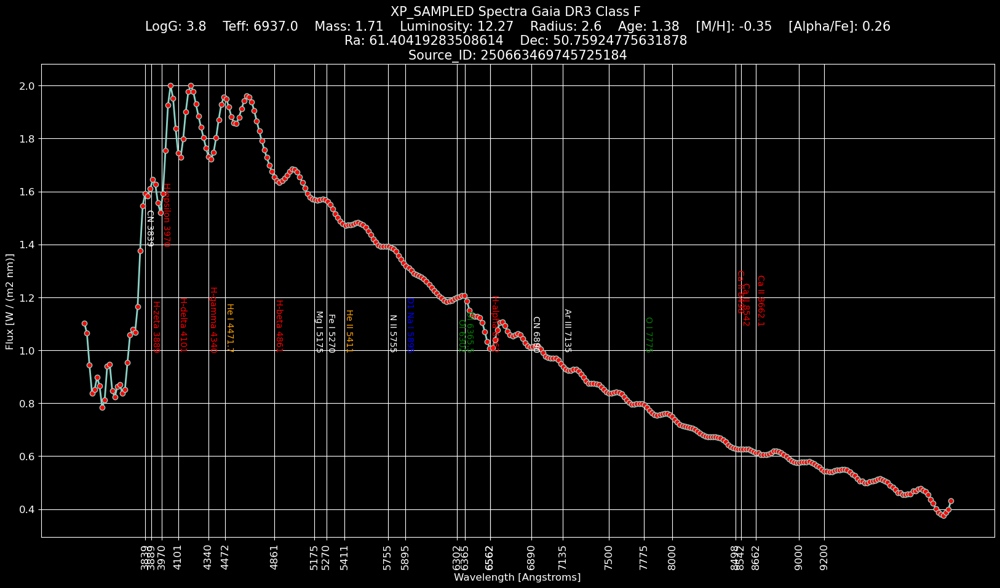

Pulled 1 of 1


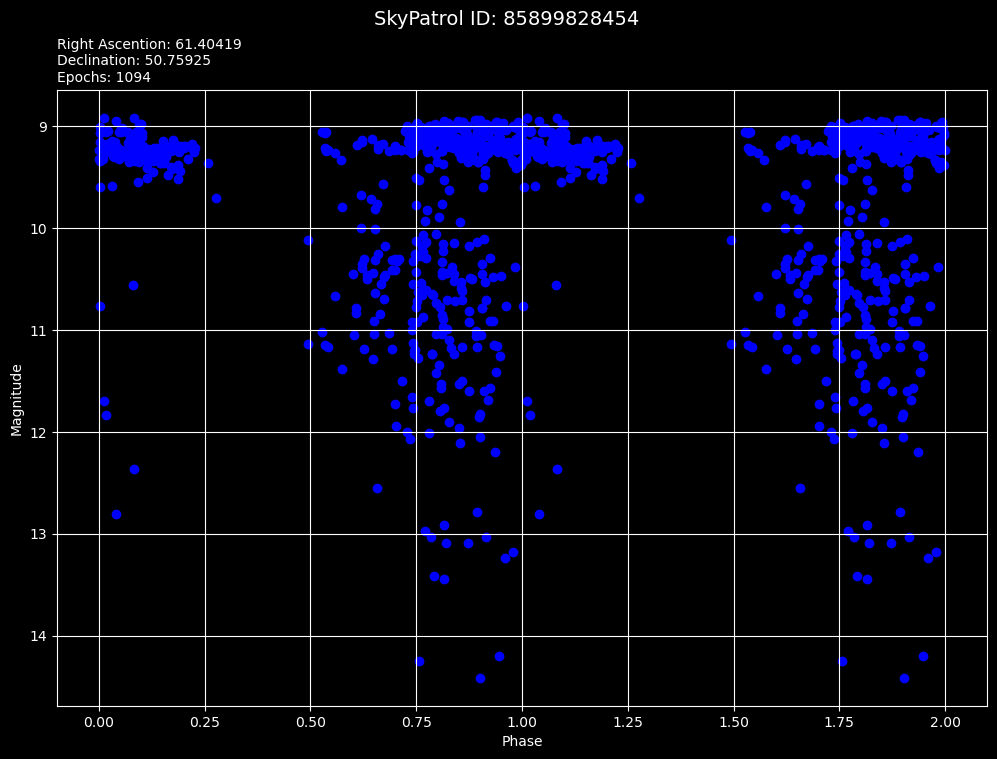

39. tic_id: 266666382
40. SearchResult containing 2 data products.

 #     mission     year   author  exptime target_name distance
                                     s                 arcsec 
--- -------------- ---- --------- ------- ----------- --------
  0 TESS Sector 19 2019 TESS-SPOC    1800   266666382      0.0
  1 TESS Sector 19 2019       QLP    1800   266666382      0.0


PlotTarget4B: target = tic 266666382




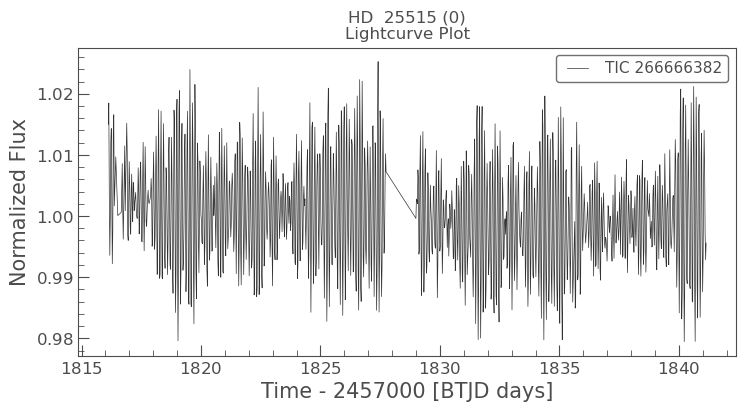

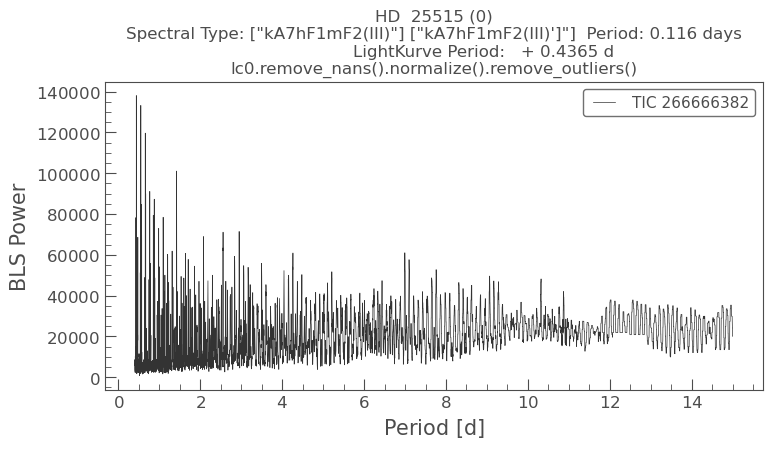

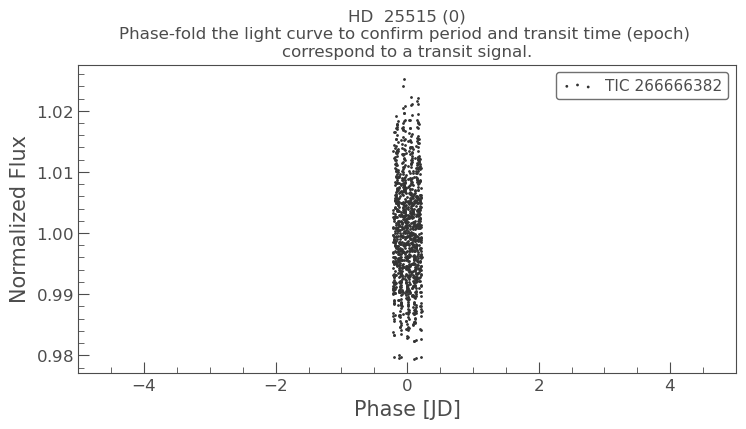

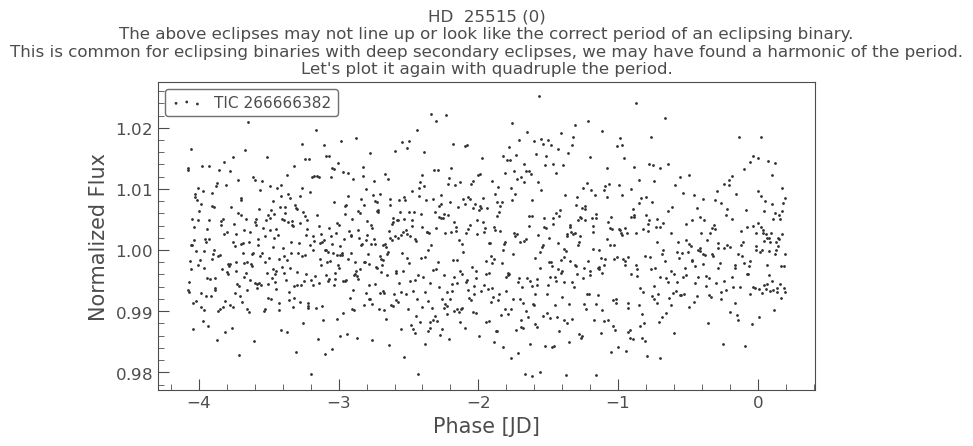

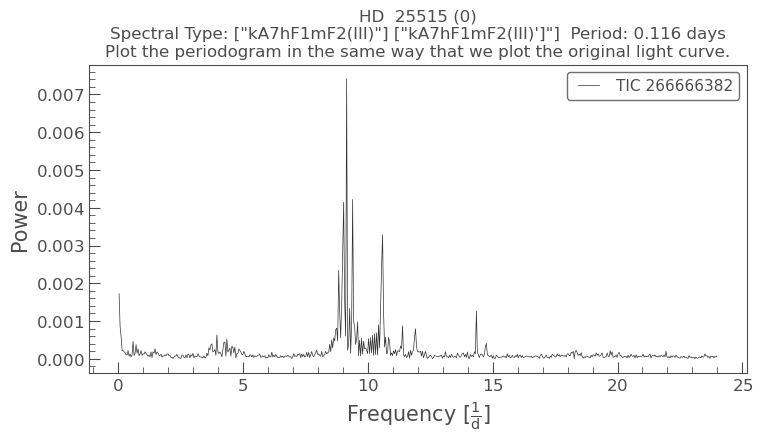

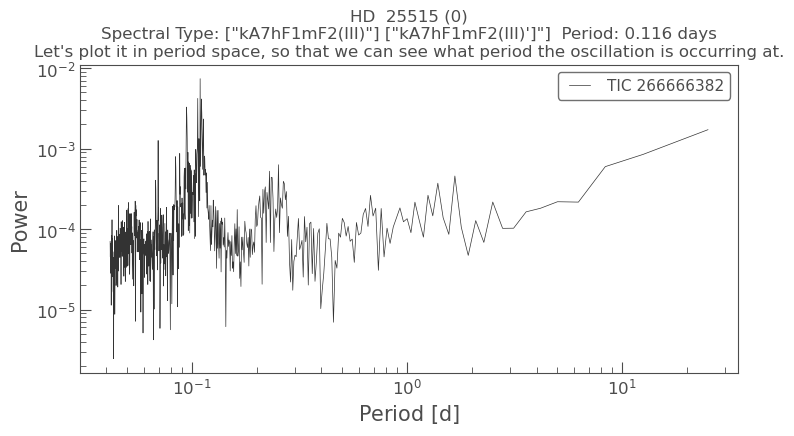

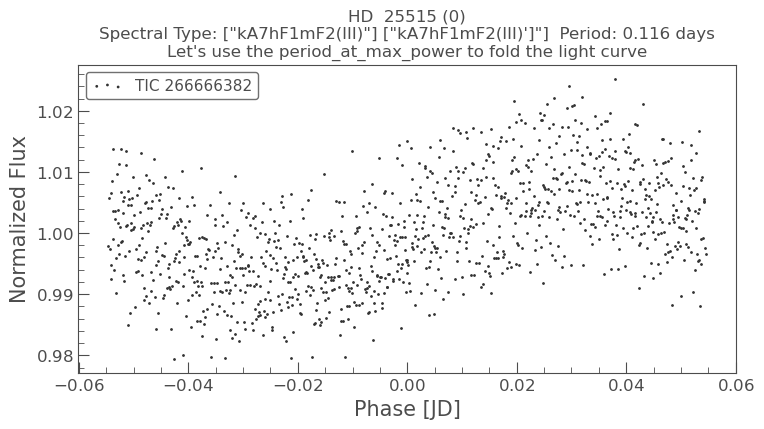

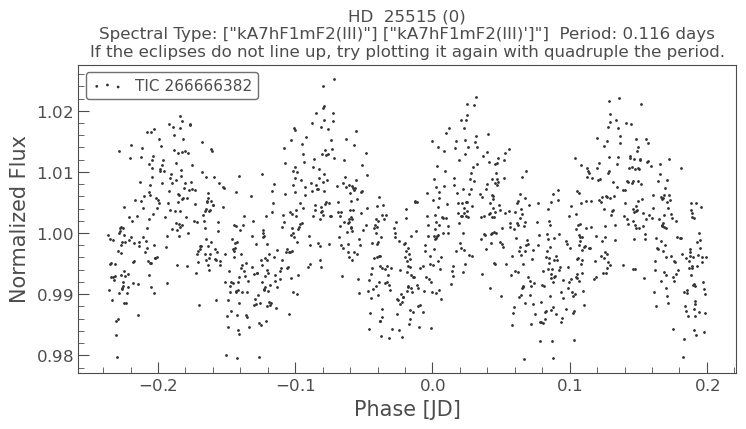

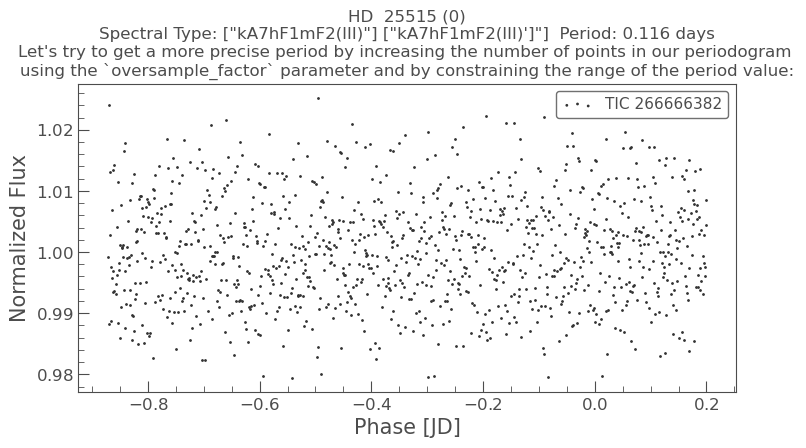


Done!
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]

5A. Ra: 30.167741807100604
5B. Dec: 58.52690454000691

5C. Source_Id: 505502605482123648


9. HD  12098
9. HD  12098B

10. Simbad star subclass: [""]

11. BP_RP star subclass: A9
12. BP_RP dereddened star subclass: A9
13. classlabel_espels: 
14. Star Type: main_sequence

14A. No df_asassn_v_filter_match!

14B. No df_asassn_blue_filter_match!

20. aavsovsx [Period]: 0.00528

21. aavsovsx [Variability type]: roAp

22. aavsovsx [ASASSN_Variable_Type]: roAp: Rapidly oscillating Ap variables. 
These are pulsating variables oscillating in high-overtone, low-degree, non-radial pressure modes. 
Pulsation periods are in the range of 0.003-0.015 days (4-21 min.), 
while amplitudes of light variation caused by the pulsation are about 0.01 mag. in V. 
The pulsational variations are superposed on those caused by rotation. 
GCVS type ACVO.

24. asassval[asas_sn_id]: 51540280536

25. [tic_id]: 

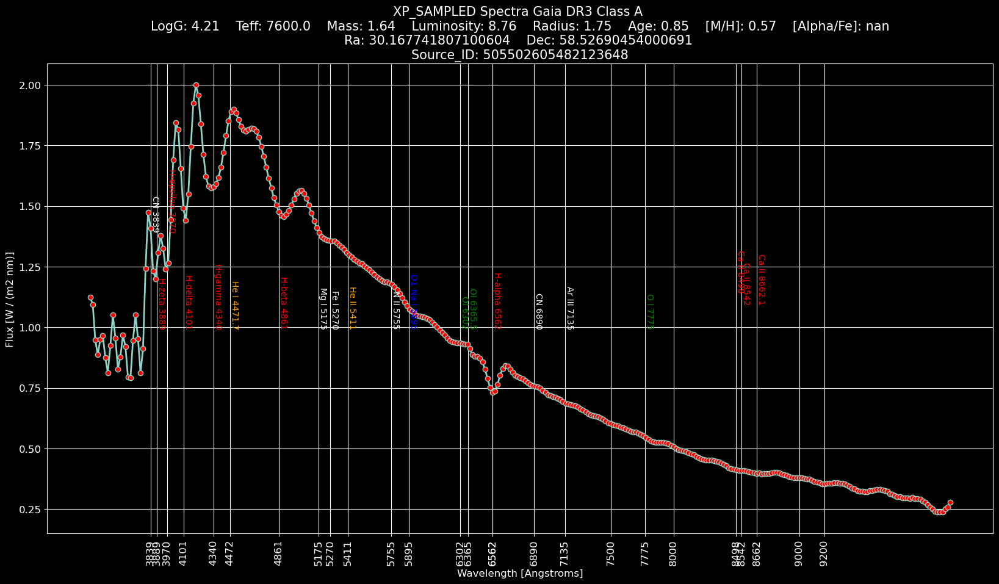

Pulled 1 of 1


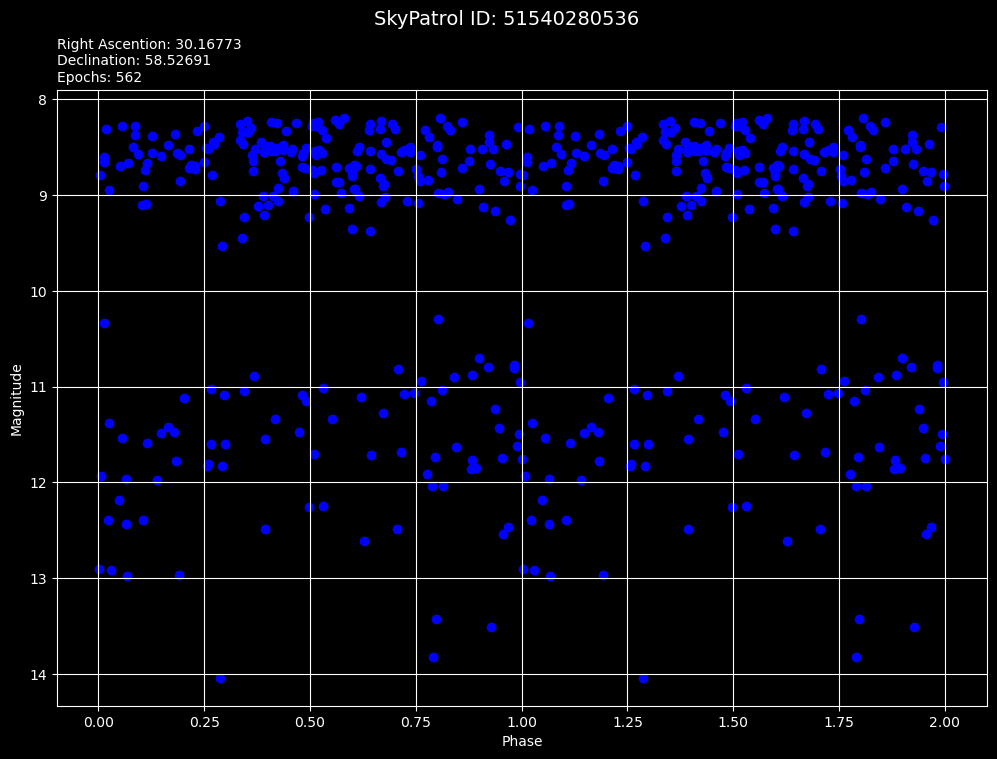

39. tic_id: 445543326
40. SearchResult containing 1 data products.

 #     mission     year author exptime target_name distance
                                  s                 arcsec 
--- -------------- ---- ------ ------- ----------- --------
  0 TESS Sector 58 2022   SPOC     120   445543326      0.0


PlotTarget4B: target = tic 445543326




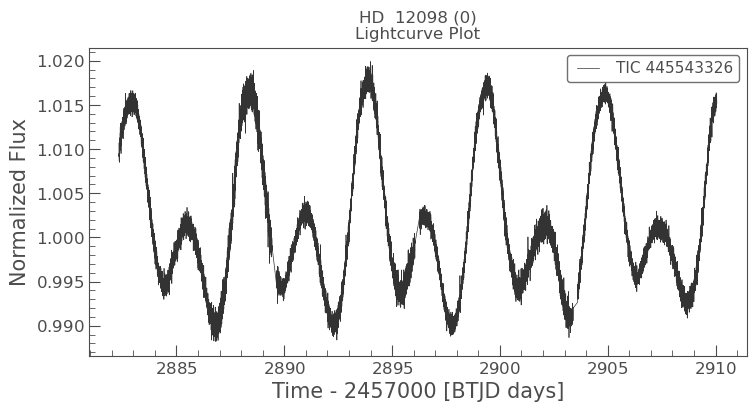

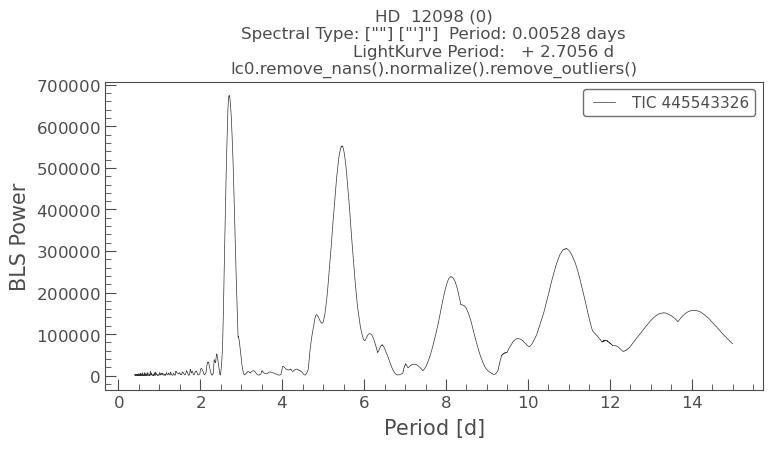

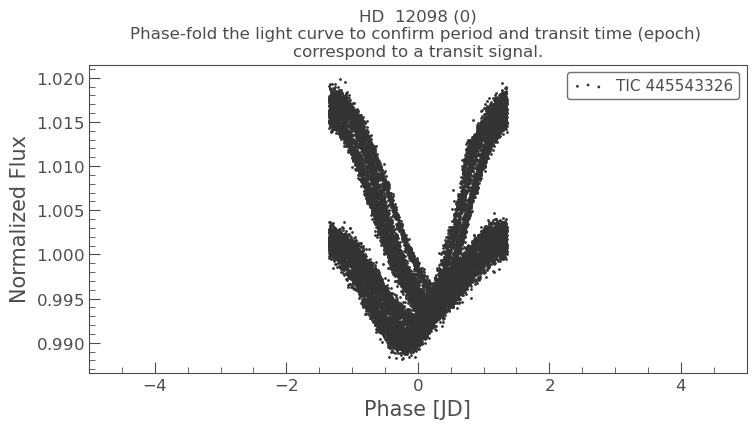

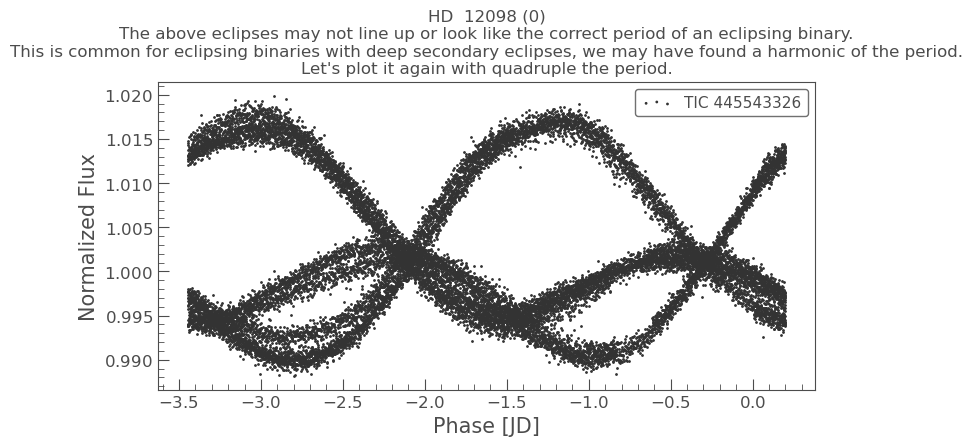

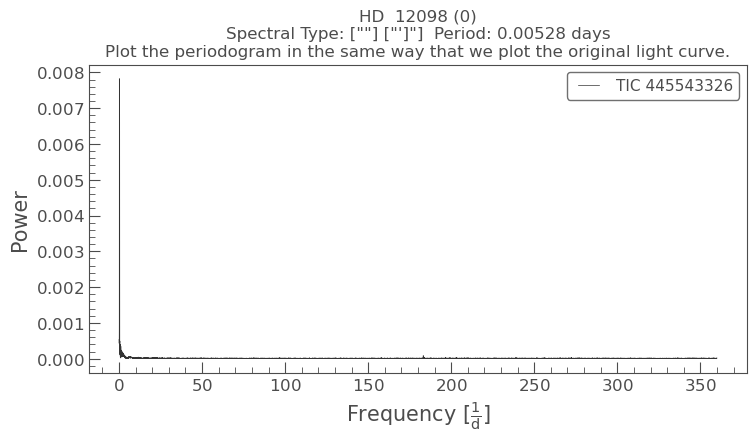

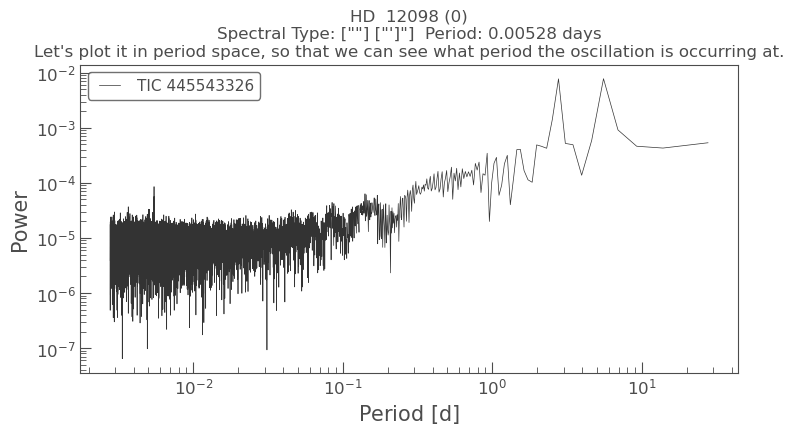

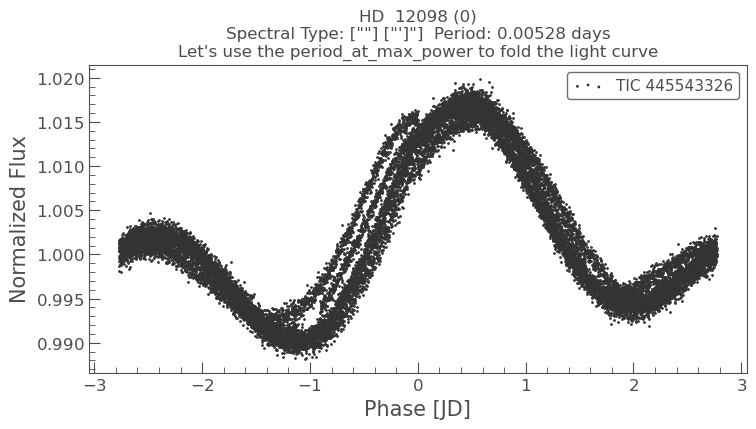

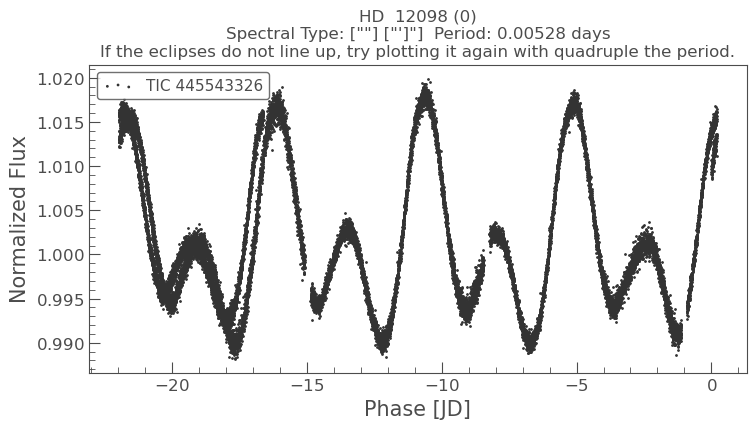

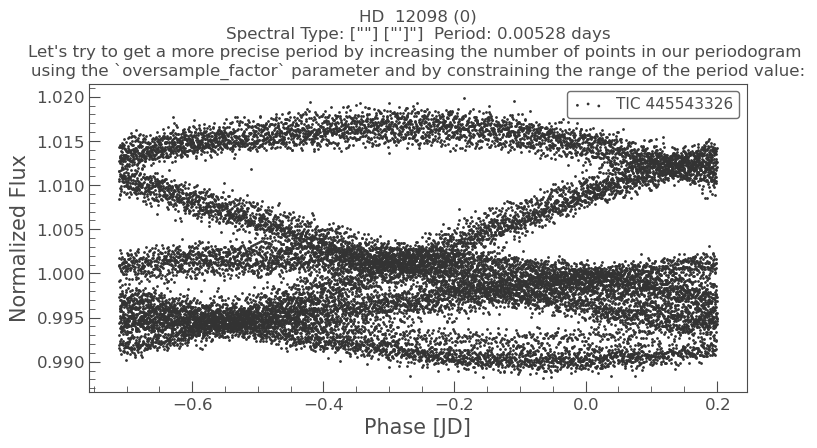


Done!
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]

5A. Ra: 133.84241529016205
5B. Dec: 32.710056848213824

5C. Source_Id: 712924065301624832


9. TYC 2488-1241-1
9. SDSS J085523.44+324213.0

10. Simbad star subclass: [""]

11. BP_RP star subclass: A6
12. BP_RP dereddened star subclass: A6
13. classlabel_espels: 
14. Star Type: main_sequence

14A. v_filter [asassn_name asassval3]: ASASSN-V J085522.36+324234.7
14A. v_filter [variable_type]: VAR


14A. v_filter [ASASSN_Variable_Type]: VAR: [Variable star of unspecified type]

14A. v_filter [Period]: 855.7834952
14A. v_filter [TIC_ID]: 302602874

14B. No df_asassn_blue_filter_match!

20. aavsovsx [Period]: 0.0050692

21. aavsovsx [Variability type]: roAp

22. aavsovsx [ASASSN_Variable_Type]: roAp: Rapidly oscillating Ap variables. 
These are pulsating variables oscillating in high-overtone, low-degree, non-radial pressure modes. 
Pulsation periods are in the range of 0.003-0.015 days

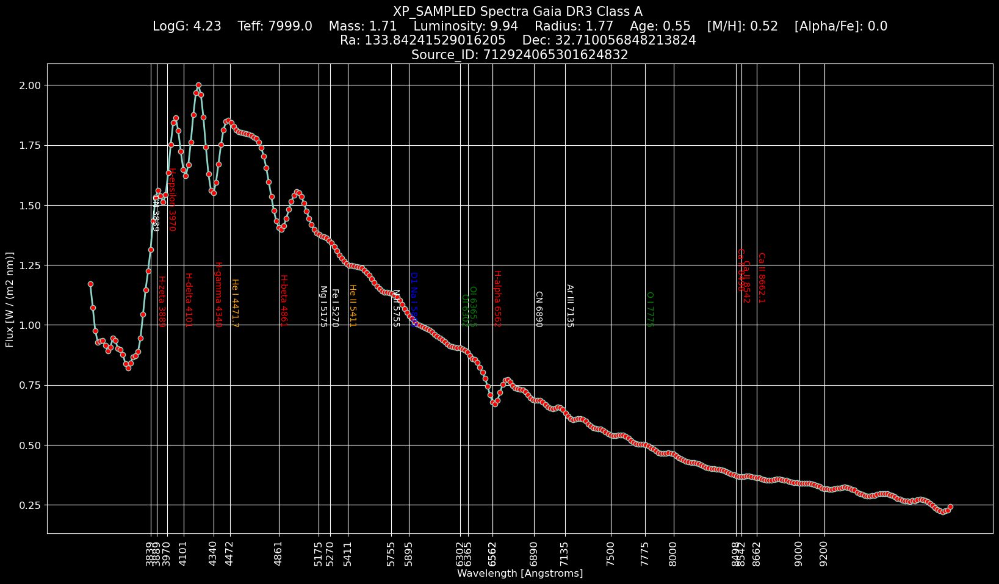

Pulled 1 of 1


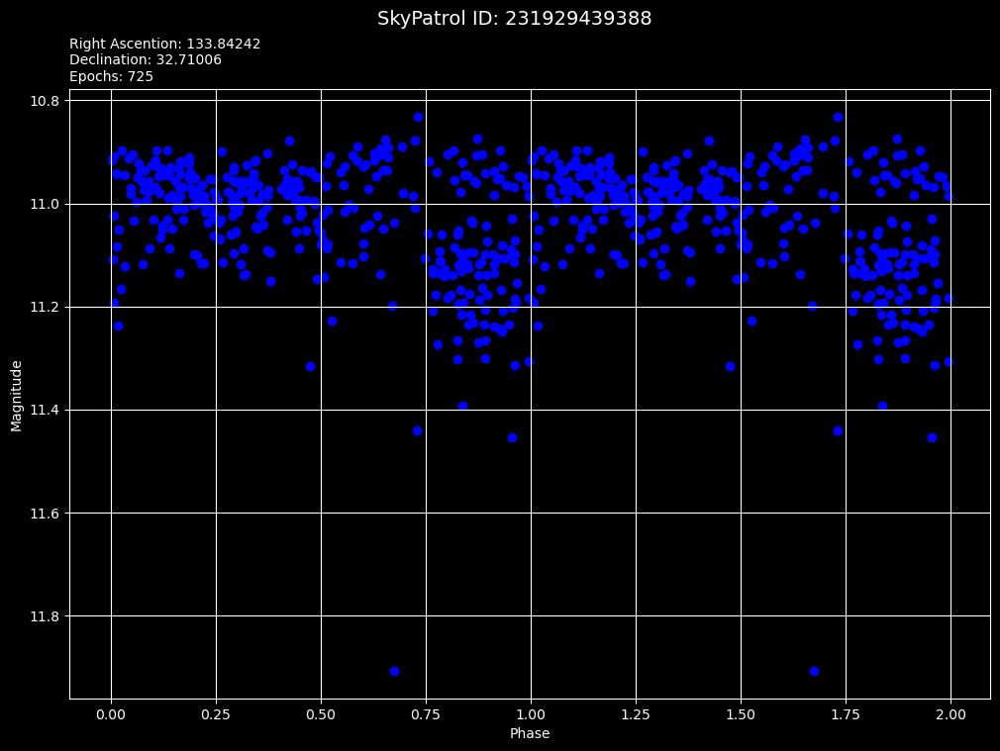

39. tic_id: 302602874
40. SearchResult containing 3 data products.

 #     mission     year   author  exptime target_name distance
                                     s                 arcsec 
--- -------------- ---- --------- ------- ----------- --------
  0 TESS Sector 21 2020      SPOC     120   302602874      0.0
  1 TESS Sector 21 2020 TESS-SPOC    1800   302602874      0.0
  2 TESS Sector 21 2020       QLP    1800   302602874      0.0


PlotTarget4B: target = tic 302602874




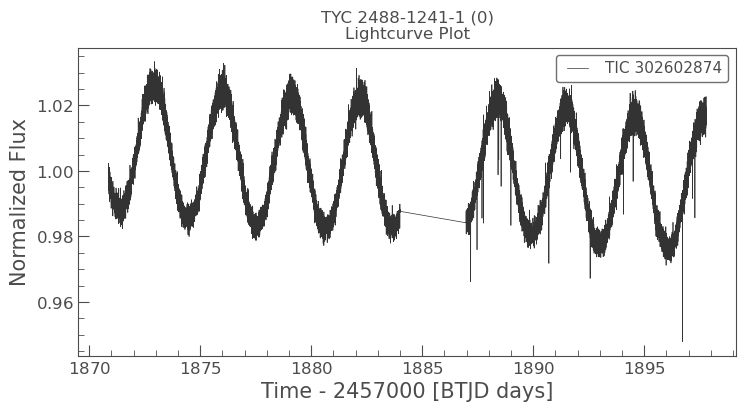

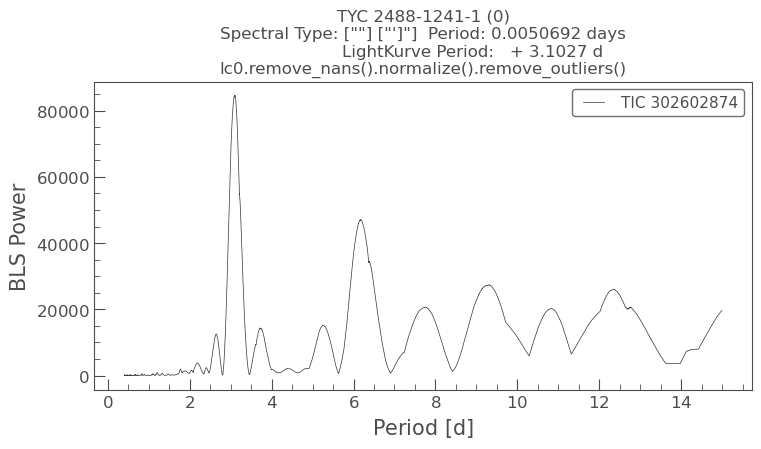

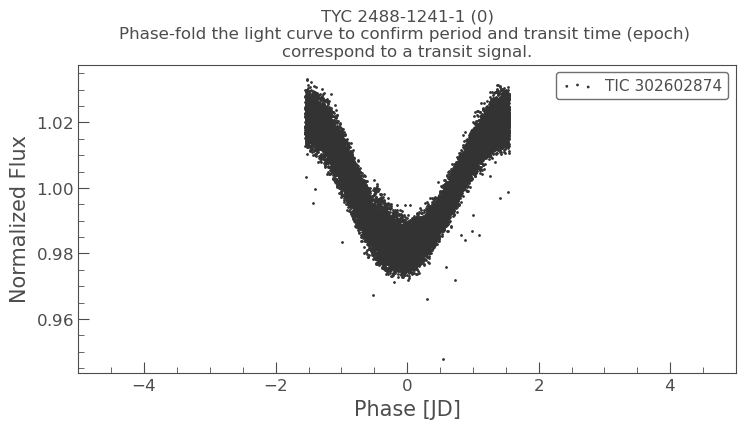

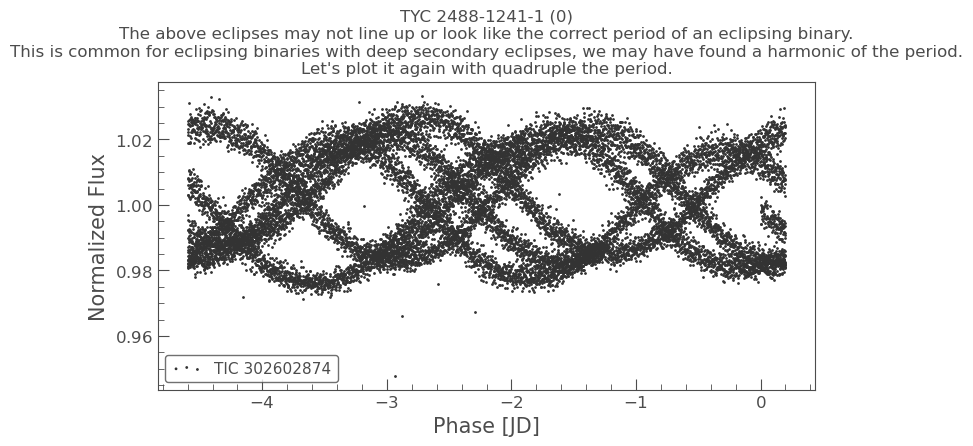

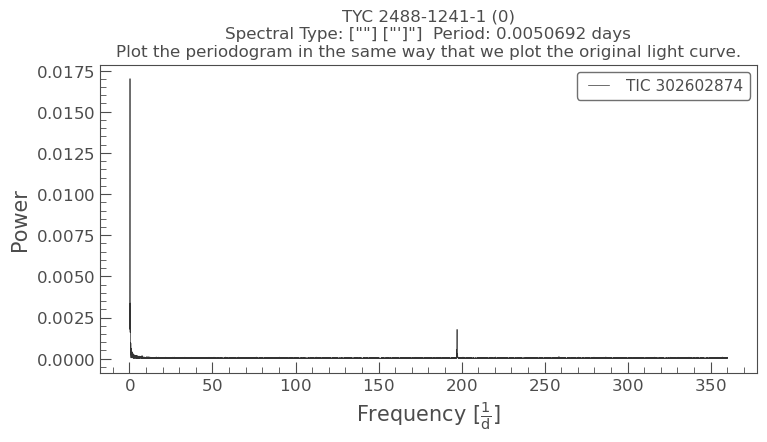

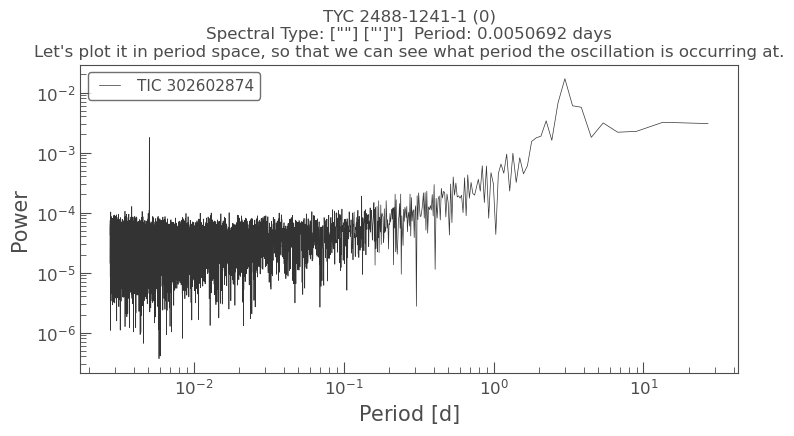

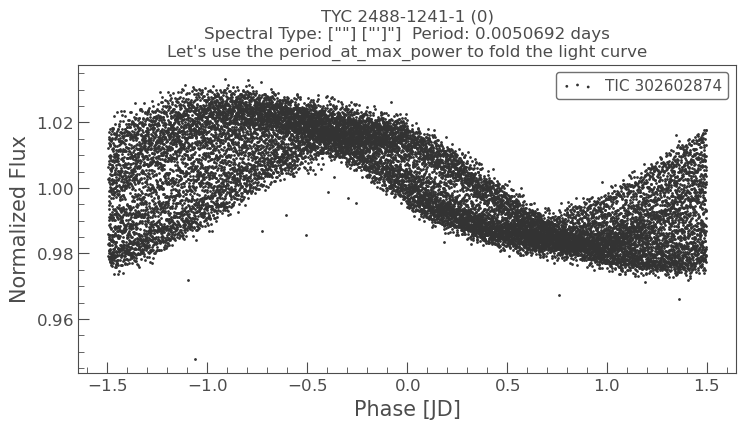

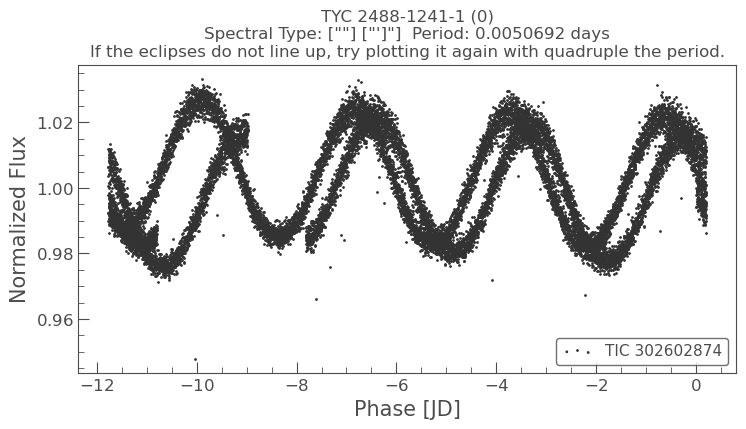

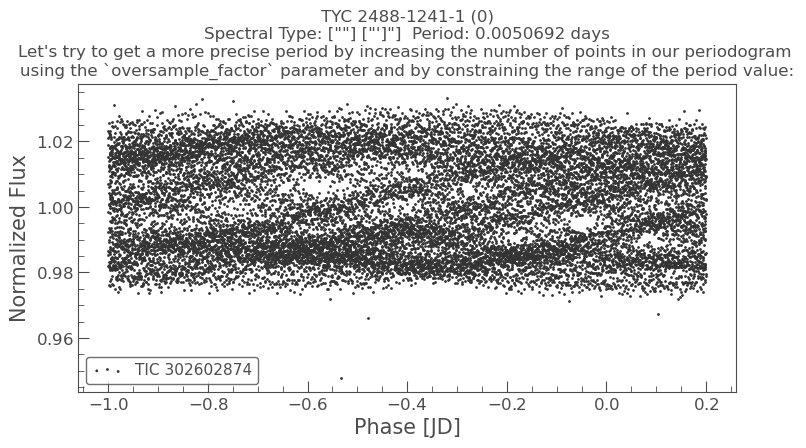


Done!
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]

5A. Ra: 167.41477789026104
5B. Dec: 67.21009123130466

5C. Source_Id: 1059387566556243584


9. V* EP UMa

10. Simbad star subclass: ["A7IVpSr"]

11. BP_RP star subclass: A7
12. BP_RP dereddened star subclass: B9.5
13. classlabel_espels: 
14. Star Type: turnoff

14A. v_filter [asassn_name asassval3]: ASASSN-V J110939.46+671237.2
14A. v_filter [variable_type]: ROT:


14A. v_filter [ASASSN_Variable_Type]: A colon ( : ) after the variability type -or any other field- means the value/classification is uncertain.
ROT: [Spotted Variables with rotational modulation. Light curves showing evidence of rotational modulation were classified as a generic rotational variable (ROT). 
 "https://asas-sn.osu.edu/atlas/ROT"]

14A. v_filter [Period]: 314.2123801
14A. v_filter [TIC_ID]: 147949646

14B. No df_asassn_blue_filter_match!

20. aavsovsx [Period]: 3.51556

21. aavsovsx [Variability type]: ro

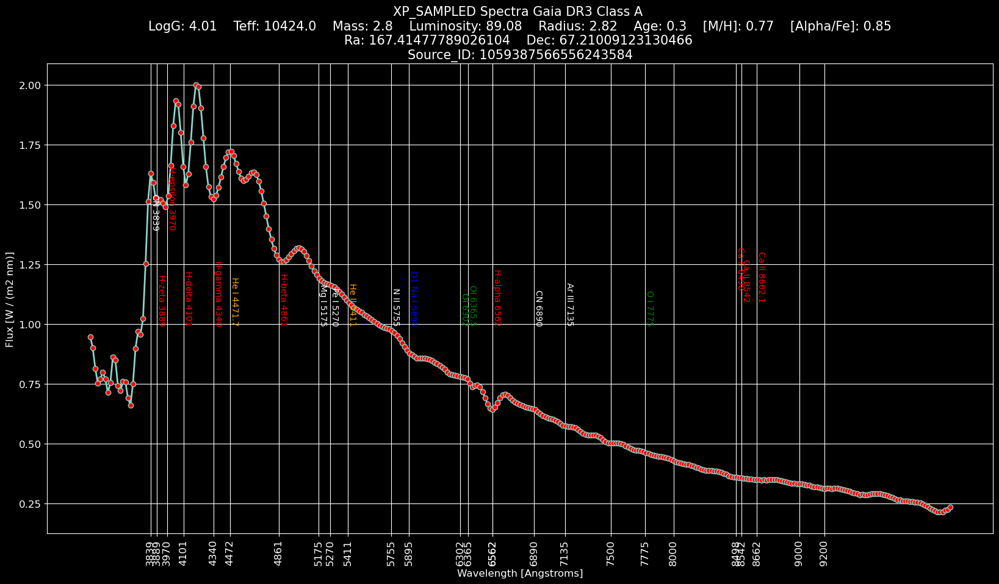

Pulled 1 of 1


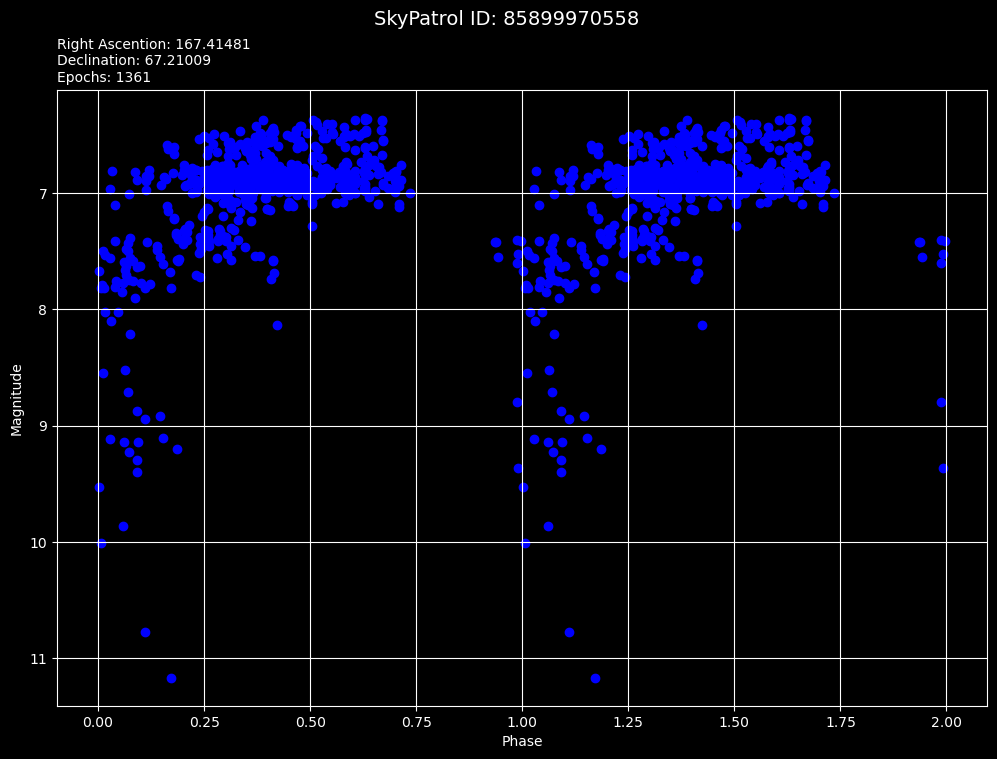

39. tic_id: 147949646
40. SearchResult containing 18 data products.

 #     mission     year   author  exptime target_name distance
                                     s                 arcsec 
--- -------------- ---- --------- ------- ----------- --------
  0 TESS Sector 14 2019      SPOC     120   147949646      0.0
  1 TESS Sector 14 2019 TESS-SPOC    1800   147949646      0.0
  2 TESS Sector 14 2019       QLP    1800   147949646      0.0
  3 TESS Sector 14 2019     TASOC     120   147949646      0.0
  4 TESS Sector 14 2019     TASOC    1800   147949646      0.0
  5 TESS Sector 14 2019     TASOC    1800   147949646      0.0
  6 TESS Sector 21 2020      SPOC     120   147949646      0.0
  7 TESS Sector 21 2020 TESS-SPOC    1800   147949646      0.0
  8 TESS Sector 21 2020       QLP    1800   147949646      0.0
  9 TESS Sector 41 2021      SPOC     120   147949646      0.0
 10 TESS Sector 41 2021 TESS-SPOC     600   147949646      0.0
 11 TESS Sector 41 2021       QLP     600   14794

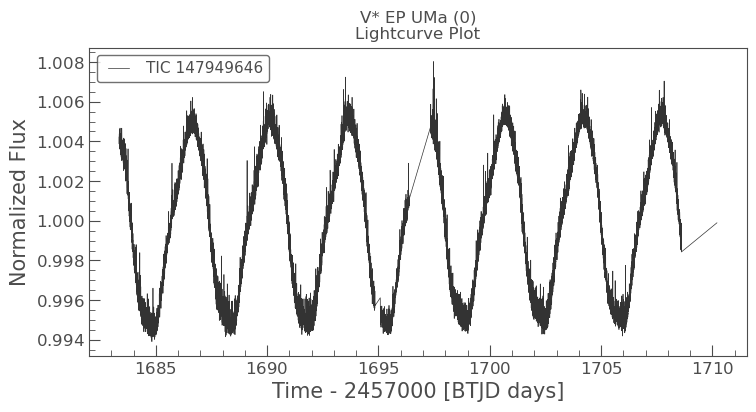

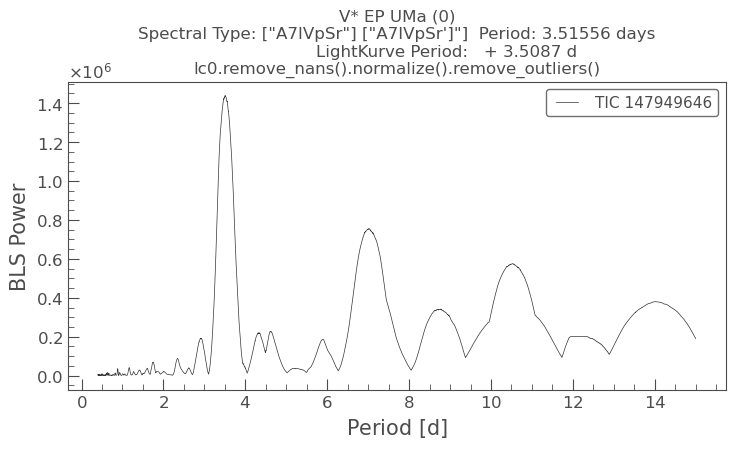

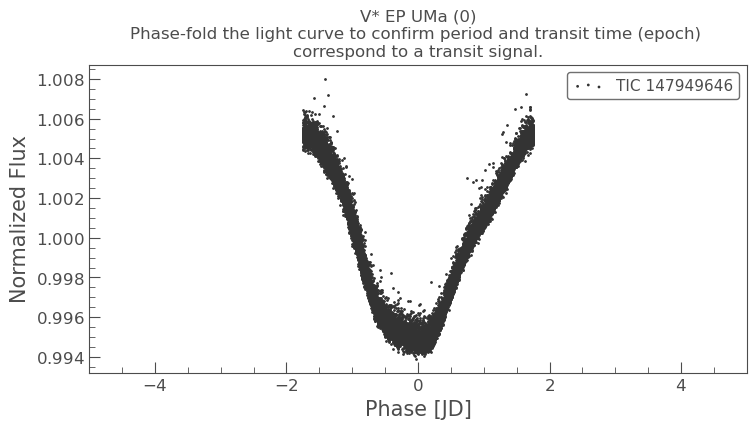

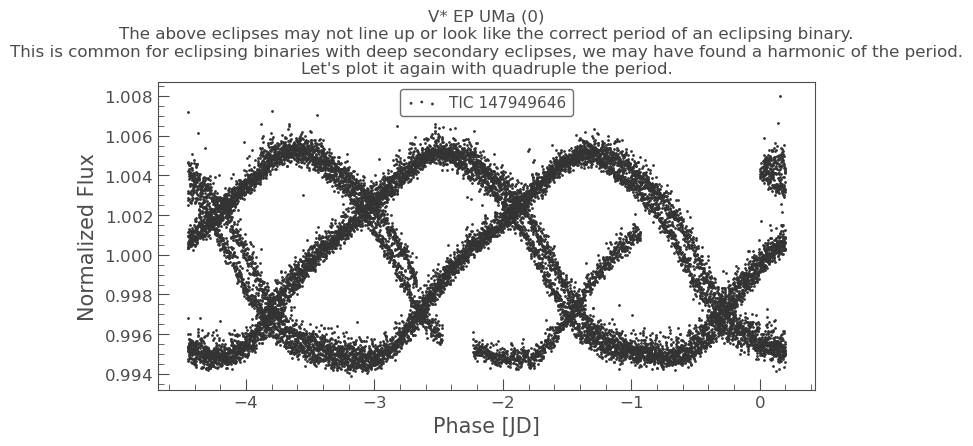

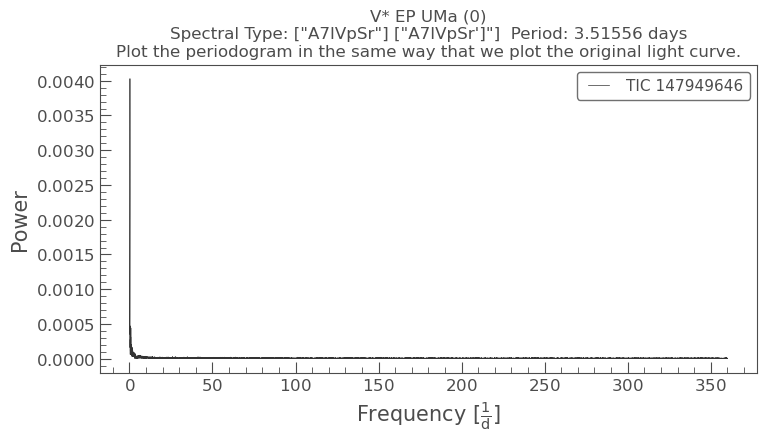

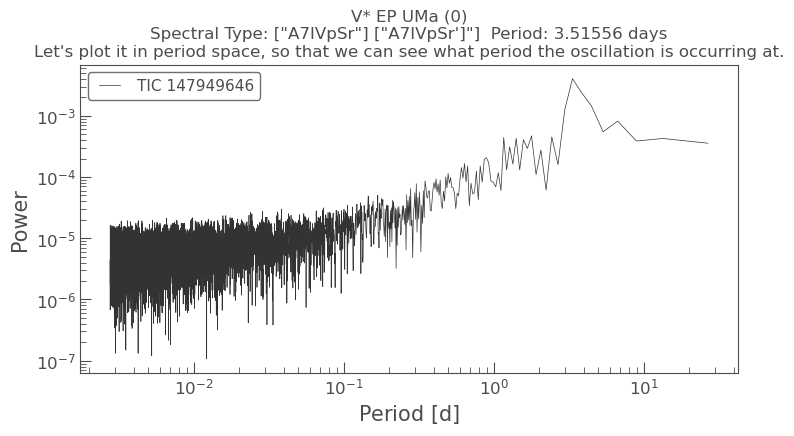

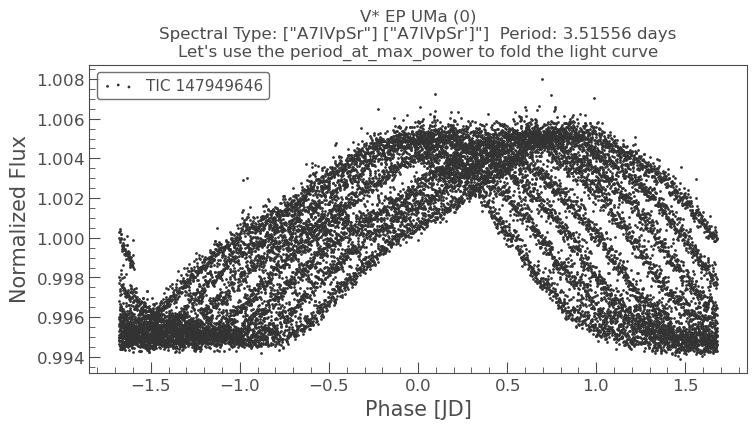

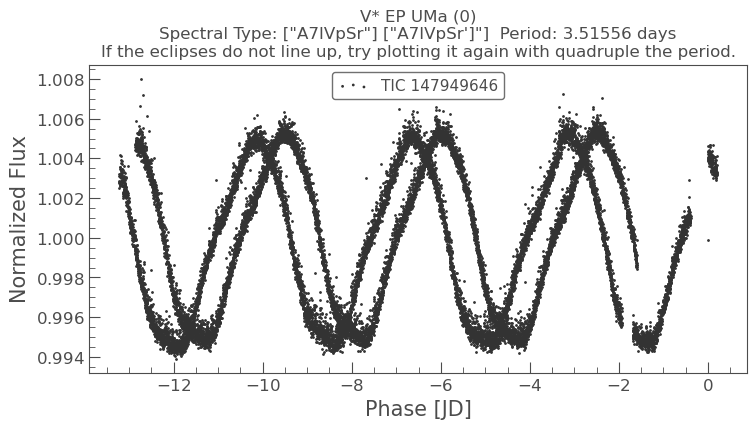

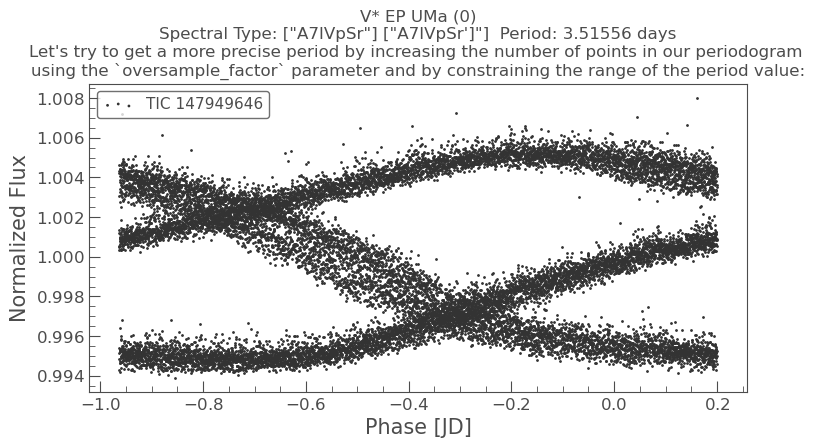


Done!
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]

5A. Ra: 217.70671499582585
5B. Dec: 31.798545063698285

5C. Source_Id: 1286927649634994432


9. TYC 2553-480-1
9. SDSS J143053.61+314852.2

10. Simbad star subclass: [""]

11. BP_RP star subclass: A9
12. BP_RP dereddened star subclass: Unknown
13. classlabel_espels: 
14. Star Type: unknown

14A. v_filter [asassn_name asassval3]: ASASSN-V J143049.52+314755.1
14A. v_filter [variable_type]: ROT:


14A. v_filter [ASASSN_Variable_Type]: A colon ( : ) after the variability type -or any other field- means the value/classification is uncertain.
ROT: [Spotted Variables with rotational modulation. Light curves showing evidence of rotational modulation were classified as a generic rotational variable (ROT). 
 "https://asas-sn.osu.edu/atlas/ROT"]

14A. v_filter [Period]: nan
14A. v_filter [TIC_ID]: 286992225

14B. No df_asassn_blue_filter_match!

20. aavsovsx [Period]: 0.0042456

21. aavsovs

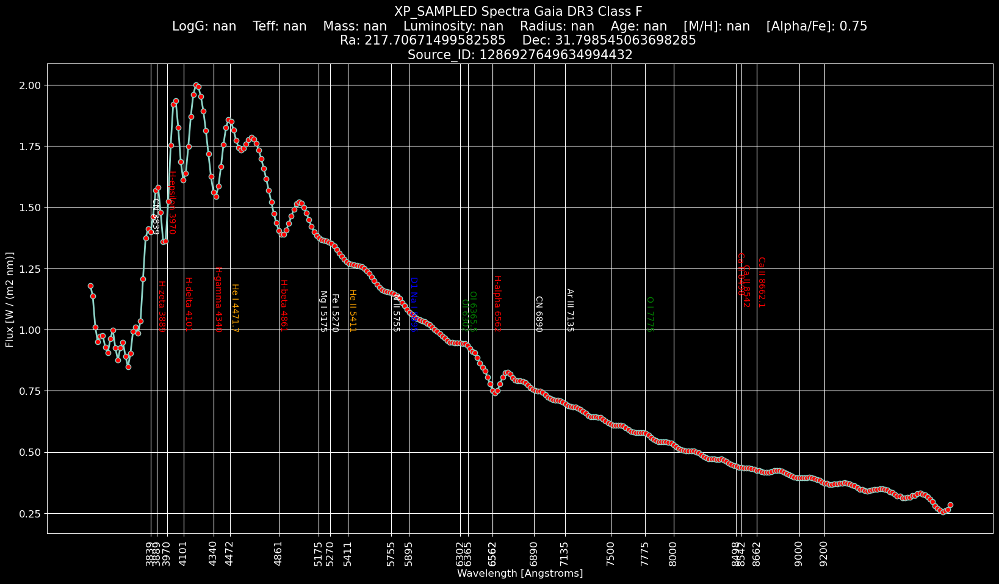

Pulled 1 of 1


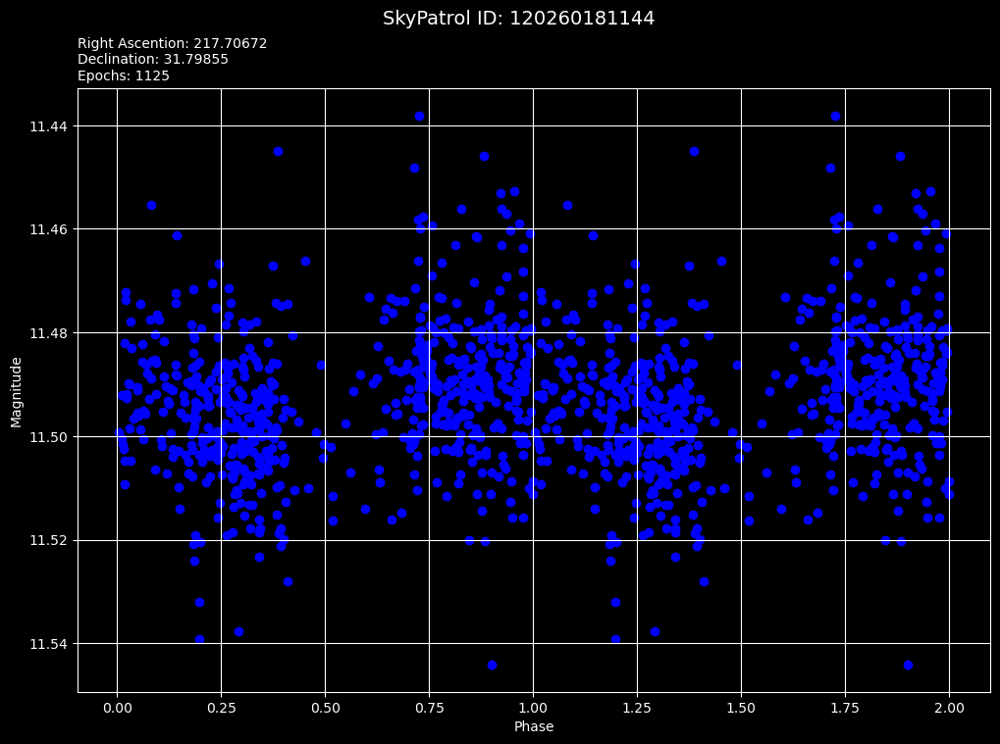

39. tic_id: 286992225
40. SearchResult containing 7 data products.

 #     mission     year   author  exptime target_name distance
                                     s                 arcsec 
--- -------------- ---- --------- ------- ----------- --------
  0 TESS Sector 23 2020      SPOC     120   286992225      0.0
  1 TESS Sector 23 2020 TESS-SPOC    1800   286992225      0.0
  2 TESS Sector 23 2020       QLP    1800   286992225      0.0
  3 TESS Sector 50 2022      SPOC      20   286992225      0.0
  4 TESS Sector 50 2022      SPOC     120   286992225      0.0
  5 TESS Sector 50 2022 TESS-SPOC     600   286992225      0.0
  6 TESS Sector 50 2022       QLP     600   286992225      0.0


PlotTarget4B: target = tic 286992225




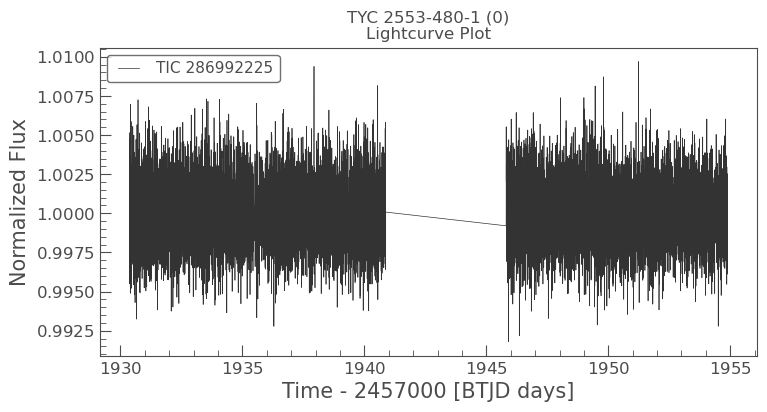

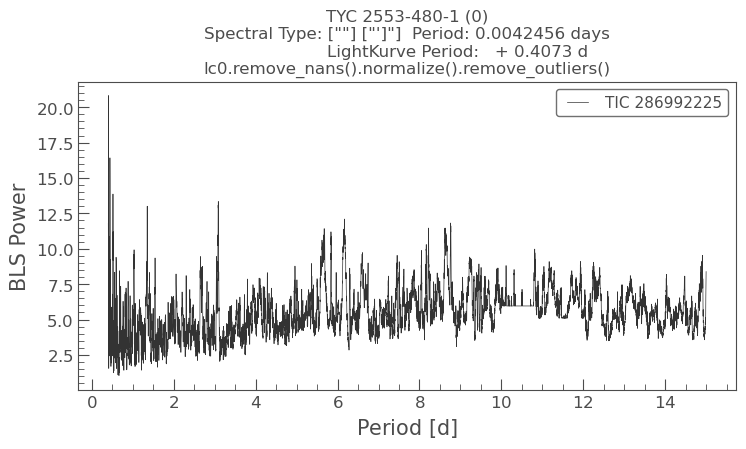

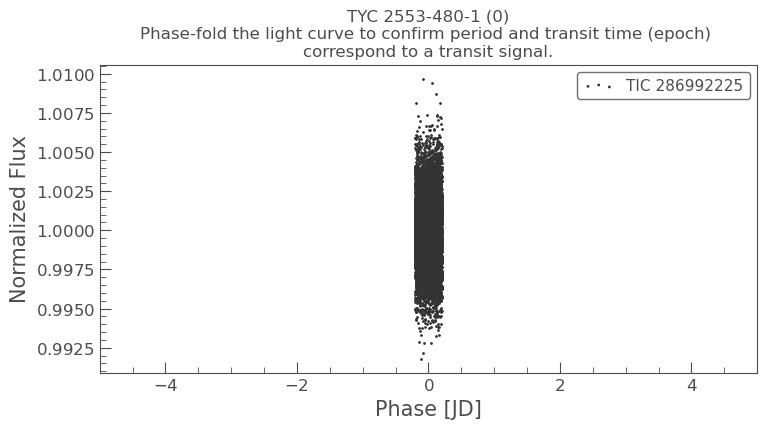

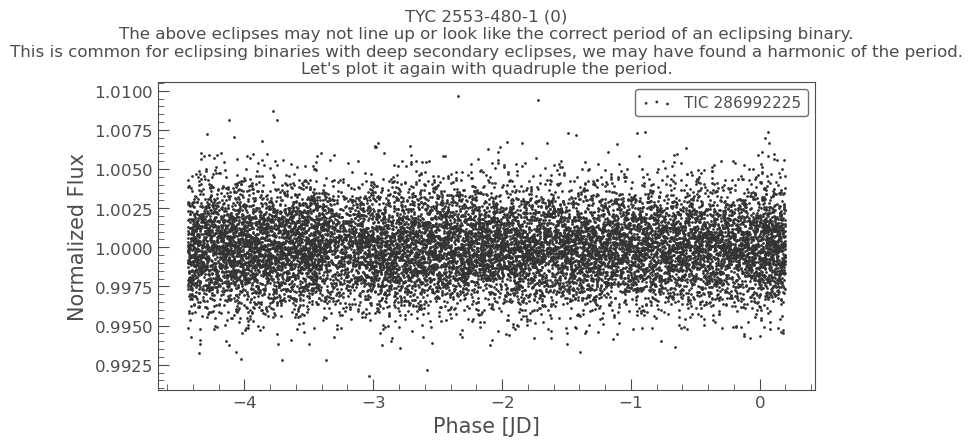

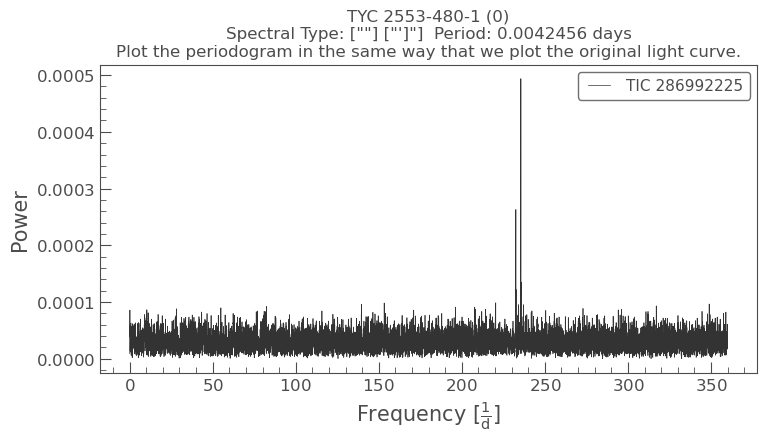

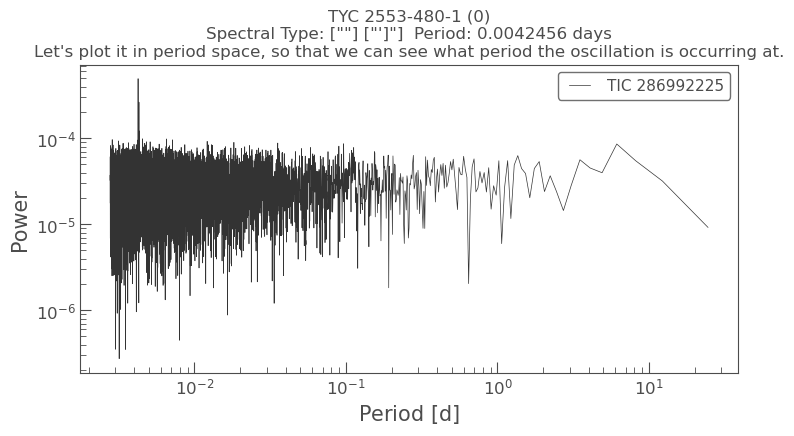

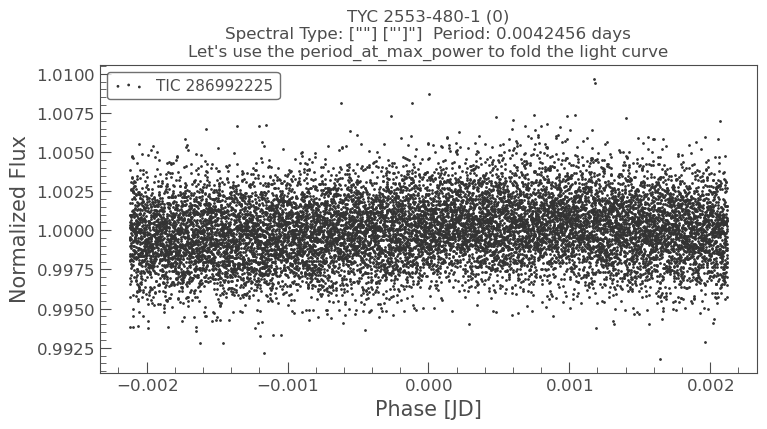

LightKurve error: wrap_phase should be between 0 and the period
i: 0
TIC: 286992225
plot_count: 1
target_period: 0.0042456
target1: TYC 2553-480-1

Done!
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]

5A. Ra: 281.0511599556734
5B. Dec: 43.29775323941646

5C. Source_Id: 2116863318617538944


9. TYC 3130-2480-1
9. UCAC4 667-068500

10. Simbad star subclass: ["A2III"]

11. BP_RP star subclass: A6
12. BP_RP dereddened star subclass: A3
13. classlabel_espels: 
14. Star Type: main_sequence

14A. v_filter [asassn_name asassval3]: ASASSN-V J184412.25+431750.8
14A. v_filter [variable_type]: ROT:


14A. v_filter [ASASSN_Variable_Type]: A colon ( : ) after the variability type -or any other field- means the value/classification is uncertain.
ROT: [Spotted Variables with rotational modulation. Light curves showing evidence of rotational modulation were classified as a generic rotational variable (ROT). 
 "https://asas-sn.osu.edu/atlas/ROT"]

14

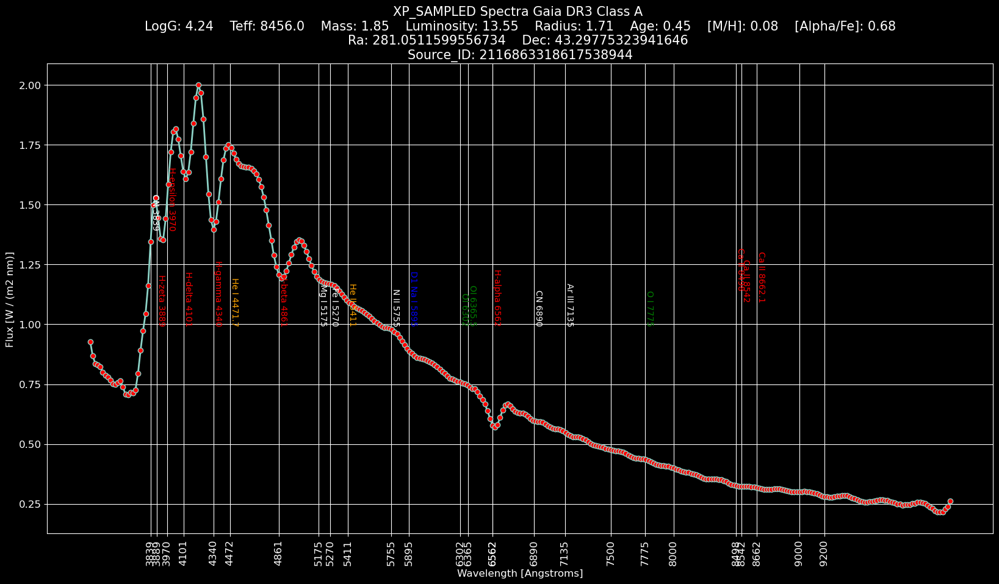

Pulled 1 of 1


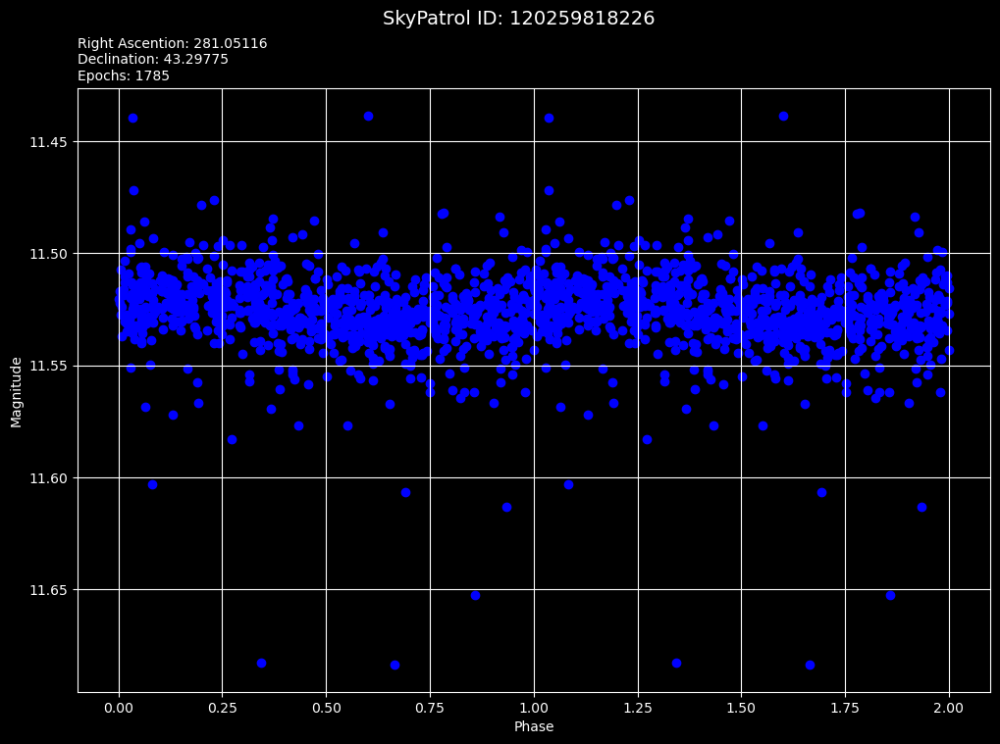

39. tic_id: 123231021
40. SearchResult containing 24 data products.

 #     mission     year   author  exptime target_name distance
                                     s                 arcsec 
--- -------------- ---- --------- ------- ----------- --------
  0 TESS Sector 14 2019      SPOC     120   123231021      0.0
  1 TESS Sector 14 2019 TESS-SPOC    1800   123231021      0.0
  2 TESS Sector 14 2019       QLP    1800   123231021      0.0
  3 TESS Sector 14 2019     TASOC     120   123231021      0.0
  4 TESS Sector 14 2019     TASOC    1800   123231021      0.0
  5 TESS Sector 14 2019     TASOC    1800   123231021      0.0
  6 TESS Sector 26 2020      SPOC     120   123231021      0.0
  7 TESS Sector 26 2020 TESS-SPOC    1800   123231021      0.0
  8 TESS Sector 26 2020       QLP    1800   123231021      0.0
  9 TESS Sector 26 2020     TASOC     120   123231021      0.0
...            ...  ...       ...     ...         ...      ...
 14 TESS Sector 40 2021 TESS-SPOC     600   12323

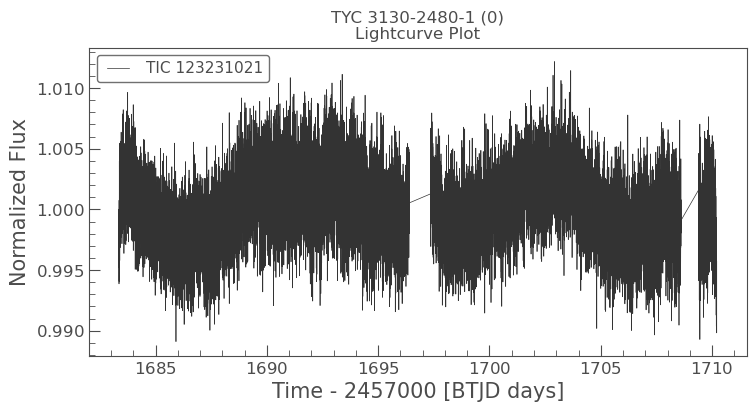

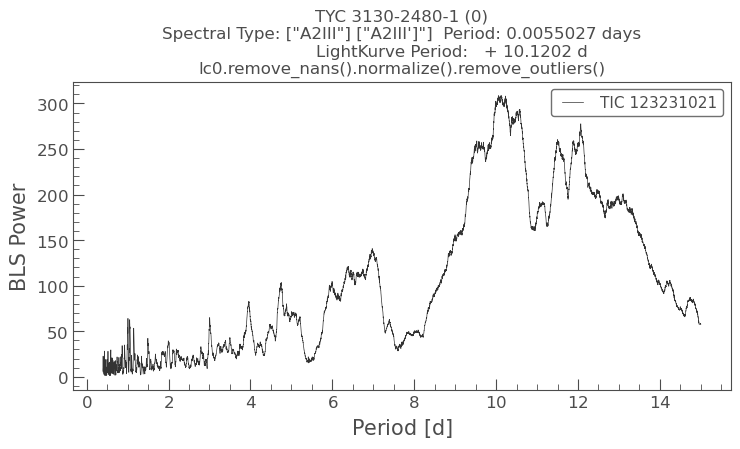

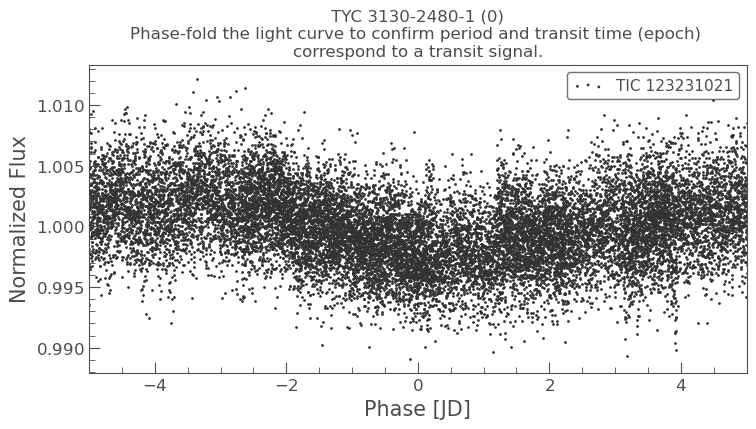

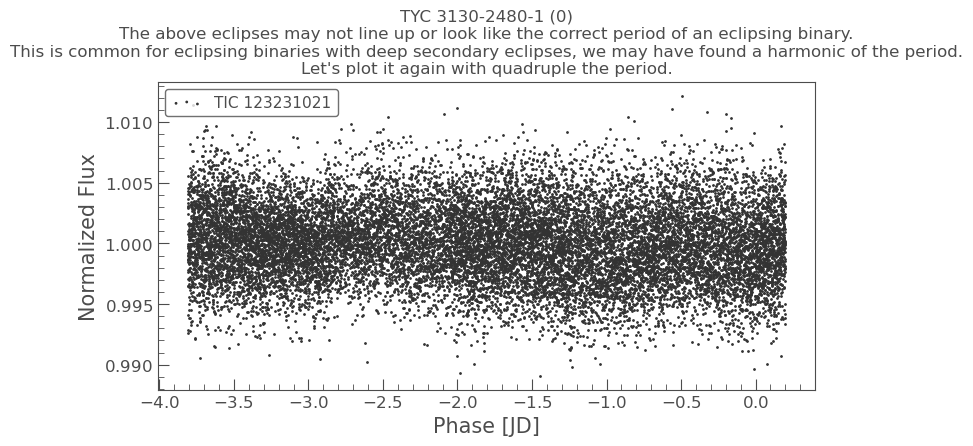

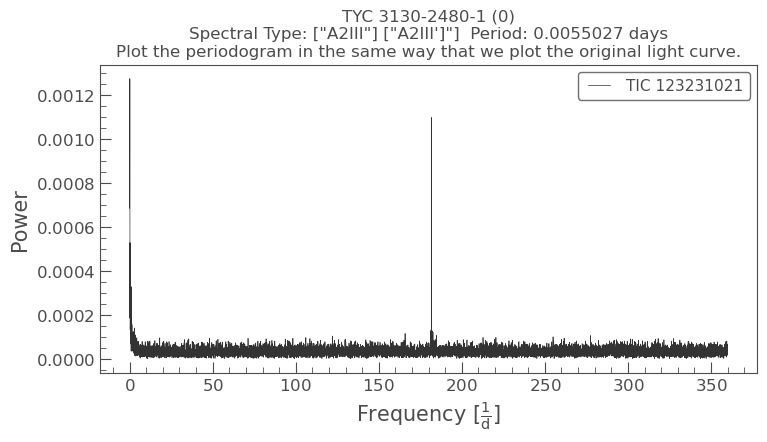

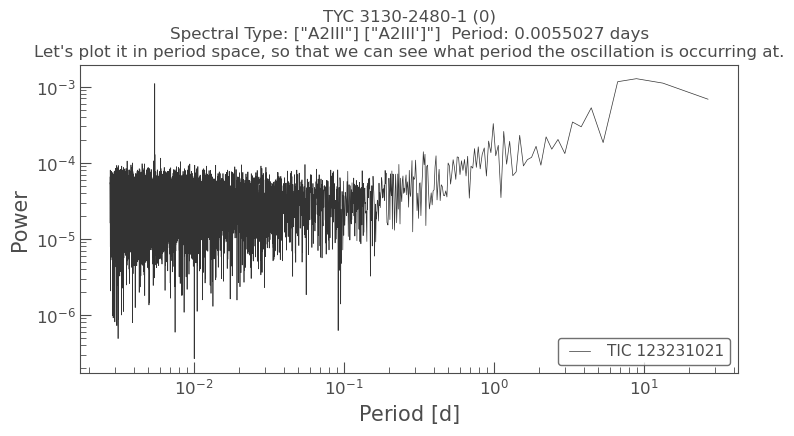

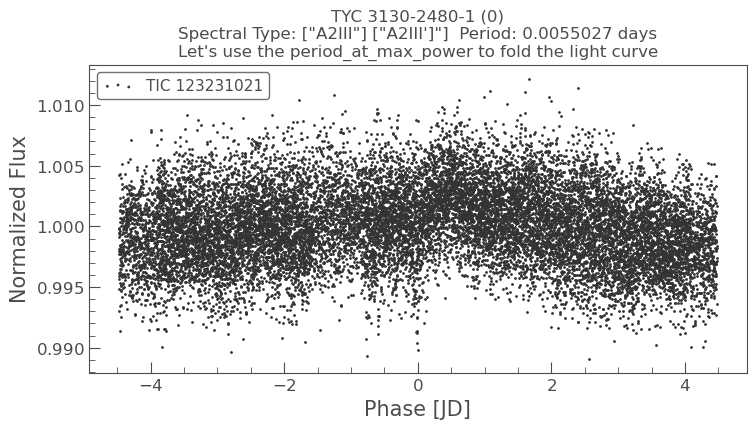

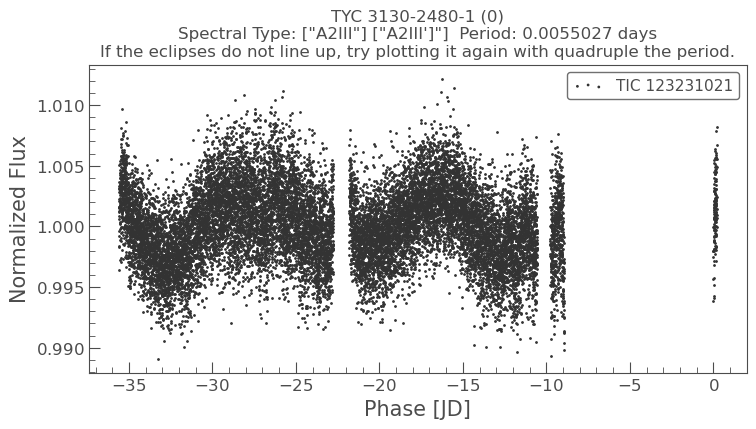

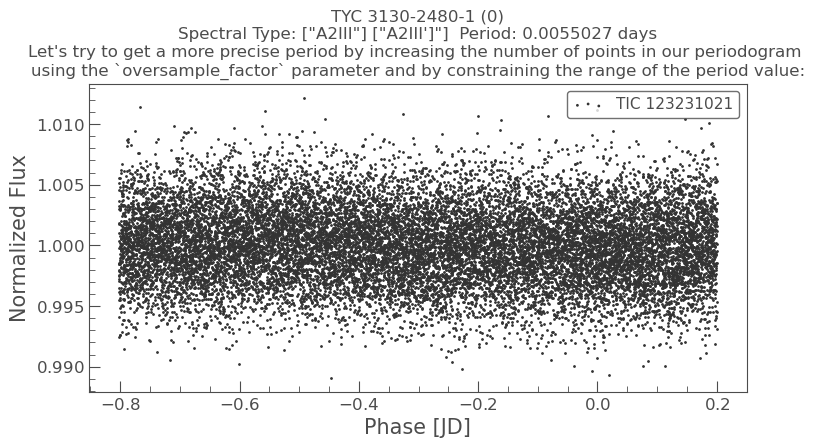


Done!
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]

5A. Ra: 338.30137588350055
5B. Dec: -20.039357390302506

5C. Source_Id: 2401638960512043264


9. V* MM Aqr

10. Simbad star subclass: ["A(pEuSrCr)"]

11. BP_RP star subclass: F5
12. BP_RP dereddened star subclass: F5
13. classlabel_espels: 
14. Star Type: turnoff

14A. v_filter [asassn_name asassval3]: ASASSN-V J223312.14-200221.5
14A. v_filter [variable_type]: VAR


14A. v_filter [ASASSN_Variable_Type]: VAR: [Variable star of unspecified type]

14A. v_filter [Period]: 317.2341265
14A. v_filter [TIC_ID]: 69855370

14B. No df_asassn_blue_filter_match!

20. aavsovsx [Period]: 0.008

21. aavsovsx [Variability type]: roAp

22. aavsovsx [ASASSN_Variable_Type]: roAp: Rapidly oscillating Ap variables. 
These are pulsating variables oscillating in high-overtone, low-degree, non-radial pressure modes. 
Pulsation periods are in the range of 0.003-0.015 days (4-21 min.), 
while amplitudes o

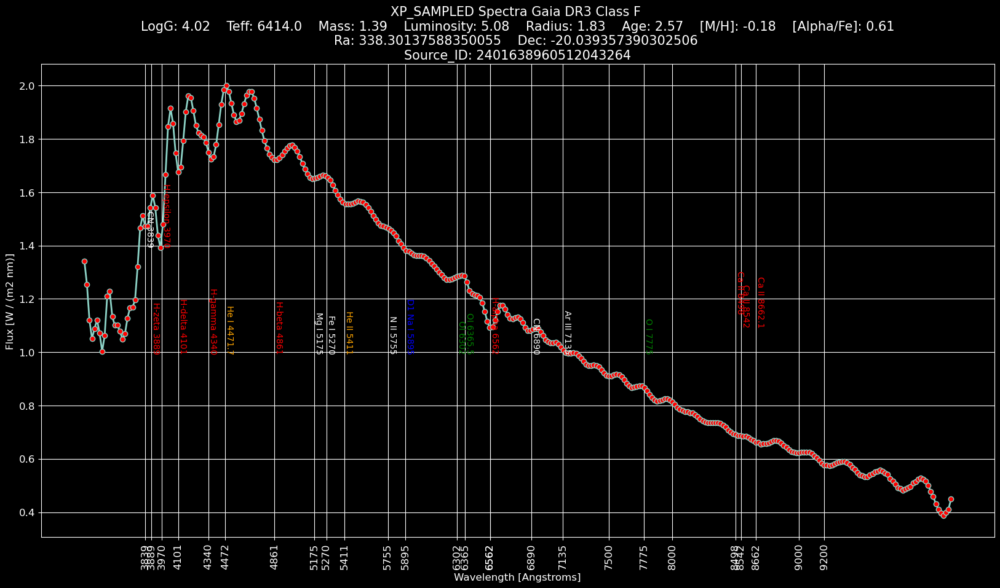

Pulled 1 of 1


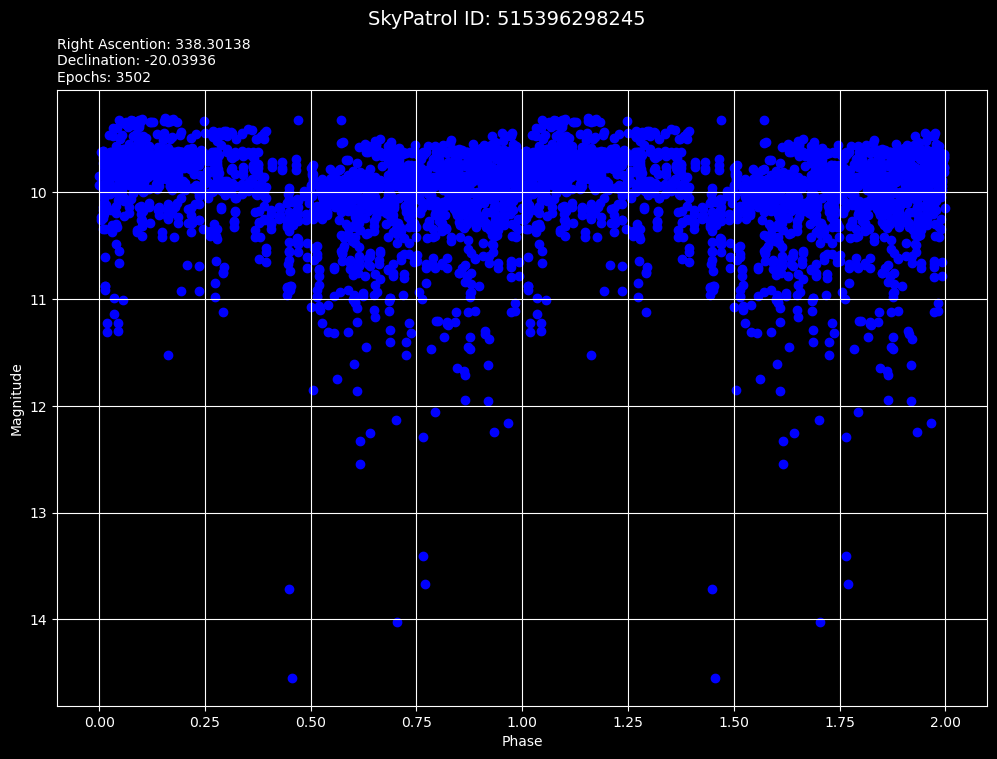

39. tic_id: 69855370
40. SearchResult containing 17 data products.

 #     mission     year       author      exptime target_name distance
                                             s                 arcsec 
--- -------------- ---- ----------------- ------- ----------- --------
  0 TESS Sector 02 2018              SPOC     120    69855370      0.0
  1 TESS Sector 02 2018         TESS-SPOC    1800    69855370      0.0
  2 TESS Sector 02 2018               QLP    1800    69855370      0.0
  3 TESS Sector 02 2018             TASOC     120    69855370      0.0
  4 TESS Sector 02 2018              TGLC    1800    69855370      0.0
  5 TESS Sector 02 2018             TASOC    1800    69855370      0.0
  6 TESS Sector 02 2018             CDIPS    1800    69855370      0.0
  7 TESS Sector 02 2018 GSFC-ELEANOR-LITE    1800    69855370      0.0
  8 TESS Sector 02 2018             TASOC    1800    69855370      0.0
  9 TESS Sector 28 2020              SPOC      20    69855370      0.0
 10 TESS 

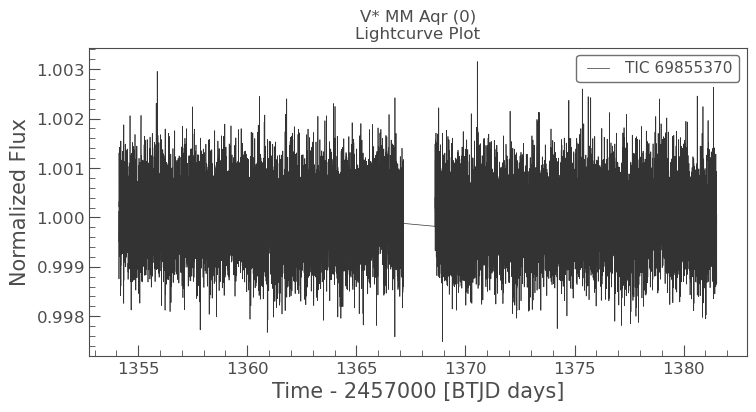

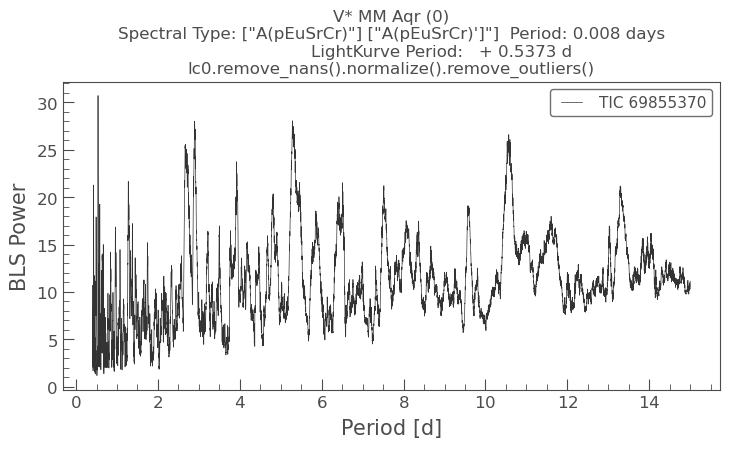

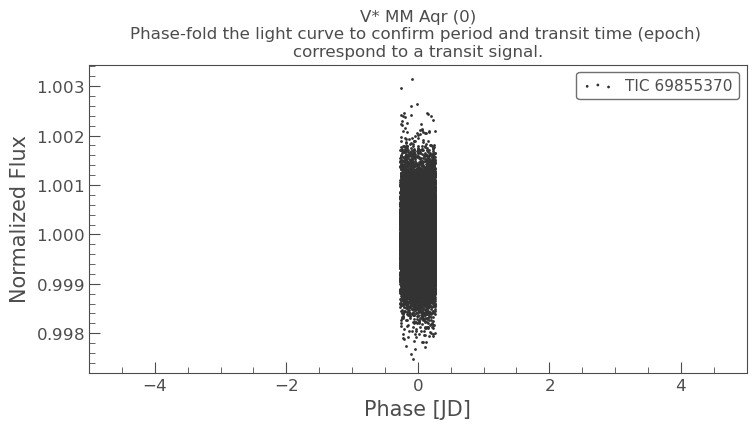

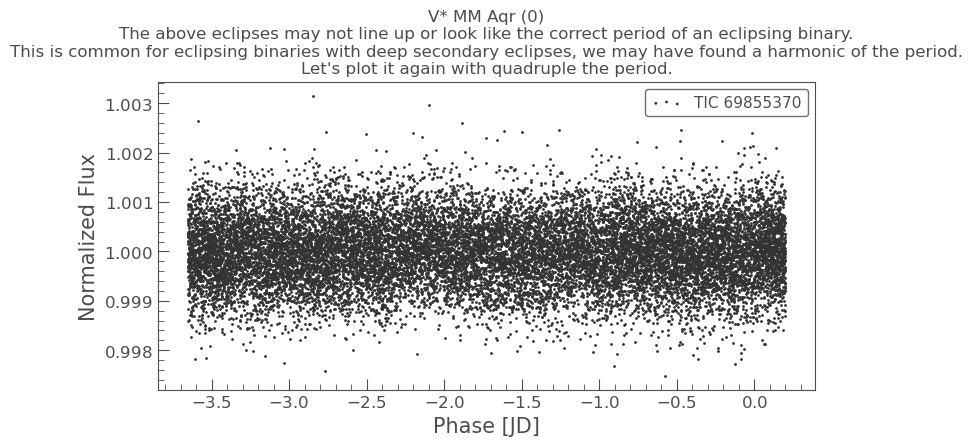

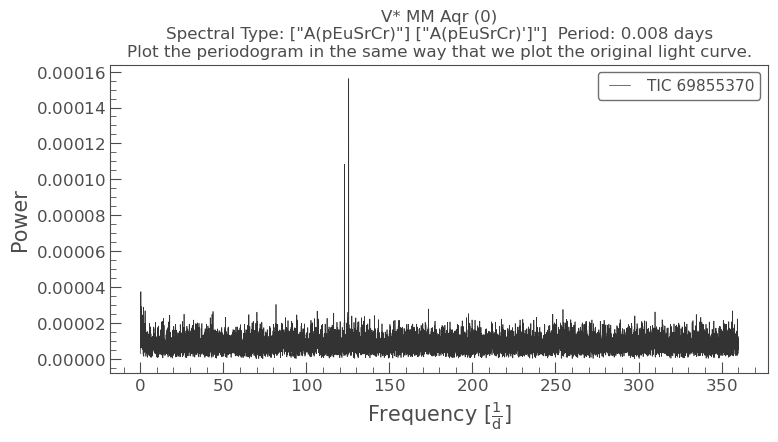

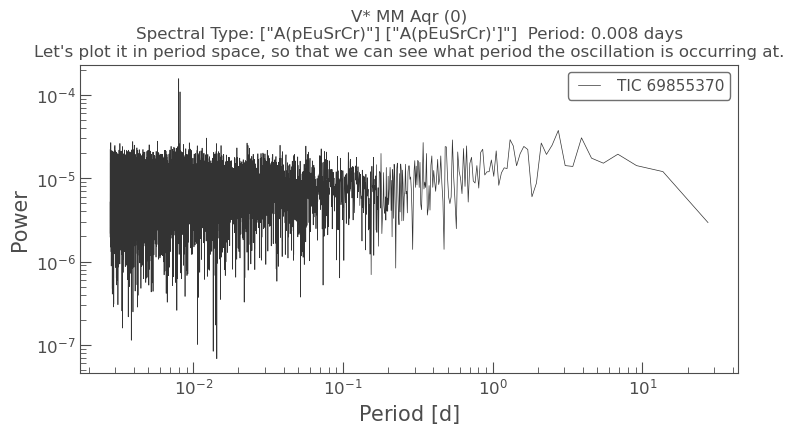

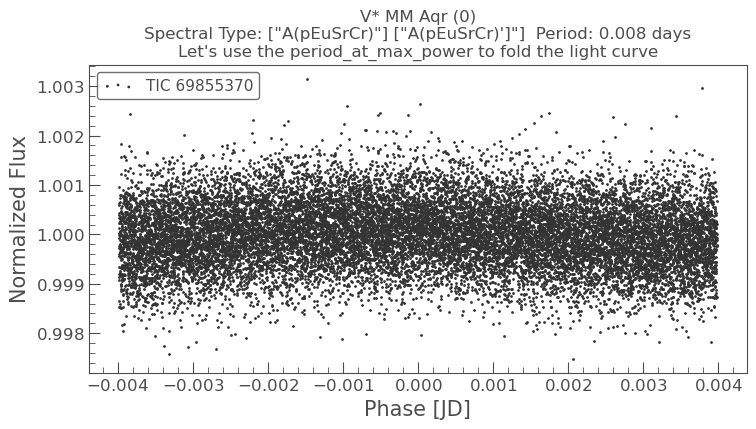

LightKurve error: wrap_phase should be between 0 and the period
i: 0
TIC: 69855370
plot_count: 1
target_period: 0.008
target1: V* MM Aqr

Done!
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]

5A. Ra: 2.1271568872336215
5B. Dec: 4.471842232348326

5C. Source_Id: 2741721583476129664


9. 1SWASP J000830.50+042818.1

10. Simbad star subclass: [""]

11. BP_RP star subclass: A9
12. BP_RP dereddened star subclass: A9
13. classlabel_espels: 
14. Star Type: red_giants

14A. v_filter [asassn_name asassval3]: ASASSN-V J000830.48+042817.6
14A. v_filter [variable_type]: ROT:


14A. v_filter [ASASSN_Variable_Type]: A colon ( : ) after the variability type -or any other field- means the value/classification is uncertain.
ROT: [Spotted Variables with rotational modulation. Light curves showing evidence of rotational modulation were classified as a generic rotational variable (ROT). 
 "https://asas-sn.osu.edu/atlas/ROT"]

14A. v_filter [Period]: nan


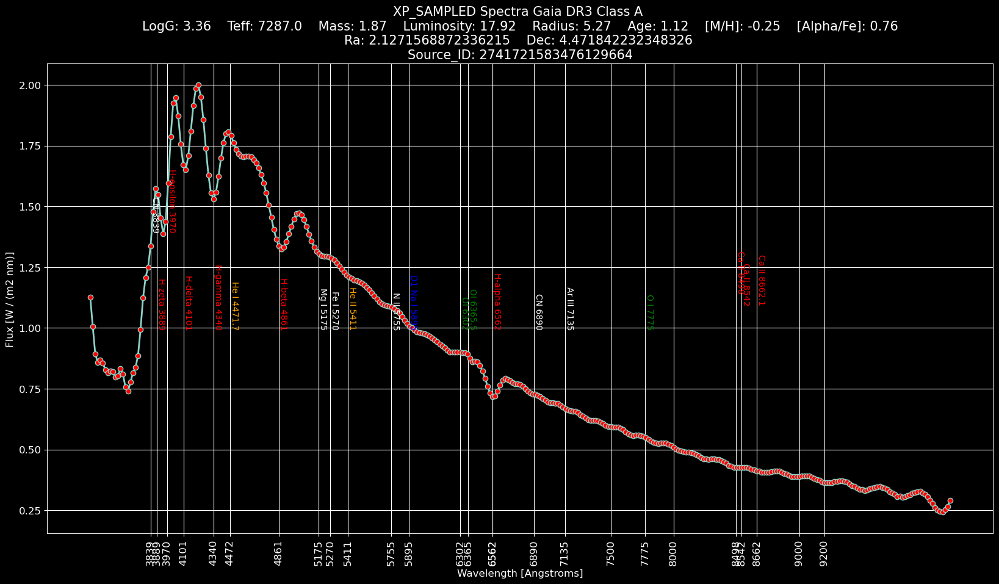

Pulled 1 of 1


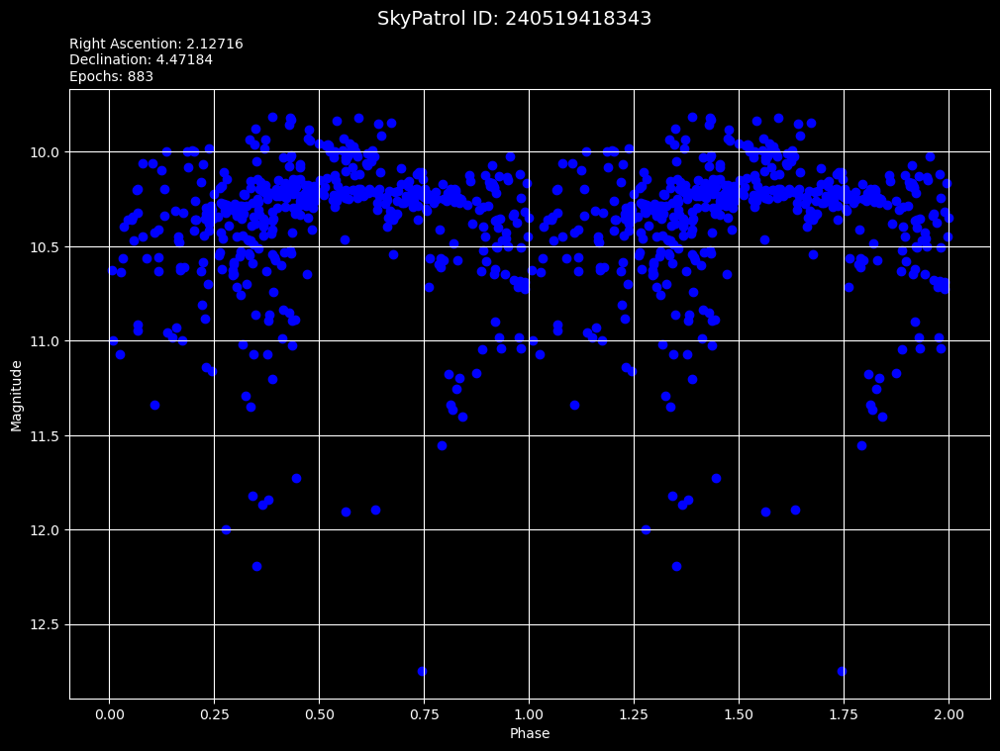

38A. tic_id is NAN
39. tic_id: 293265536
40. SearchResult containing 4 data products.

 #     mission     year   author  exptime target_name distance
                                     s                 arcsec 
--- -------------- ---- --------- ------- ----------- --------
  0 TESS Sector 42 2021      SPOC      20   293265536      0.0
  1 TESS Sector 42 2021      SPOC     120   293265536      0.0
  2 TESS Sector 42 2021 TESS-SPOC     600   293265536      0.0
  3 TESS Sector 42 2021       QLP     600   293265536      0.0


PlotTarget4B: target = tic 293265536




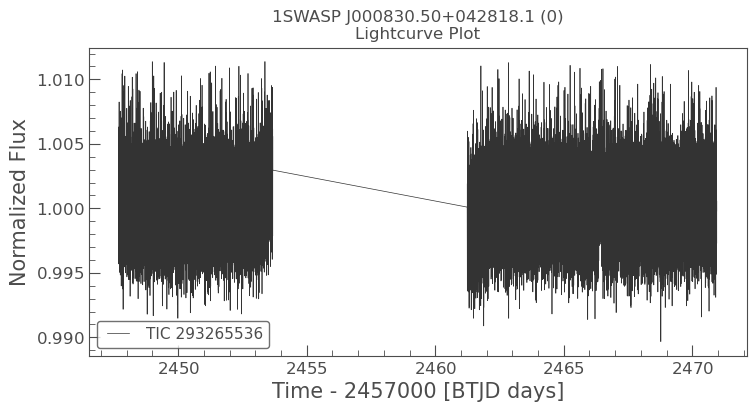

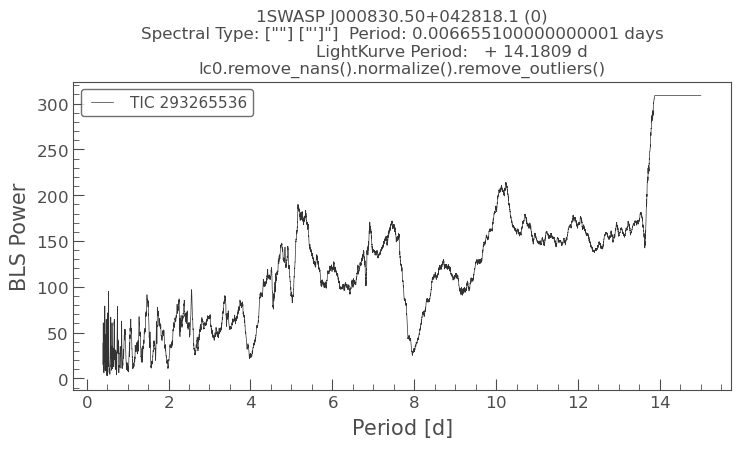

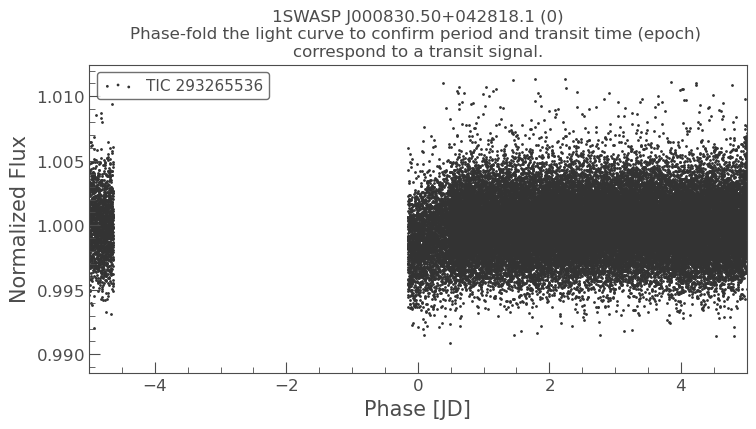

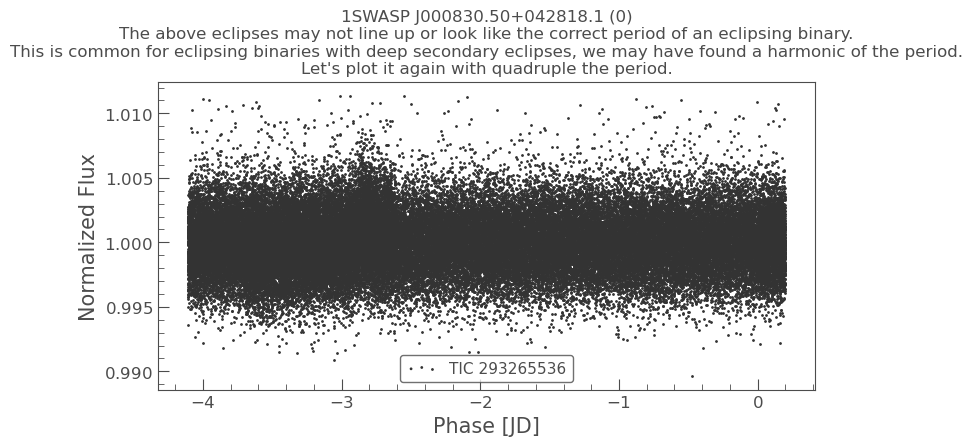

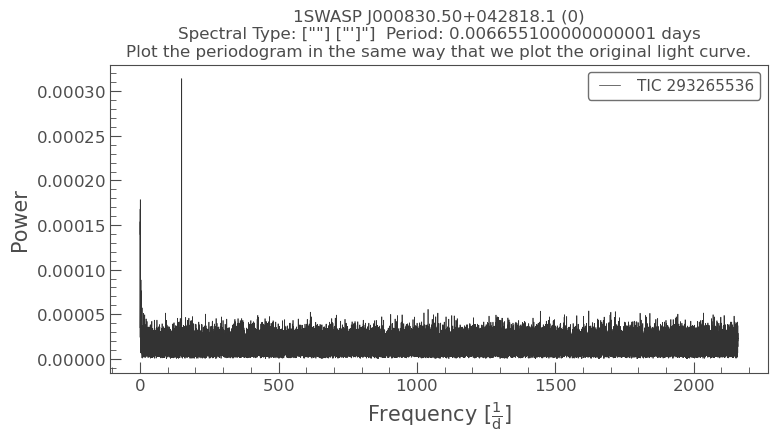

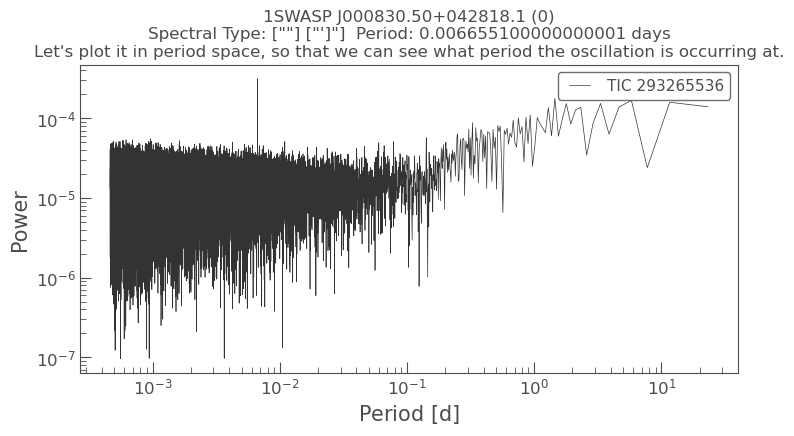

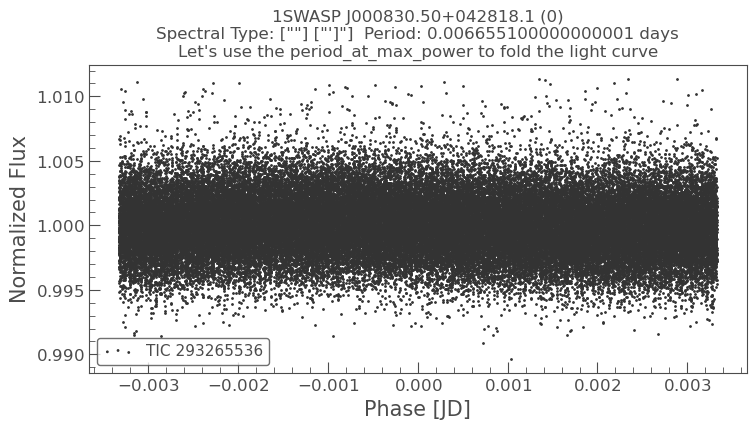

LightKurve error: wrap_phase should be between 0 and the period
i: 0
TIC: 293265536
plot_count: 1
target_period: 0.006655100000000001
target1: 1SWASP J000830.50+042818.1

Done!
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]

5A. Ra: 250.0124267473726
5B. Dec: -7.624859391858432

5C. Source_Id: 4339177971358491264


9. 2MASS J16400299-0737293
9. 2MASS J16395614-0737551

10. Simbad star subclass: ["A7VpSrEu(Cr)"]

11. BP_RP star subclass: F9
12. BP_RP dereddened star subclass: Unknown
13. classlabel_espels: 
14. Star Type: unknown

14A. v_filter [asassn_name asassval3]: ASASSN-V J164003.12-073729.6
14A. v_filter [variable_type]: VAR


14A. v_filter [ASASSN_Variable_Type]: VAR: [Variable star of unspecified type]

14A. v_filter [Period]: 593.6098156
14A. v_filter [TIC_ID]: 153101639

14B. No df_asassn_blue_filter_match!

20. aavsovsx [Period]: 0.006581999999999999

21. aavsovsx [Variability type]: roAp

22. aavsovsx [ASASSN_Variable_Typ

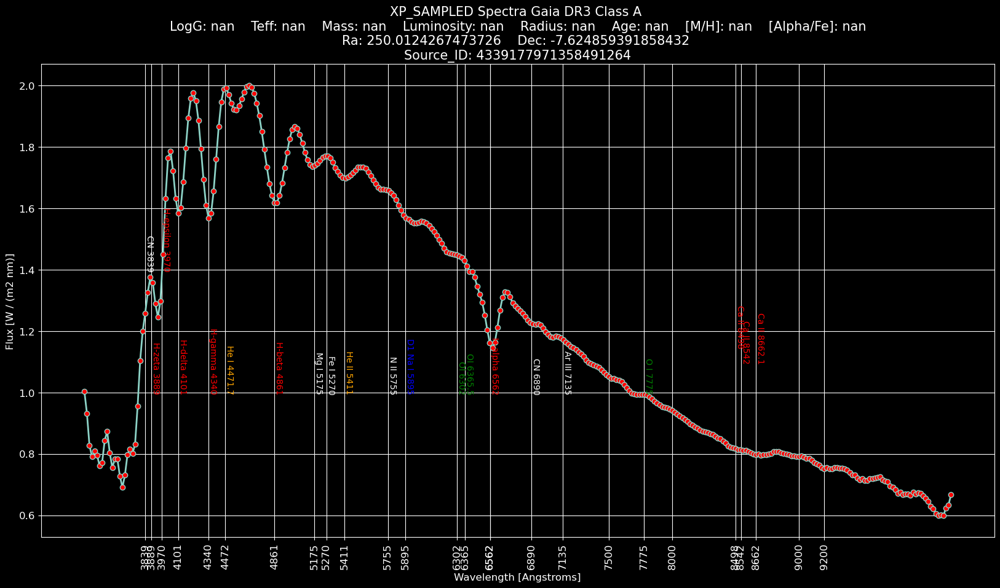

Pulled 1 of 1


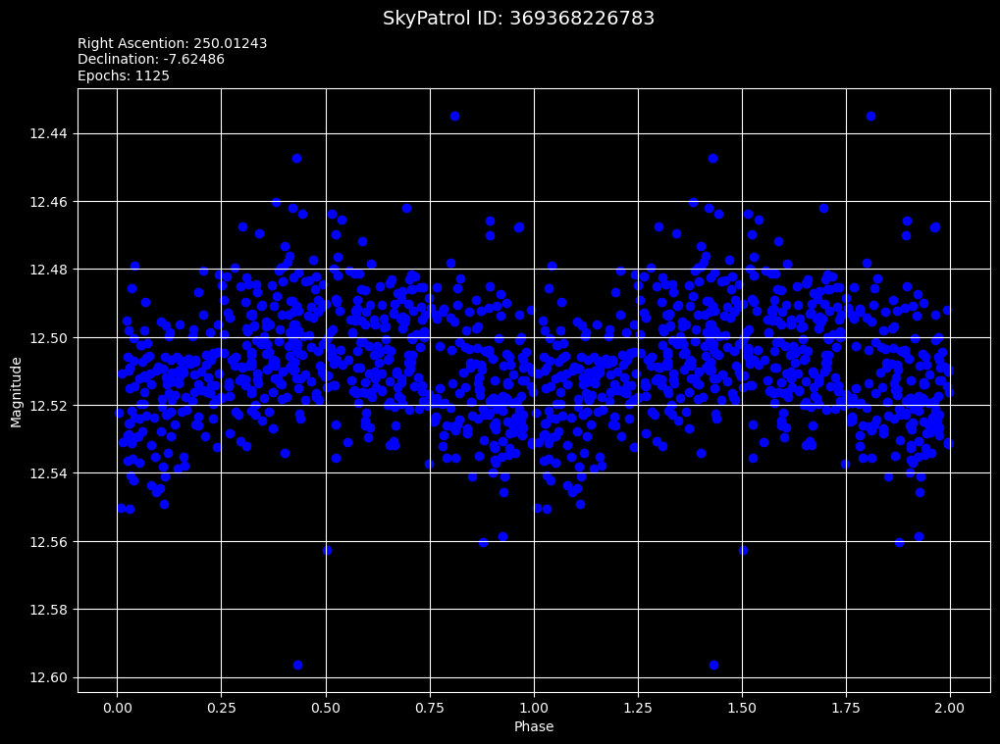

38A. tic_id is NAN
39. tic_id: 153101639
40. SearchResult containing 0 data products.


42. LightKurve plot bypassed. Length of LightKurve search result equals zero.



INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]

5A. Ra: 148.72248658142047
5B. Dec: -58.69586467784148

5C. Source_Id: 5257642094689491072


9. V* V437 Car
9. Gaia DR3 5257642060329749760

10. Simbad star subclass: ["ApSr"]

11. BP_RP star subclass: F0
12. BP_RP dereddened star subclass: A8
13. classlabel_espels: 
14. Star Type: turnoff

14A. v_filter [asassn_name asassval3]: ASASSN-V J095453.39-584145.0
14A. v_filter [variable_type]: ROT:


14A. v_filter [ASASSN_Variable_Type]: A colon ( : ) after the variability type -or any other field- means the value/classification is uncertain.
ROT: [Spotted Variables with rotational modulation. Light curves showing evidence of rotational modulation were classified as a generic rotational variable (ROT). 
 "https://asas-sn.osu.e

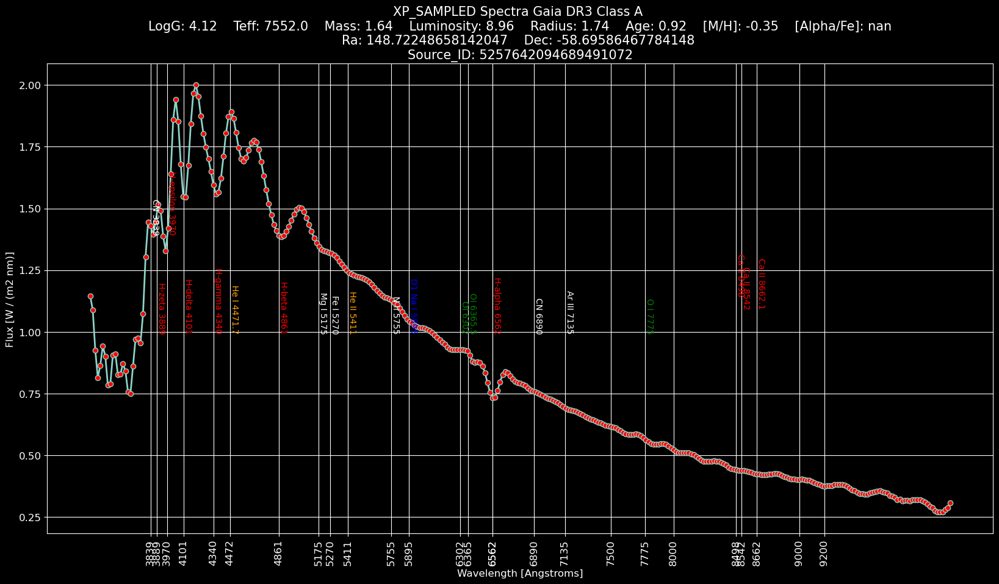

Pulled 1 of 1


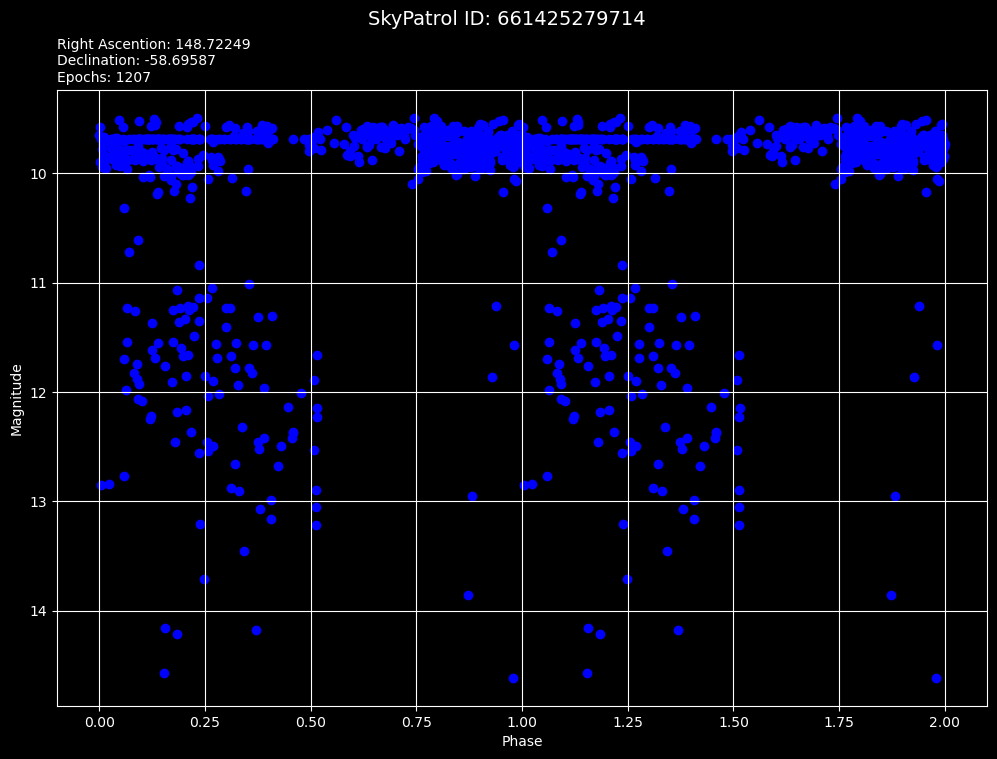

39. tic_id: 469246567
40. SearchResult containing 18 data products.

 #     mission     year   author  exptime target_name distance
                                     s                 arcsec 
--- -------------- ---- --------- ------- ----------- --------
  0 TESS Sector 09 2019      SPOC     120   469246567      0.0
  1 TESS Sector 09 2019 TESS-SPOC    1800   469246567      0.0
  2 TESS Sector 09 2019       QLP    1800   469246567      0.0
  3 TESS Sector 09 2019     CDIPS    1800   469246567      0.0
  4 TESS Sector 10 2019      SPOC     120   469246567      0.0
  5 TESS Sector 10 2019 TESS-SPOC    1800   469246567      0.0
  6 TESS Sector 10 2019       QLP    1800   469246567      0.0
  7 TESS Sector 10 2019     CDIPS    1800   469246567      0.0
  8 TESS Sector 36 2021      SPOC      20   469246567      0.0
  9 TESS Sector 36 2021      SPOC     120   469246567      0.0
 10 TESS Sector 36 2021 TESS-SPOC     600   469246567      0.0
 11 TESS Sector 36 2021       QLP     600   46924

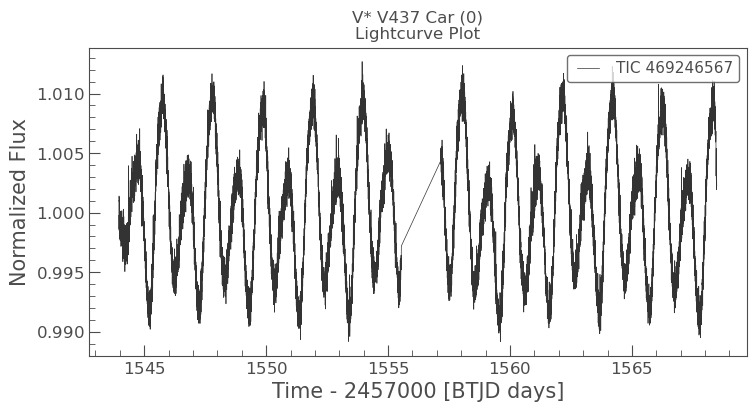

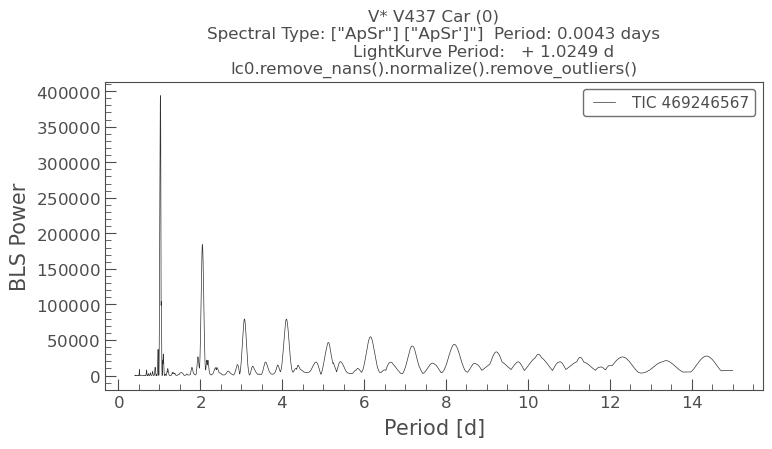

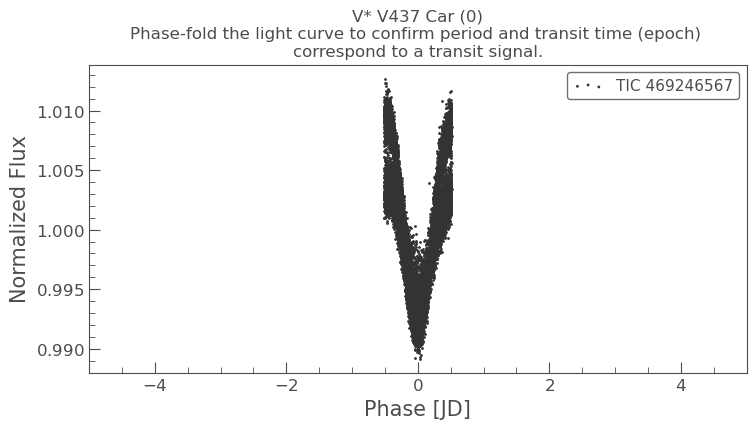

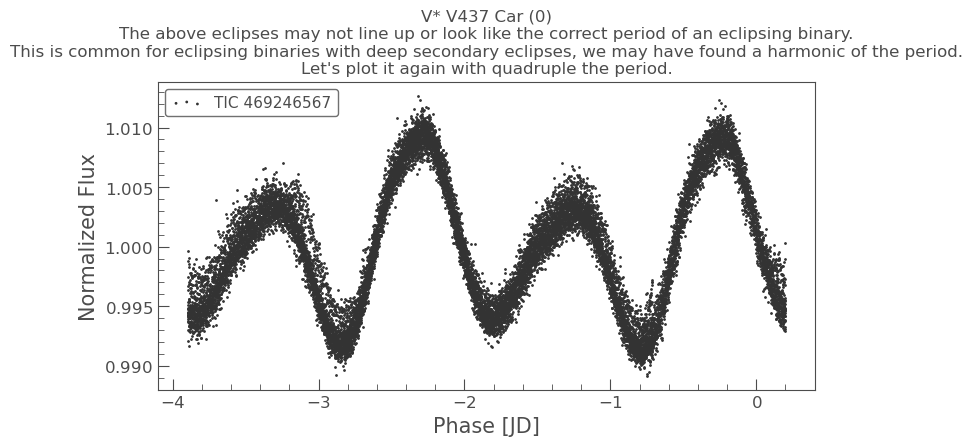

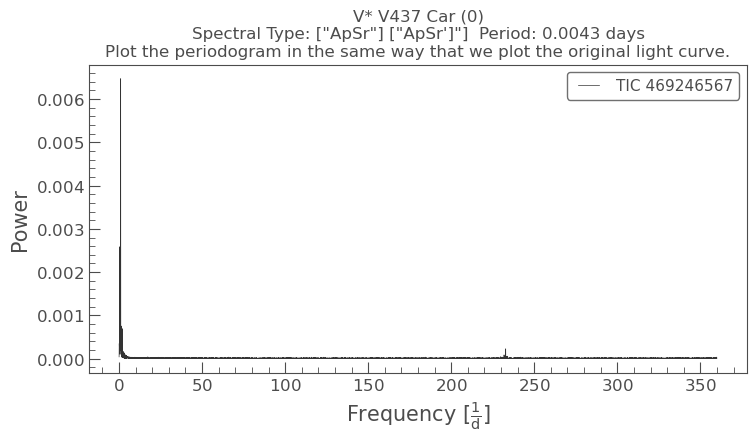

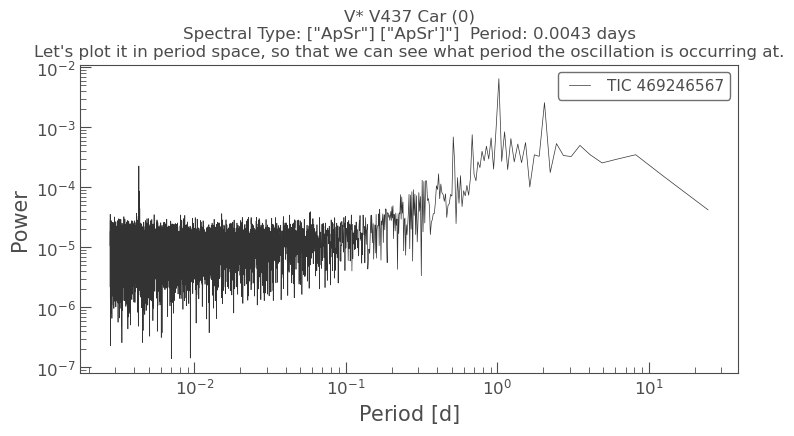

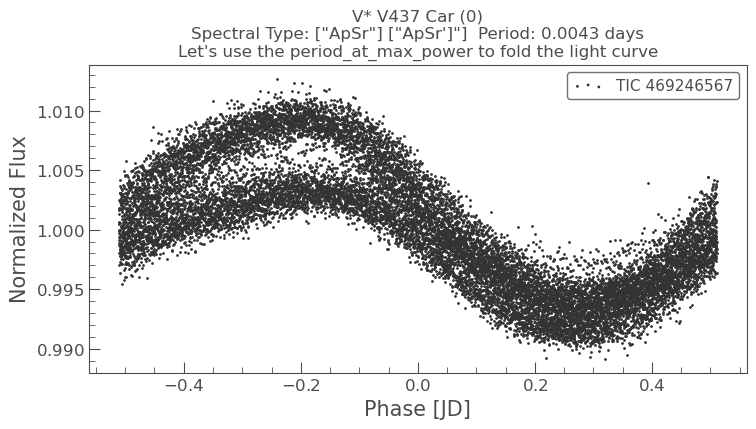

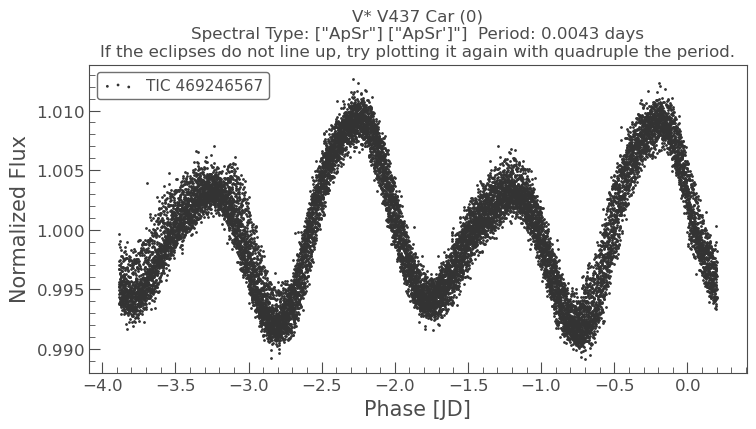

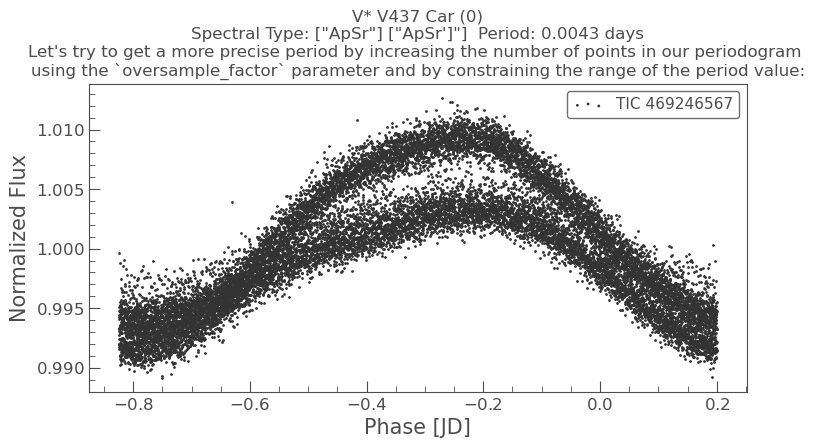


Done!

Done!


In [137]:
# RETRIEVE A SET OF SOURCES WITH XP SAMPLED SPECTRA OBAFGKM & CSTAR

plt.close("all")

# for idx in range(0, len(results)):
#print("len(gaia_subluminous_list): " + str(len(gaia_subluminous_list)))
for idx in range(0, len(gaia_list)):
    #print("idx: " + str(idx))
    source_id_target = gaia_list[idx]
    #print("\n")
    query = f"SELECT TOP 10 s.*, p.* \
    FROM gaiadr3.gaia_source AS s \
    join gaiadr3.astrophysical_parameters AS p USING (source_id) \
    WHERE p.source_id = " + str(source_id_target)

    job     = Gaia.launch_job_async(query)
    job_results = job.get_results()
    target = job_results.to_pandas()
    results = target['source_id'].values.tolist()

    #Gaia.login(user='jkarpins', password='Vbc#2o23')
    query2 = f"SELECT TOP 10 sdss.* \
    FROM gaiadr3.sdssdr13_best_neighbour AS sdss \
    WHERE sdss.source_id = " + str(source_id_target)

    job2     = Gaia.launch_job_async(query2)
    job2_results = job2.get_results()
    target2 = job2_results.to_pandas()
    #print(job2_results)
    if show_sdss_flag == 'Y':
        if len(job2_results) > 0:
            #print(job2_results)
            print(Fore.RED + "1.Gaia SDSS Match!")
            print(Style.RESET_ALL)
            xRa = str(target['ra'].iloc[0])
            yDec = str(target['dec'].iloc[0])
            source_id = str(target['source_id'].iloc[0])
            objid = str(target2['original_ext_source_id'].iloc[0])
            sdss_des = df_sdss_all[df_sdss_all['objid'].astype(str) == str(objid)]
            if len(sdss_des) > 0:
                sdss_portal = 'https://skyserver.sdss.org/dr17/VisualTools/explore/summary?ra=' + str(xRa) + '&dec=' + str(yDec)
                webbrowser.open(sdss_portal)
                print(Fore.RED + "2. SDSS Match Found!: " + str(objid))
                print(Style.RESET_ALL)
            else:
                print(Fore.RED + "3. SDSS Match Not Found!: " + str(objid))
                print(Style.RESET_ALL)
        else:
            #print(job2_results)
            print(Fore.RED + "4. No Gaia SDSS Match!")
            print(Style.RESET_ALL)

    """df_GALAH_match = df_GALAH[df_GALAH['source_id'].isin(target['source_id'])]
    if len(df_GALAH_match) > 0:
        df_GALAH_match['SpT2'] = target.apply(lambda row: starcolorindexSpT.subclass[round(row.bp_rp, 2)], axis=1)
        df_GALAH_match['SpT2_dereddened'] = target.apply(lambda row: starcolorindexSpT.subclass[round((row.bp_rp - row.ebpminrp_gspphot), 2)], axis=1)
        Plot_Spectra_Source_Id(df_GALAH_match)
    else:
        print("\nNo GALAH match found!")
        print("\n")"""

    #if len(results) != 0:
    #df_variable = df_hot_subluminous[df_hot_subluminous['source_id'] == source_id_target]
    #SpTypeSim = str(df_variable['SpTypeSim'].iloc[0])
    #SpTypeSD = str(df_variable['SpTypeSD'].iloc[0])
    #SpName = str(df_variable['Name'].iloc[0])

    #print("4A. bp_rp: " + str(target.bp_rp))
    if target.bp_rp.empty:
        target['SpT2'] = 'Unknown'
        target['SpT2_dereddened'] = 'Unknown'
    else:
        target['SpT2'] = target.apply(lambda row: starcolorindexSpT.subclass[round(row.bp_rp, 2)], axis=1)
        target['SpT2_dereddened'] = target.apply(lambda row: starcolorindexSpT.subclass[round((row.bp_rp - row.ebpminrp_gspphot), 2)], axis=1)

    conditions = [
        (target['logg_gspphot'].astype(float) > 4.20),
        ((target['logg_gspphot'].astype(float) <= 4.20) & (target['logg_gspphot'].astype(float) > 3.90)),
        ((target['logg_gspphot'].astype(float) <= 3.90) & (target['logg_gspphot'].astype(float) > 3.60)),
        ((target['logg_gspphot'].astype(float) < 2.55) & (target['logg_gspphot'].astype(float) > 2.35)),
        (target['logg_gspphot'].astype(float) <= 3.60),
        (target['logg_gspphot'].isna())
    ]
    values = ['main_sequence', 'turnoff', 'subgiants', 'red_clump', 'red_giants', 'unknown']
    target['Star_Type'] = np.select(conditions, values)

    des = df_lamost_LRS_stars[df_lamost_LRS_stars['gaia_source_id'].astype(str) == str(source_id_target)]
    if len(des) > 0:
        lamost_LRS_portal_flag = 'Y'
        lamost_LRS_designation = des['designation'].iloc[0]
        lamost_LRS_subclass = des['subclass'].iloc[0]
        lamost_LRS_obsid = des['obsid'].iloc[0]
        lamost_LRS_source_id = des['gaia_source_id'].iloc[0]
    else:
        lamost_LRS_portal_flag = 'N'

    des2 = df_lamost_MRS_stars[df_lamost_MRS_stars['gaia_source_id'].astype(str) == str(source_id_target)]
    if len(des2) > 0:
        lamost_MRS_portal_flag = 'Y'
        lamost_MRS_designation = des2['designation'].iloc[0]
        lamost_MRS_mobsid = des2['mobsid'].iloc[0]
        lamost_MRS_obsid = des2['obsid'].iloc[0]
        lamost_MRS_source_id = des2['gaia_source_id'].iloc[0]
    else:
        lamost_MRS_portal_flag = 'N'

    if show_lamost_LRS_flag == 'Y':
        if lamost_LRS_portal_flag == 'Y':
            lamost_portal = 'https://dr7.lamost.org/spectrum/view?obsid=' + str(lamost_LRS_obsid)
            webbrowser.open(lamost_portal)     

    if show_lamost_MRS_flag == 'Y':
        if lamost_MRS_portal_flag == 'Y':
            lamost_MRS_portal = 'https://dr7.lamost.org/v2.0/medspectrum/view?obsid=' + str(lamost_MRS_obsid)
            webbrowser.open(lamost_MRS_portal)

    xRa = str(target['ra'].iloc[0])
    yDec = str(target['dec'].iloc[0])
    source_id = str(target['source_id'].iloc[0])
 
    print(Fore.YELLOW + "\n5A. " + "Ra: " + str(xRa))                                                                    
    print("5B. Dec: " + str(yDec))

    print("\n5C. Source_Id: " + str(source_id))

    if cds_portal_flag == 'Y':
        cds_portal = 'http://cdsportal.u-strasbg.fr/?target=' + str(xRa) + '%20' + str(yDec)
        webbrowser.open(cds_portal) 

    if simbad_portal_flag == 'Y':
        simbad_portal = 'http://simbad.cds.unistra.fr/simbad/sim-coo?Coord=' + str(xRa) + '+' + str(yDec) + \
                    '&CooFrame=FK5&CooEpoch=2000&CooEqui=2000&CooDefinedFrames=none&Radius=2&Radius.unit=arcmin&submit=submit+query'
        webbrowser.open(simbad_portal)  

    if sdss_portal_flag == 'Y':
        sdss_portal = 'https://skyserver.sdss.org/dr17/VisualTools/explore/summary?ra=' + str(xRa) + '&dec=' + str(yDec)
        webbrowser.open(sdss_portal)           

    if vizier_portal_flag == 'Y':
        vizier_portal = 'http://vizier.u-strasbg.fr/viz-bin/VizieR-S?Gaia%20EDR3%20' + str(source_id) 
        webbrowser.open(vizier_portal)
        

    # ====================================================================================
                                                
    result_table = Simbad.query_region(coord.SkyCoord(str(xRa) + " " + str(yDec), 
        unit=(u.deg, u.deg),frame='icrs'))

    #print("6: Simbad query restult table: " + str(result_table))                                                                          
    if result_table is not None:
        if len(result_table) > 0:
            #print("7: " + "Ra: " + str(xRa))                                                                     
            #print("8: " + "Dec: " + str(yDec))   
            print("\n")                                                                

            for i in range(0, len(result_table['MAIN_ID'])):
                if i < 2:
                    print("9. " + str(result_table['MAIN_ID'][i]))

            target1 = result_table['MAIN_ID'][0]

            object = Simbad.query_object(target1)

            tap_service = vo.dal.TAPService("http://simbad.u-strasbg.fr/simbad/sim-tap")

            tap_sql = "SELECT main_id, sp_type, otype_txt, otype_longname \
                            FROM basic JOIN ident ON oidref = oid \
                                JOIN otypedef ON basic.otype = otypedef.otype \
                            WHERE id = '" + str(target1) + "';"

            tap_results = tap_service.search(tap_sql)
            sptype = tap_results['sp_type']
            txt = str(sptype).split("=")
            txt = str(txt).replace("['", "")
            sp_txt = str(txt).replace("']", "")
            #print("\n" + "Simbad star subclass: " + str(sp_txt))
            print(Fore.GREEN + "\n10. Simbad star subclass: " + str(sp_txt))
            print(Style.RESET_ALL)
    else:
        print(Fore.RED + "\n10B. No Simbad Match")
        print(Style.RESET_ALL)

    print("11. BP_RP star subclass: " + str(target['SpT2'].iloc[0]))
    print("12. BP_RP dereddened star subclass: " + str(target['SpT2_dereddened'].iloc[0]))
    print(Fore.GREEN + "13. classlabel_espels: " + str(target['classlabel_espels'].iloc[0])) 
    print(Fore.YELLOW + "14. Star Type: " + str(target['Star_Type'].iloc[0]))
    print(Style.RESET_ALL) 
    #print("\nSpTypeSim: " +  str(SpTypeSim))
    #print("SpTypeSD: " +  str(SpTypeSD))
    #print("SpName: " +  str(SpName))
    #print("\n")

    TIC_ID_2 = 0
    Period_2 = 0
    variable_type1 = " "
    variable_type2 = " "
    variable_type3 = " "

    df_v_filter = df_asassn_v_filter_match[df_asassn_v_filter_match['gaia_source_id'] == str(source_id_target)]
    if len(df_v_filter) > 0:
        asassval3 = df_v_filter['asassn_name'].values[0]
        print("14A. v_filter [asassn_name asassval3]: " + str(asassval3))
        variable_type1 = df_v_filter['variable_type'].values[0]
        print(Fore.RED + "14A. v_filter [variable_type]: " + str(variable_type1))
        print(Style.RESET_ALL)
        ASASSN_Variable_Type1 = vType[variable_type1]
        print(Fore.YELLOW + "\n14A. v_filter [ASASSN_Variable_Type]: " + str(ASASSN_Variable_Type1))
        print(Style.RESET_ALL)
        period = df_v_filter['period'].values[0]
        print("14A. v_filter [Period]: " + str(period))
        tic_id = df_v_filter['tic_id'].values[0]
        print("14A. v_filter [TIC_ID]: " + str(tic_id[4:]))
        if len(tic_id) > 0:
            TIC_ID_2 = tic_id[4:]
        if period > 0:
            Period_2 = period
        #webbrowser.open('https://asas-sn.osu.edu/variables?&name=' + str(asassval3))
    else:
        #print("14A. source_id_target: " + str(source_id_target))
        print("14A. No df_asassn_v_filter_match!")

    

    df_blue_filter = df_asassn_blue_filter_match[df_asassn_blue_filter_match['gaia_source_id'] == str(source_id_target)]
    if len(df_blue_filter) > 0:
        asassval2 = df_blue_filter['ID'].values[0]
        print("\n14B. blue_filter [ID asassval2]: " + str(asassval2))
        variable_type2 = df_blue_filter['ML_classification'].values[0]
        print(Fore.RED + "14B. blue_filter [ML_classification]: " + str(variable_type2))
        print(Style.RESET_ALL)
        if variable_type2 != variable_type1:
            ASASSN_Variable_Type2 = vType[variable_type2]
            print(Fore.YELLOW + "\n14B. Blue filter [ASASSN_Variable_Type]: " + str(ASASSN_Variable_Type2))
            print(Style.RESET_ALL)
        period = df_blue_filter['Period'].values[0]
        print("14B. blue_filter [Period]: " + str(period))
        tic_id = df_blue_filter['TIC_ID'].values[0]
        print("14B. blue_filter [TIC_ID]: " + str(tic_id[4:]))
        if len(tic_id) > 0:
            TIC_ID_2 = tic_id[4:]
        if period > 0:
            Period_2 = period
        #webbrowser.open('https://asas-sn.osu.edu/variables?&name=' + str(asassval2))
    else:
        #print("14B. source_id_target: " + str(source_id_target))
        print("\n14B. No df_asassn_blue_filter_match!")

    if asas_sn_flag == 'Y':
        df_variable = df_asassn_variables[df_asassn_variables['gaia_source_id'] == source_id_target]
        asassval = df_variable['asas_sn_id'].values[0]
        df_aavs_name = df_asassn_sn_name[df_asassn_sn_name['asas_sn_id'] == asassval]
        if len(df_aavs_name) > 0:
            print("\n15. df_aavs_name: " + str(df_aavs_name ))
            asassval1 = df_aavs_name['name'].values[0]
            print("16. name asassval1: " + str(asassval1))
            webbrowser.open('https://asas-sn.osu.edu/variables?&name=' + str(asassval1))
        
        df_sublum = df_hot_subluminous_all[df_hot_subluminous_all['source_id'].astype(str) == str(source_id_target)]
        if len(df_sublum) > 0:
            SpTypeSim = df_sublum['SpTypeSim'].values[0]
            SpTypeSD = df_sublum['SpTypeSD'].values[0]
            SpName = df_sublum['Name'].values[0]
            print(Fore.GREEN + "\n17. hot_subluminous SpTypeSim: " + str(SpTypeSim))
            print(Fore.GREEN + "\n18. hot_subluminous SpTypeSD: " + str(SpTypeSD))
            print(Fore.GREEN + "\n19. hot_subluminous Name: " + str(SpName))
            print(Style.RESET_ALL)
        else:
            #print(Fore.RED + "No hot subluminous star match for source_id: " + str(source_id_target))
            print(Style.RESET_ALL)
        df_aavsovsx = df_asassn_sn_aavsovsx_all[df_asassn_sn_aavsovsx_all['asas_sn_id'] == asassval]
        period = 0
        variability_type = " "
        if df_aavsovsx.shape[0] > 0:
            period = df_aavsovsx['period'].values[0]
            print(Fore.GREEN + "20. aavsovsx [Period]: " + str(period))
            variable_type3 = df_aavsovsx['variability_type'].values[0]
            print(Fore.RED + "\n21. aavsovsx [Variability type]: " + str(variable_type3))
            if variable_type3 in (variable_type1, variable_type2):
                print(Style.RESET_ALL)
            else:
                ASASSN_Variable_Type = vType[variable_type3]
                print(Fore.YELLOW + "\n22. aavsovsx [ASASSN_Variable_Type]: " + str(ASASSN_Variable_Type))
                print(Style.RESET_ALL)
        else:
            print(Fore.RED + "23. No aavsovsx star match for asas_sn_id: " + str(asassval))
            print(Style.RESET_ALL)
        if np.isnan(df_variable['tic_id'].values[0]):
            tic_id = TIC_ID_2
        else:
            tic_id = int(df_variable['tic_id'].values[0])
        print(Fore.GREEN + "24. asassval[asas_sn_id]: " + str(asassval))
        print(Fore.GREEN + "\n25. [tic_id]: " + str(tic_id))
        print(Style.RESET_ALL)
        #webbrowser.open('http://asas-sn.ifa.hawaii.edu/skypatrol/objects/' + str(asassval))

    if lamost_LRS_portal_flag == 'Y':
        print("\n26. lamost_LRS_designation: "  + str(lamost_LRS_designation))
        print("27. lamost_LRS_obsid: "  + str(lamost_LRS_obsid))
        #print("lamost_LRS_gaia_source_id: "  + str(lamost_LRS_source_id))
        print("28. lamost_LRS_subclass: " + str(lamost_LRS_subclass) + '\n' )
    else:
        print(Fore.RED + "\n29. No Lamost LRS Match found!")
        print(Style.RESET_ALL)

    if lamost_MRS_portal_flag == 'Y':
        print("30. lamost_MRS_designation: "  + str(lamost_MRS_designation))
        print("31. lamost_MRS_obsid: "  + str(lamost_MRS_obsid))
        #print("lamost_MRS_gaia_source_id: "  + str(lamost_MRS_source_id))
        print("32. lamost_MRS_mobsid: " + str(lamost_MRS_mobsid) + '\n' )
    else:
        print(Fore.RED + "33. No Lamost MRS Match found!")
        print(Style.RESET_ALL)

        # ====================================================================================

    #print("\nGaia XP match found for source_id: " + str(source_id_target))
    #print("\n1: " + str(results[0]) + ' has_xp_sampled: ' + str(target['has_xp_sampled'].iloc[0]))                        # 1st print statement
    if target['has_xp_sampled'].iloc[0] == True:
        #print("2A")
        datalink = Gaia.load_data(results[0], data_structure = 'INDIVIDUAL', retrieval_type = 'XP_SAMPLED')
        outputs = [datalink[key][0] for key in datalink.keys()]

        #print("2: " + str(results[0]) + " Number of stars with XP Spectra: " + str(len(outputs)))                         # 2nd print statement
        if outputs is not None:
            #print("3: " + "outputs is not None")                                                                            # 3rd print statement
            if len(outputs) > 0:
                xp      = outputs[0].to_table()                       
                # Add flux-density columns ============================
                xp['flux_jy']         = xp['flux'].to(u.Jansky, equivalencies = u.spectral_density(xp['wavelength'].value * xp['wavelength'].unit))
                xp['flux_mjy']        = xp['flux_jy'].to(u.millijansky)
                xp['flux_mjy'].format = '7.4f'
                
                # =========
                
                #display(xp)

                # =========

                fig       = plt.figure(figsize=[20,10])

                yRangeMax = float(xp['flux'].max())

                plt.plot(xp['wavelength']*10, xp['flux']/yRangeMax * 2, linewidth = 2, marker='o', markerfacecolor='red') 
                #plt.title('XP_SAMPLED Spectra Gaia DR3 Class '+ str(target['spectraltype_esphs'].iloc[0]) + "    SpTypeSim: " + str(SpTypeSim) +
                plt.title('XP_SAMPLED Spectra Gaia DR3 Class '+ str(target['spectraltype_esphs'].iloc[0]) +
                ' \nLogG: ' + str(round(target['logg_gspphot'].iloc[0], 2)) + 
                '    Teff: ' + str(round(target['teff_gspphot'].iloc[0],0)) +
                '    Mass: ' + str(round(target['mass_flame'].iloc[0],2)) +
                '    Luminosity: ' + str(round(target['lum_flame'].iloc[0],2)) +
                '    Radius: ' + str(round(target['radius_gspphot'].iloc[0],2)) +
                '    Age: ' + str(round(target['age_flame'].iloc[0],2)) +
                '    [M/H]: ' + str(round(target['mh_gspphot'].iloc[0],2)) +
                '    [Alpha/Fe]: ' + str(round(target['alphafe_gspspec'].iloc[0],2)) +
                '\nRa: ' + str(target['ra'].iloc[0]) + "    Dec: " + str(target['dec'].iloc[0]) +
                ' \nSource_ID: ' + str(target['source_id'].iloc[0]), fontsize=15)

                if make_canvas_flag == "Y":
                    make_canvas(xlabel = f"Wavelength [{xp['wavelength'].unit}]", ylabel = f"Flux [{xp['flux'].unit}]", 
                                fontsize = 12)
                #else:
                    #make_labels()

                if hydrogen_lines_flag == "Y":
                    Hydrogen_lines(xlabel = f"Wavelength [{xp['wavelength'].unit}]", ylabel = f"Flux [{xp['flux'].unit}]", 
                                fontsize = 12)

                plt.show()
                
            else:
                print("\n34: Gaia XP match not found for source_id: " + str(source_id_target))
        else:
                print("\n35: Gaia XP match not found for source_id: " + str(source_id_target))
    else:
                print("\n36: Gaia XP match not found for source_id: " + str(source_id_target))

    if show_SkyPatrol_flag  == 'Y':
        asas_sn_id = int(asassval)
        lcs = client.query_list([asas_sn_id],
            catalog='master_list',id_col='asas_sn_id',download=True)
        lightcurve = lcs[asas_sn_id]
        #lightcurve.plot()

        """
        Periodigram Utility
        We have included a thin-wrapper for astropy’s lomb scargle periodagram utility. 
        Using the lomb_scargle function we can get the freqency and power spectrum of the light curve. 
        While ‘plot’ is set to True, the function will also produce a plot of the power spectrum
        """;

        # An astropy LombScargle object is also returned as ls
        frequency, power, ls = lightcurve.lomb_scargle(plot=False)

        """
        Finally, we can use the power spectrum to find the period of our target and generate a 
        phase folded lightcurve.
        """;

        # If plot is set we will also get a plot.
        lightcurve.find_period(frequency, power, plot=True)

    if show_rvs_flag == "Y":
        #print("\n" + str(results[0]) + ' has_rvs: ' + str(target['has_rvs'].iloc[0]) + "\n")
        print(Fore.RED + "37. " + str(results[0]) + ' has_rvs: ' + str(target['has_rvs'].iloc[0]))
        print(Style.RESET_ALL)
        if target['has_rvs'].iloc[0] == True:
            datalinkRVS = Gaia.load_data(results[0], data_structure = 'INDIVIDUAL', retrieval_type = 'RVS')
            outputsRVS = [datalinkRVS[key][0] for key in datalinkRVS.keys()]
            #print("datalinkRVS: " + str(datalinkRVS))

            if outputsRVS is not None:
                if len(outputsRVS) >0:
                    xpRVS      = outputsRVS[0].to_table()

                    # =========
                
                    #display(xpRVS)

                    # =========

                    fig       = plt.figure(figsize=[20,10])

                    yRangeMax = float(xpRVS['flux'].max())

                    plt.plot(xpRVS['wavelength']*10, xpRVS['flux']/yRangeMax * 2, linewidth = 2, marker='.', markerfacecolor='red') 
                    plt.title('RVS Spectra Gaia DR3 Class '+ str(target['spectraltype_esphs'].iloc[0]) + 
                    ' \nLogG: ' + str(round(target['logg_gspspec'].iloc[0], 2)) + 
                    '    Teff: ' + str(round(target['teff_gspspec'].iloc[0],0)) +
                    '    Mass: ' + str(round(target['mass_flame'].iloc[0],2)) +
                    '    Luminosity: ' + str(round(target['lum_flame'].iloc[0],2)) +
                    '    Radius: ' + str(round(target['radius_gspphot'].iloc[0],2)) +
                    '    Age: ' + str(round(target['age_flame'].iloc[0],2)) +
                    '    [M/H]: ' + str(round(target['mh_gspspec'].iloc[0],2)) +
                    '    [Alpha/Fe]: ' + str(round(target['alphafe_gspspec'].iloc[0],2)) +
                    '\nRa: ' + str(target['ra'].iloc[0]) + "    Dec: " + str(target['dec'].iloc[0]) +
                    ' \nSource_ID: ' + str(target['source_id'].iloc[0]), fontsize=15)

                    if make_canvas_flag == "Y":
                        #make_canvas(xlabel = f"Wavelength [{xp['wavelength'].unit}]", ylabel = f"Flux [{xp['flux'].unit}]", fontsize = 12)
                        #make_labels()
                        make_RVS_canvas()
                        
                    plt.show()


                    fig       = plt.figure(figsize=[20,10])

                    yRangeMax = float(xpRVS['flux'].max())

                    plt.plot(xpRVS['wavelength']*10, xpRVS['flux']/yRangeMax * 2, linewidth = 2, marker='.', markerfacecolor='red') 
                    plt.title('RVS Spectra Gaia DR3 Class '+ str(target['spectraltype_esphs'].iloc[0]) + 
                    ' \nLogG: ' + str(round(target['logg_gspspec'].iloc[0], 2)) + 
                    '    Teff: ' + str(round(target['teff_gspspec'].iloc[0],0)) +
                    '    Mass: ' + str(round(target['mass_flame'].iloc[0],2)) +
                    '    Luminosity: ' + str(round(target['lum_flame'].iloc[0],2)) +
                    '    Radius: ' + str(round(target['radius_gspphot'].iloc[0],2)) +
                    '    Age: ' + str(round(target['age_flame'].iloc[0],2)) +
                    '    [M/H]: ' + str(round(target['mh_gspspec'].iloc[0],2)) +
                    '    [Alpha/Fe]: ' + str(round(target['alphafe_gspspec'].iloc[0],2)) +
                    '\nRa: ' + str(target['ra'].iloc[0]) + "    Dec: " + str(target['dec'].iloc[0]) +
                    ' \nSource_ID: ' + str(target['source_id'].iloc[0]), fontsize=15)

                    plt.xlim(8460, 8580)

                    if make_canvas_flag == "Y":
                        #make_canvas(xlabel = f"Wavelength [{xp['wavelength'].unit}]", ylabel = f"Flux [{xp['flux'].unit}]", fontsize = 12)
                        #make_labels()
                        make_RVS_canvas1()
                        
                    plt.show()


                    fig       = plt.figure(figsize=[20,10])

                    yRangeMax = float(xpRVS['flux'].max())

                    plt.plot(xpRVS['wavelength']*10, xpRVS['flux']/yRangeMax * 2, linewidth = 2, marker='.', markerfacecolor='red') 
                    plt.title('RVS Spectra Gaia DR3 Class '+ str(target['spectraltype_esphs'].iloc[0]) + 
                    ' \nLogG: ' + str(round(target['logg_gspspec'].iloc[0], 2)) + 
                    '    Teff: ' + str(round(target['teff_gspspec'].iloc[0],0)) +
                    '    Mass: ' + str(round(target['mass_flame'].iloc[0],2)) +
                    '    Luminosity: ' + str(round(target['lum_flame'].iloc[0],2)) +
                    '    Radius: ' + str(round(target['radius_gspphot'].iloc[0],2)) +
                    '    Age: ' + str(round(target['age_flame'].iloc[0],2)) +
                    '    [M/H]: ' + str(round(target['mh_gspspec'].iloc[0],2)) +
                    '    [Alpha/Fe]: ' + str(round(target['alphafe_gspspec'].iloc[0],2)) +
                    '\nRa: ' + str(target['ra'].iloc[0]) + "    Dec: " + str(target['dec'].iloc[0]) +
                    ' \nSource_ID: ' + str(target['source_id'].iloc[0]), fontsize=15)

                    plt.xlim(8580, 8700)

                    if make_canvas_flag == "Y":
                        #make_canvas(xlabel = f"Wavelength [{xp['wavelength'].unit}]", ylabel = f"Flux [{xp['flux'].unit}]", fontsize = 12)
                        #make_labels()
                        make_RVS_canvas2()
                        
                    plt.show()
                
    if show_galah_flag == 'Y':
        df_GALAH_match = df_GALAH[df_GALAH['source_id'].isin(target['source_id'])]
        if len(df_GALAH_match) > 0:
            df_GALAH_match['SpT2'] = target.apply(lambda row: starcolorindexSpT.subclass[round(row.bp_rp, 2)], axis=1)
            df_GALAH_match['SpT2_dereddened'] = target.apply(lambda row: starcolorindexSpT.subclass[round((row.bp_rp - row.ebpminrp_gspphot), 2)], axis=1)
            Plot_Spectra_Source_Id(df_GALAH_match)
        else:
            print(Fore.RED + "38. No GALAH match found!")
            print(Style.RESET_ALL)
            #print("\n")

    if Plot_LightKurve_flag == "Y":
        df_variable = df_asassn_variables[df_asassn_variables['gaia_source_id'] == source_id_target]
        if np.isnan(df_variable['tic_id'].values[0]):
            #tic_id = 0
            print("38A. tic_id is NAN")
            tic_id = int(TIC_ID_2)
        else:
            tic_id = int(df_variable['tic_id'].values[0])
            """if len(tic_id) > 0:
                TIC_ID_2 = tic_id"""
        #print("38B. tic_id: " + str(tic_id))
        print(Fore.YELLOW + "39. tic_id: " + str(tic_id))
        tic_target = "tic " + str(tic_id)
        search_result = lk.search_lightcurve(tic_target)
        #print("\n")
        #print(search_result)
        print(Fore.YELLOW + "40. " +str(search_result))
        print(Style.RESET_ALL)
        #print("\n")
        #print("Length of lightcurve search_result: " + str(len(search_result)))
        if period == 0:
            period = Period_2
            print(Fore.RED +  "41A. Resetting period to V or Blue filter period value!")
        #print(Fore.YELLOW + "41. Length of lightcurve search_result: " + str(len(search_result)))
        print(Style.RESET_ALL)
        if len(search_result) > 0:
            #print("41B. tic_id: " + str(tic_id))
            Plot_LightKurve(tic_id, plot_count, period, target1)
        else:
            print(Fore.RED + "42. LightKurve plot bypassed. Length of LightKurve search result equals zero.")
            print(Style.RESET_ALL)
            print("\n")

    
    

print("\nDone!")

https://en.wikipedia.org/wiki/Subdwarf_O_star

https://en.wikipedia.org/wiki/Subdwarf_B_star



http://www.astronomy.villanova.edu/lward/Seattle%20Poster%20Final.pdf

In [ ]:
# Absortion lines

"""
3889:HeI
3728.3:OII
3934.78:CaK
3969.59:CaH
3971.19:He
4072.3:SII
4102.89:Hd
4227.92:CaI
4305.61:G
4341.68:Hc
4364.44:OIII
4862.68:Hb
4932.6:OIII
4960.3:OIII
5008.24:OIII
5176.7:Mg
5895.6:Na
6302.05:OI
6365.54:OI
6529.03:NI
6549.86:NII
6564.61:Ha
6585.27:NII
6718.29:SII
6732.67:SII
8500.35:Ca
8544.44:Ca
8664.52:Ca


3889:HeI
3728.3:OII
3934.78:CaK
3969.59:CaH
3971.19:He
4072.3:SII
4102.89:Hd
4227.92:CaI
4305.61:G
4341.68:Hc
4364.44:OIII
4862.68:Hb
4932.6:OIII
4960.3:OIII
5008.24:OIII
5176.7:Mg
5895.6:Na
6302.05:OI
6365.54:OI
6529.03:NI
6549.86:NII
6564.61:Ha
6585.27:NII
6718.29:SII
6732.67:SII
8500.35:Ca
8544.44:Ca
8664.52:Ca


3889:HeI
3728.3:OII
3934.78:CaK
3969.59:CaH
3971.19:He
4072.3:SII
4102.89:Hd
4227.92:CaI
4305.61:G
4341.68:Hc
4364.44:OIII
4862.68:Hb
4932.6:OIII
4960.3:OIII
5008.24:OIII
5176.7:Mg
5895.6:Na
6302.05:OI
6365.54:OI
6529.03:NI
6549.86:NII
6564.61:Ha
6585.27:NII
6718.29:SII
6732.67:SII
8500.35:Ca
8544.44:Ca
8664.52:Ca


"""

In [ ]:
# Emission lines

"""
1400:SIV+OIV
1549:CIV
1640:HeII
1909:CIII
2326:CII
2800:Mg
3727:OII
5876:HeI
1033.3:OVI
1239.42:NV
1305.53:OI
1335.52:CII
3346.79:NeV
3426.85:NeV
3728.3:OII
3869.7867:NeIII
4102.89:Hdelta
4341.6803:Hgamma
4364.3782:OIII
4862.6778:Hbeta
4960.214:OIII
5008.1666:OIII
6301.9425:OI
6549.7689:NII
6564.6127:Halpha
6585.1583:NII
6718.1642:SII
6732.5382:SII
7137.637:ArIII


1216:LyA
1400:SIV+OIV
1549:CIV
1640:HeII
1909:CIII
2326:CII
2800:Mg
3727:OII
5876:HeI
1033.3:OVI
1239.42:NV
1305.53:OI
1335.52:CII
3346.79:NeV
3426.85:NeV
3728.3:OII
3869.7867:NeIII
4102.89:Hdelta
4341.6803:Hgamma
4364.3782:OIII
4862.6778:Hbeta
4960.214:OIII
5008.1666:OIII
6301.9425:OI
6549.7689:NII
6564.6127:Halpha
6585.1583:NII
6718.1642:SII
6732.5382:SII
7137.637:ArIII


1216:LyA
1400:SIV+OIV
1549:CIV
1640:HeII
1909:CIII
2326:CII
2800:Mg
3727:OII
5876:HeI
1033.3:OVI
1239.42:NV
1305.53:OI
1335.52:CII
3346.79:NeV
3426.85:NeV
3728.3:OII
3869.7867:NeIII
4102.89:Hdelta
4341.6803:Hgamma
4364.3782:OIII
4862.6778:Hbeta
4960.214:OIII
5008.1666:OIII
6301.9425:OI
6549.7689:NII
6564.6127:Halpha
6585.1583:NII
6718.1642:SII
6732.5382:SII
7137.637:ArIII


"""

In [ ]:
lc0 = lk.search_lightcurve("OGLE BLG-ECL-129658")[0].download();

ConnectionResetError: [Errno 54] Connection reset by peer

HTTPError: Error 500:
Code: 500, msg: Unable to create connection to database
Source: [ajp-nio-127.0.0.1-8009-exec-169] Timeout: Pool empty. Unable to fetch a connection in 60 seconds, none available[size:15; busy:1; idle:0; lastwait:60000].

Cannot process request: 'https://gea.esac.esa.int/data-server/data' (req: Reqid: jkarpins1686092790084, retrieval access: DIRECT, retrieval type: XP_SAMPLED, compression: null), for user: UwsJobOwner{id='jkarpins', name='Joseph Karpinski', mail='josephkarpinski@hotmail.com', authUsername='jkarpins', authGroups=[], pseudo='jkarpins', session='DAFBDE79F134AFB91DB788C9F75CC1BA', ip='71.115.217.107', roles=0, parameters=Owner parameters: 6},  due to: Code: 500, msg: Unable to create connection to database
Source: [ajp-nio-127.0.0.1-8009-exec-169] Timeout: Pool empty. Unable to fetch a connection in 60 seconds, none available[size:15; busy:1; idle:0; lastwait:60000].

500 Error 500:
Code: 500, msg: Unable to create connection to database
Source: [ajp-nio-127.0.0.1-8009-exec-216] Timeout: Pool empty. Unable to fetch a connection in 60 seconds, none available[size:15; busy:1; idle:0; lastwait:60000].

Cannot process request: 'https://gea.esac.esa.int/data-server/data' (req: Reqid: anonymous1686092360033, retrieval access: DIRECT, retrieval type: XP_SAMPLED, compression: null), for user: UwsJobOwner{id='anonymous', name='null', mail='null', authUsername='null', authGroups=[], pseudo='anonymous', session='081E6F644B4352FD4D22F9268146026B', ip='71.115.217.107', roles=0, parameters=Owner parameters: 6},  due to: Code: 500, msg: Unable to create connection to database
Source: [ajp-nio-127.0.0.1-8009-exec-216] Timeout: Pool empty. Unable to fetch a connection in 60 seconds, none available[size:15; busy:1; idle:0; lastwait:60000].

<img width="800" src="screen_shot_1.png">

<img width="800" src="screen_shot_2.png">

In [ ]:
import webbrowser

webbrowser.open('https://arxiv.org/pdf/1803.01001.pdf') # The ASAS-SN Catalog of Variable Stars I: The Serendipitous Survey

In [ ]:
import webbrowser

webbrowser.open('https://arxiv.org/pdf/1809.07329.pdf') # The ASAS-SN Catalog of Variable Stars II: Uniform Classification of 412,000 Known Variables

In [ ]:
import webbrowser

webbrowser.open('https://arxiv.org/pdf/1901.00009.pdf') # The ASAS-SN Catalog of Variable Stars III: Variables in the Southern TESS Continuous Viewing Zone

In [ ]:
import webbrowser

webbrowser.open('https://arxiv.org/pdf/1907.10609.pdf') # The ASAS-SN Catalog of Variable Stars V: Variables in the Southern Hemisphere

In [ ]:
import webbrowser

webbrowser.open('https://arxiv.org/pdf/2006.10057.pdf') # The ASAS-SN Catalog of Variable Stars IX: The Spectroscopic Properties of Galactic Variable Stars

In [ ]:
import webbrowser

webbrowser.open('https://arxiv.org/pdf/2205.02239.pdf') # The ASAS-SN Catalog of Variable Stars X: Discovery of 116,000 New Variable Stars Using g-band Photometry

In [ ]:
from pyasassn.client import SkyPatrolClient
client = SkyPatrolClient()

In [ ]:
query = """
SELECT c2.name, c1.ra_deg, c1.dec_deg, c1.asas_sn_id, c1.gaia_id, c1.tic_id, c2.variability_type,  c2.period
FROM stellar_main AS c1
JOIN aavsovsx AS c2 USING(asas_sn_id)
WHERE variability_type = 'YSO'
"""

#client.adql_query(query)

results = client.adql_query(query)


print(str(len(results)))
#results


# variability_type = 'CV'
# variability_type = 'CV:'
# variability_type = 'CV+E'
# variability_type = 'EA'
# variability_type = 'EB'
# variability_type = 'EW'
# variability_type = 'L'
# variability_type = 'M'
# variability_type = 'RRAB'
# variability_type = 'RRC'
# variability_type = 'SR'
# variability_type = 'WR'
# variability_type = 'YSO'



In [ ]:
results.to_csv('asas_sn_yso_variables_' + str(len(results)) + '.csv')

